# Diagnostics on  SXDS prototype run with LSST science pipelines

Here we will look at the full SXDS catalogue. This first run only included circular aperture, PSF, and Gaussian model photometry. We will predominantly be comparing to the Oxford produced SExtractor VISTA-Ks selected catalogues. Likewise the first LSST Pipeline runs were based on Ks selected sources. We also impose a s/n > 5 cut on the VISTA-Ks 12 pixell crcular aperture fluxes.

In [10]:
import numpy as np
from scipy import stats

from collections import OrderedDict

from astropy.io import fits
from astropy.wcs import WCS
from astropy.table import Table, vstack
import astropy.units as u
from astropy import visualization as vz

import os
from collections import OrderedDict
import yaml
import glob
import numpy as np


import matplotlib
import matplotlib.gridspec as gridspec 
import matplotlib.pyplot as plt
%matplotlib inline

from lsst.geom import degrees
import lsst.daf.persistence as dafPersist

import warnings
warnings.filterwarnings('ignore')


import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import Normalize 
from scipy.interpolate import interpn

In [11]:
os.getcwd()

'/Users/raphaelshirley/Documents/github/lsst-ir-fusion/dmu5/dmu5_VIKING'

In [12]:
#DMU = '/Volumes/Raph500/lsst-ir-fusion'
DMU = '/Users/raphaelshirley/Documents/github/lsst-ir-fusion'
RED_CAT = './data/w02_full_reduced_cat_386.fits'
OXFORD_VISTA_Ks_CAT = "../../dmu3/data/XMMFULL_DR2_MASKVISTA_Ks_2.0as_IRAC2.8as_2020_06_01.fits"
HELP_CAT = "../../dmu0/dmu0_VISTA/dmu0_VIDEO/data/VIDEO-all_2017-02-12_fullcat_errfix_v2_XMM-LSS.fits"

In [13]:
allBands = ['HSC_{}'.format(b) for b in ['G', 'R', 'I', 'Z', 'Y']]
allBands += (['VISTA_{}'.format(b) for b in ['Z', 'Y', 'J', 'H', 'Ks']])
allBands

['HSC_G',
 'HSC_R',
 'HSC_I',
 'HSC_Z',
 'HSC_Y',
 'VISTA_Z',
 'VISTA_Y',
 'VISTA_J',
 'VISTA_H',
 'VISTA_Ks']

## LSST Science Pipeline SXDS full catalogue

This catalogue is missing a few patches due to Slurm failures. I am not rerunning them for now as they wont provide much greater statistics.

Circular aperture fluxes are not curve of growth corrected. 

In [23]:
cols=[
    'id', 
    'VISTA_Ks_m_coord_ra', 
    'VISTA_Ks_m_coord_dec',
    'VISTA_Ks_m_detect_isPatchInner',
    'VISTA_Ks_m_detect_isTractInner',
    #'VISTA_Ks_m_base_ClassificationExtendedness_value',
    #'VISTA_Ks_m_merge_peak_sky'
]

for b in allBands:
    cols += [
        '{}_m_base_CircularApertureFlux_12_0_mag'.format(b),
        '{}_m_base_CircularApertureFlux_12_0_magErr'.format(b),
        '{}_m_base_CircularApertureFlux_6_0_mag'.format(b),
        '{}_m_base_CircularApertureFlux_6_0_magErr'.format(b),
        '{}_m_base_CircularApertureFlux_9_0_mag'.format(b),
        '{}_m_base_PsfFlux_mag'.format(b),
        '{}_m_base_PsfFlux_magErr'.format(b)
    ]

In [24]:
cols

['id',
 'VISTA_Ks_m_coord_ra',
 'VISTA_Ks_m_coord_dec',
 'VISTA_Ks_m_detect_isPatchInner',
 'VISTA_Ks_m_detect_isTractInner',
 'HSC_G_m_base_CircularApertureFlux_12_0_mag',
 'HSC_G_m_base_CircularApertureFlux_12_0_magErr',
 'HSC_G_m_base_CircularApertureFlux_6_0_mag',
 'HSC_G_m_base_CircularApertureFlux_6_0_magErr',
 'HSC_G_m_base_CircularApertureFlux_9_0_mag',
 'HSC_G_m_base_PsfFlux_mag',
 'HSC_G_m_base_PsfFlux_magErr',
 'HSC_R_m_base_CircularApertureFlux_12_0_mag',
 'HSC_R_m_base_CircularApertureFlux_12_0_magErr',
 'HSC_R_m_base_CircularApertureFlux_6_0_mag',
 'HSC_R_m_base_CircularApertureFlux_6_0_magErr',
 'HSC_R_m_base_CircularApertureFlux_9_0_mag',
 'HSC_R_m_base_PsfFlux_mag',
 'HSC_R_m_base_PsfFlux_magErr',
 'HSC_I_m_base_CircularApertureFlux_12_0_mag',
 'HSC_I_m_base_CircularApertureFlux_12_0_magErr',
 'HSC_I_m_base_CircularApertureFlux_6_0_mag',
 'HSC_I_m_base_CircularApertureFlux_6_0_magErr',
 'HSC_I_m_base_CircularApertureFlux_9_0_mag',
 'HSC_I_m_base_PsfFlux_mag',
 'HSC_I_m

In [27]:
cat = Table.read(RED_CAT)[cols]

cat['ra']=cat['VISTA_Ks_m_coord_ra']
cat['dec']=cat['VISTA_Ks_m_coord_dec']

#for c in cat.colnames:
    #cat[c].name = c.replace('-','_')
#cat.meta=None

In [28]:
len(cat)

1278826

In [29]:
!mkdir figs

In [31]:
apDiff = cat['HSC_G_m_base_CircularApertureFlux_9_0_mag'] - cat['HSC_G_m_base_CircularApertureFlux_6_0_mag']
m = apDiff > -0.75
m &= apDiff < 0

In [32]:
np.sum(m)

429835

Text(0.5, 0, 'HSC-G 9pix - 6pix aperture [mag]')

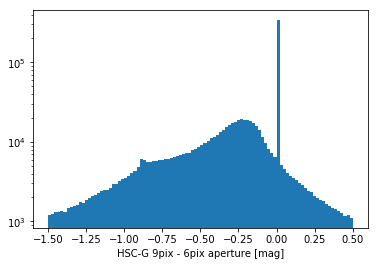

In [36]:
plt.hist(apDiff,range=[-1.5,0.5],bins=100)
plt.yscale('log')
#plt.xlim([-1.5,0.5])
plt.xlabel('HSC-G 9pix - 6pix aperture [mag]')

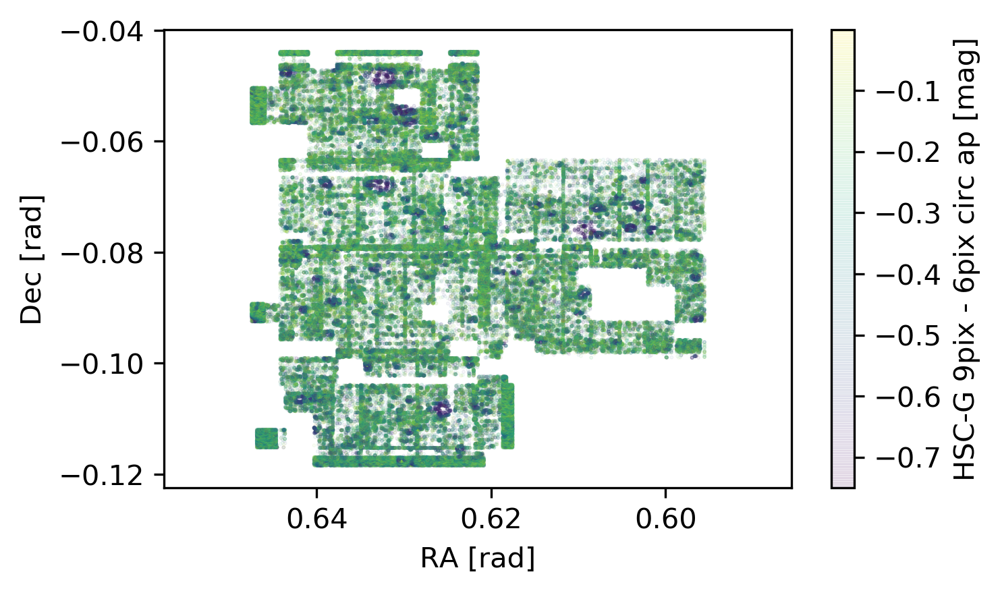

In [37]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=300)

im = ax.scatter(
    cat[m]['VISTA_Ks_m_coord_ra'],cat[m]['VISTA_Ks_m_coord_dec'],
    c=apDiff[m],
    s=0.1,alpha=0.1, rasterized=True)
fig.colorbar(im, ax=ax).set_label('HSC-G 9pix - 6pix circ ap [mag]')
ax.set_xlabel('RA [rad]')
ax.set_xlim([np.max(cat[m]['VISTA_Ks_m_coord_ra'])+0.01, np.min(cat[m]['VISTA_Ks_m_coord_ra'])-0.01])
ax.set_ylabel('Dec [rad]')
fig.savefig('./figs/apDiff_9-6_HSC-G.pdf', bbox_inches='tight')
fig.savefig('./figs/apDiff_9-6_HSC-G.png', bbox_inches='tight')

In [38]:
#aperture pix (radius) to arcsec
np.array([6,9,12,17])*0.168

array([1.008, 1.512, 2.016, 2.856])

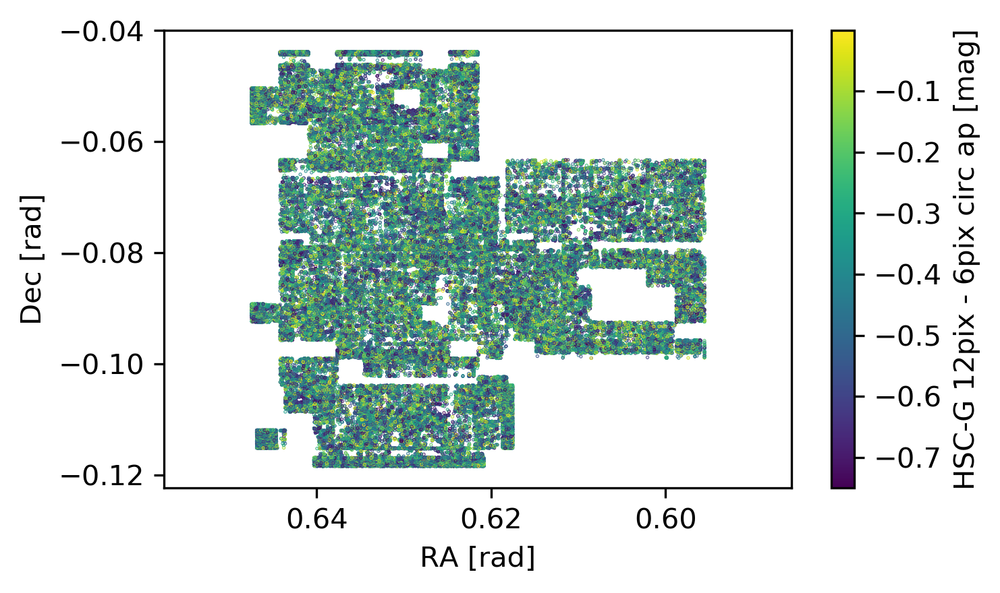

In [39]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=300)
apDiff = cat['HSC_G_m_base_CircularApertureFlux_12_0_mag'] - cat['HSC_G_m_base_CircularApertureFlux_6_0_mag']
m = apDiff > -0.75
m &= apDiff < 0
im = ax.scatter(cat[m]['VISTA_Ks_m_coord_ra'],cat[m]['VISTA_Ks_m_coord_dec'],c=apDiff[m],
                s=0.05,alpha=1., rasterized=True)
fig.colorbar(im, ax=ax).set_label('HSC-G 12pix - 6pix circ ap [mag]')
ax.set_xlabel('RA [rad]')
ax.set_xlim([np.max(cat[m]['VISTA_Ks_m_coord_ra'])+0.01, np.min(cat[m]['VISTA_Ks_m_coord_ra'])-0.01])
ax.set_ylabel('Dec [rad]')
fig.savefig('./figs/apDiff_12-6_HSC-G.pdf', bbox_inches='tight')
fig.savefig('./figs/apDiff_12-6_HSC-G.png', bbox_inches='tight')

Text(0.5, 0, 'HSC-G 12pix - 6pix aperture [mag]')

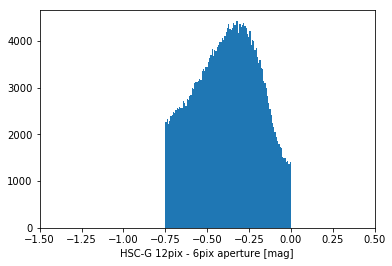

In [40]:
plt.hist(apDiff[m],bins=100)
plt.xlim([-1.5,0.5])
plt.xlabel('HSC-G 12pix - 6pix aperture [mag]')

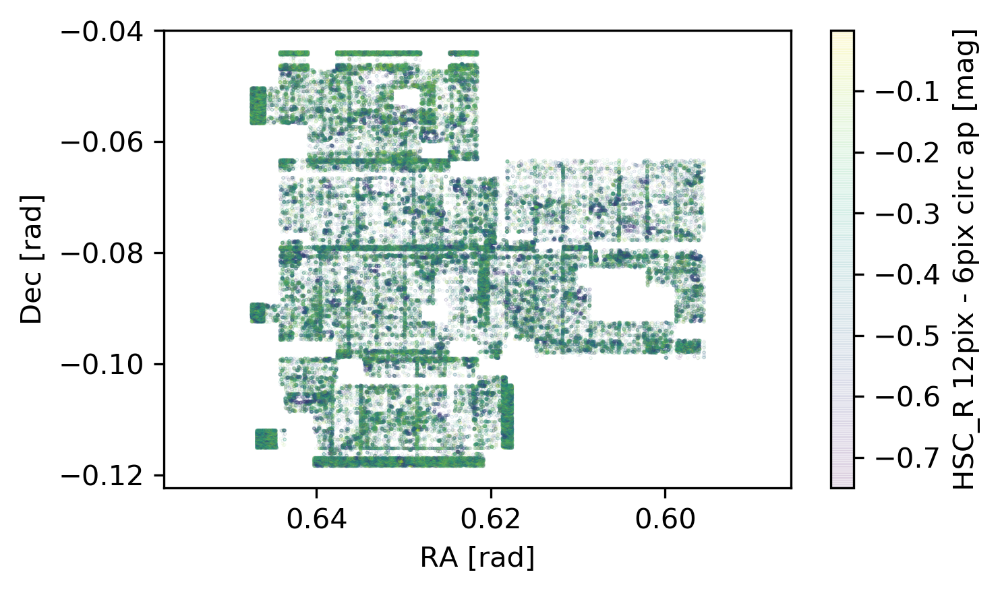

In [41]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=300)
apDiff = cat['HSC_R_m_base_CircularApertureFlux_12_0_mag'] - cat['HSC_R_m_base_CircularApertureFlux_6_0_mag']
m = apDiff > -0.75
m &= apDiff < 0
im = ax.scatter(cat[m]['VISTA_Ks_m_coord_ra'],cat[m]['VISTA_Ks_m_coord_dec'],c=apDiff[m],
                s=0.05,alpha=0.1, rasterized=True)
fig.colorbar(im, ax=ax).set_label('HSC_R 12pix - 6pix circ ap [mag]')
ax.set_xlabel('RA [rad]')
ax.set_xlim([np.max(cat[m]['VISTA_Ks_m_coord_ra'])+0.01, np.min(cat[m]['VISTA_Ks_m_coord_ra'])-0.01])
ax.set_ylabel('Dec [rad]')
fig.savefig('./figs/apDiff_12-6_HSC-R.pdf', bbox_inches='tight')
fig.savefig('./figs/apDiff_12-6_HSC-R.png', bbox_inches='tight')

Text(0.5, 0, 'HSC-R 12pix - 6pix aperture [mag]')

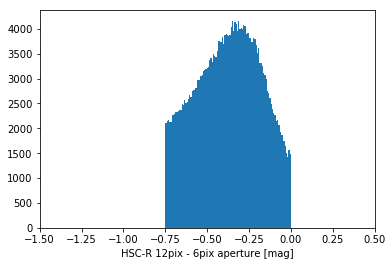

In [42]:
plt.hist(apDiff[m],bins=100)
plt.xlim([-1.5,0.5])
plt.xlabel('HSC-R 12pix - 6pix aperture [mag]')

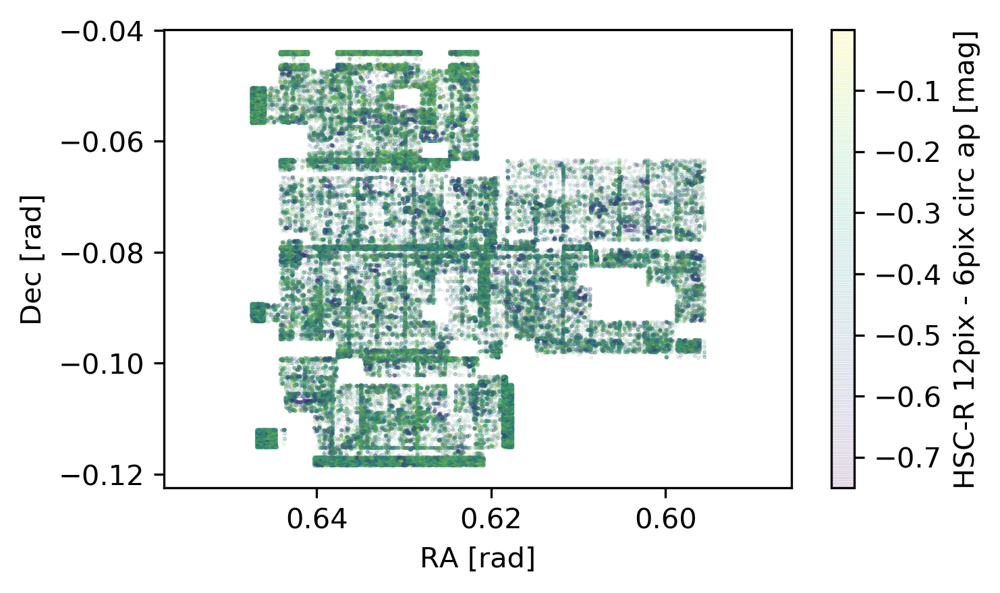

In [43]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=300)
apDiff = cat['HSC_R_m_base_CircularApertureFlux_12_0_mag'] - cat['HSC_R_m_base_CircularApertureFlux_6_0_mag']
m = apDiff > -0.75
m &= apDiff < 0
im = ax.scatter(cat[m]['VISTA_Ks_m_coord_ra'],cat[m]['VISTA_Ks_m_coord_dec'],c=apDiff[m],
                s=0.1,alpha=0.1, rasterized=True)
fig.colorbar(im, ax=ax).set_label('HSC-R 12pix - 6pix circ ap [mag]')
ax.set_xlabel('RA [rad]')
ax.set_xlim([np.max(cat[m]['VISTA_Ks_m_coord_ra'])+0.01, np.min(cat[m]['VISTA_Ks_m_coord_ra'])-0.01])
ax.set_ylabel('Dec [rad]')
fig.savefig('./figs/apDiff_12-6_HSC-R.pdf', bbox_inches='tight')
fig.savefig('./figs/apDiff_12-6_HSC-R.png', bbox_inches='tight')

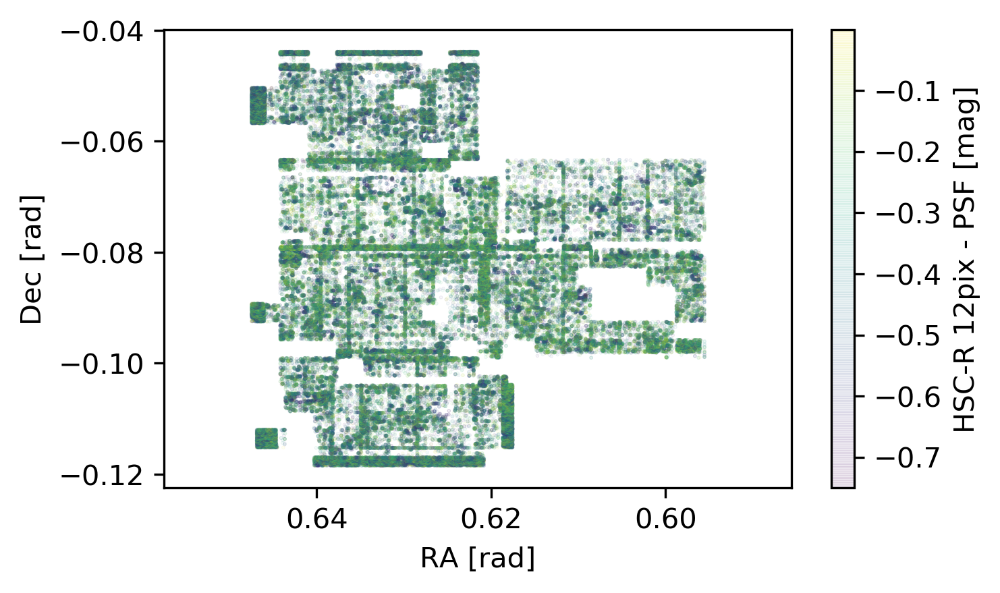

In [44]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=300)
apDiff = cat['HSC_R_m_base_CircularApertureFlux_12_0_mag'] - cat['HSC_R_m_base_PsfFlux_mag']
m = apDiff > -0.75
m &= apDiff < 0
im = ax.scatter(cat[m]['VISTA_Ks_m_coord_ra'],cat[m]['VISTA_Ks_m_coord_dec'],c=apDiff[m],
                s=0.1,alpha=0.1, rasterized=True)
fig.colorbar(im, ax=ax).set_label('HSC-R 12pix - PSF [mag]')
ax.set_xlabel('RA [rad]')
ax.set_xlim([np.max(cat[m]['VISTA_Ks_m_coord_ra'])+0.01, np.min(cat[m]['VISTA_Ks_m_coord_ra'])-0.01])
ax.set_ylabel('Dec [rad]')
fig.savefig('./figs/apDiff_12-psf_HSC-R.pdf', bbox_inches='tight')
fig.savefig('./figs/apDiff_12-psf_HSC-R.png', bbox_inches='tight')

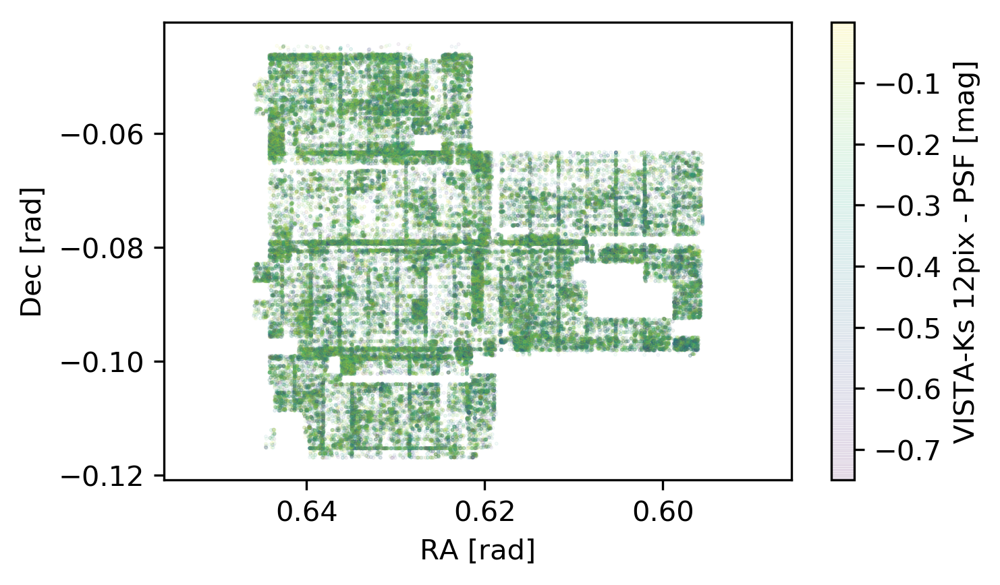

In [45]:
fig, ax = plt.subplots(figsize=(5, 3), dpi=300)
apDiff = cat['VISTA_Ks_m_base_CircularApertureFlux_12_0_mag'] - cat['VISTA_Ks_m_base_PsfFlux_mag']
m = apDiff > -0.75
m &= apDiff < 0
im = ax.scatter(cat[m]['VISTA_Ks_m_coord_ra'],cat[m]['VISTA_Ks_m_coord_dec'],c=apDiff[m],
                s=0.1,alpha=0.1, rasterized=True)
fig.colorbar(im, ax=ax).set_label('VISTA-Ks 12pix - PSF [mag]')
ax.set_xlabel('RA [rad]')
ax.set_xlim([np.max(cat[m]['VISTA_Ks_m_coord_ra'])+0.01, np.min(cat[m]['VISTA_Ks_m_coord_ra'])-0.01])
ax.set_ylabel('Dec [rad]')
fig.savefig('./figs/apDiff_12-psf_VISTA-Ks.pdf', bbox_inches='tight')
fig.savefig('./figs/apDiff_12-psf_VISTA-Ks.png', bbox_inches='tight')

## Oxford Ks selected 2 arcsec aperture catalogue

In [67]:
#From email from Manda
oxfordApCorr = {
    'HSC_G_2as':0.1765,
    'HSC_G_3as':0.0788,
    'HSC_R_2as':0.1638,
    'HSC_R_3as':0.0905,
    'HSC_I_2as':0.1512,
    'HSC_I_3as':0.0788,
    'HSC_Z_2as':0.2155,
    'HSC_Z_3as':0.1144,
    'HSC_Y_2as':0.2023,
    'HSC_Y_3as':0.1144,
    'VISTA_Z_2as':0.3567,
    'VISTA_Z_3as':0.2023,
    'VISTA_Y_2as':0.3567,
    'VISTA_Y_3as':0.2023,
    'VISTA_J_2as':0.2980,
    'VISTA_J_3as':0.1765,
    'VISTA_H_2as':0.2423,
    'VISTA_H_3as':0.1512,
    'VISTA_Ks_2as':0.2288,
    'VISTA_Ks_3as':0.1388}

In [47]:
def flux_to_mag(fluxes, errors_on_fluxes=None):
    """Convert fluxes and errors to magnitudes
    Given flux densities in Jy with associated errors, this function returns
    the corresponding AB magnitudes en errors.
    The magnitudes are computed with this formula:
        M = 2.5 * (23 - log10(F)) - 48.6
    and the errors on magnitudes with this one
        M_err = 2.5/ln(10) * F_err / F
    Parameters
    ----------
    fluxes: float or array-like of floats
        The fluxes in Jy.
    errors_on_fluxes: float or array-like of floats
        The flux errors in Jy None if there are no errors.
    Returns
    -------
    magnitudes: float or array-like of floats
        The AB magnitudes.
    errors: float or array-like of floats
        The errors on AB magnitudes.
    """
    fluxes = np.array(fluxes)
    magnitudes = 2.5 * (23 - np.log10(fluxes)) - 48.6

    if errors_on_fluxes is not None:
        errors_on_fluxes = np.array(errors_on_fluxes)
        errors = 2.5 / np.log(10) * errors_on_fluxes / fluxes
    else:
        errors = None

    return magnitudes, errors

In [48]:
def mag_to_flux(magnitudes, errors_on_magnitudes=None):
    """Convert AB magnitudes and errors to fluxes
    Given AB magnitudes and associated errors, this function returns the
    corresponding fluxes and associated flux errors (in Jy).
    The fluxes are computed with this formula:
        F = 10^((8.9 - Mag)/2.5)
    and the errors on fluxes with this one:
        F_err = ln(10)/2.5 * F * Mag_err
    Parameters
    ----------
    magnitudes: float or array-like of floats
        AB magnitudes of the sources.
    errors_on_magnitudes: float or array-like of floats
        Error on each magnitudes. None if there are no errors.
    Returns
    -------
    fluxes: float or array-like of floats
        The fluxes in Jy.
    errors: float or array-like of floats
        The errors on fluxes in Jy or None.
    """
    magnitudes = np.array(magnitudes)
    fluxes = 10 ** ((8.9 - magnitudes)/2.5)

    if errors_on_magnitudes is not None:
        errors_on_magnitudes = np.array(errors_on_magnitudes)
        errors = np.log(10)/2.5 * fluxes * errors_on_magnitudes
    else:
        errors = None

    return fluxes, errors

In [49]:
imported_columns = OrderedDict({
        'ID_se':              'id', 
        'RA':     'ra', 
        'DEC':     'dec', 
    
        #'J_CLASS_STAR':    'vista_stellarity', 
        'flux_HSC-G':    'f_ap_hsc_g', 
        'err_HSC-G':     'ferr_ap_hsc_g',
        'flux_HSC-R':    'f_ap_hsc_r', 
        'err_HSC-R':     'ferr_ap_hsc_r',
        'flux_HSC-I':    'f_ap_hsc_i', 
        'err_HSC-I':     'ferr_ap_hsc_i',
        'flux_HSC-Z':    'f_ap_hsc_z', 
        'err_HSC-Z':     'ferr_ap_hsc_z',
        'flux_HSC-Y':    'f_ap_hsc_y', 
        'err_HSC-Y':     'ferr_ap_hsc_y',
    
        'flux_Z':    'f_ap_vista_z', 
        'err_Z': 'ferr_ap_vista_z', 
    
        'flux_Y':    'f_ap_vista_y', 
        'err_Y': 'ferr_ap_vista_y', 

    
        'flux_J':    'f_ap_vista_j', 
        'err_J': 'ferr_ap_vista_j', 

    
        'flux_H':    'f_ap_vista_h', 
        'err_H': 'ferr_ap_vista_h', 

  
        'flux_Ks':    'f_ap_vista_ks', 
        'err_Ks': 'ferr_ap_vista_ks', 


})


oxford_ks_cat = Table.read(OXFORD_VISTA_Ks_CAT
                      )[list(imported_columns)]


for column in imported_columns:
    oxford_ks_cat[column].name = 'oxford_ks_' + imported_columns[column]
    

    
oxford_ks_cat['oxford_ks_ra'].unit = u.deg
oxford_ks_cat['oxford_ks_dec'].unit = u.deg
oxford_ks_cat['oxford_ks_ra'].convert_unit_to(u.rad)
oxford_ks_cat['oxford_ks_dec'].convert_unit_to(u.rad)
oxford_ks_cat['oxford_ks_ra_temp'] = oxford_ks_cat['oxford_ks_ra']
oxford_ks_cat['oxford_ks_dec_temp'] = oxford_ks_cat['oxford_ks_dec']
print(len(oxford_ks_cat))



1674689


In [50]:
for col in oxford_ks_cat.colnames:
    if col.startswith('oxford_ks_f_'):
        err_col = col.replace('_f_', '_ferr_')
        oxford_ks_cat[col].unit = u.erg/u.second/u.cm**2/u.Hz
        oxford_ks_cat[err_col].unit = u.erg/u.second/u.cm**2/u.Hz
        oxford_ks_cat[col].convert_unit_to(u.uJy)
        oxford_ks_cat[err_col].convert_unit_to(u.uJy)
        m,merr = flux_to_mag(oxford_ks_cat[col]*1e-6,oxford_ks_cat[err_col]*1e-6) # expects Jansky
        oxford_ks_cat[col.replace('_f_', '_m_')] = m
        oxford_ks_cat[err_col.replace('_ferr_', '_merr_')] = merr
        oxford_ks_cat.remove_columns([col,err_col])
        
for col in oxford_ks_cat.colnames:
    if col.startswith('oxford_ks_merr_ap_'):
        mask = np.isnan(oxford_ks_cat[col.replace('_merr_','_m_')])
        oxford_ks_cat[col][mask] = np.nan

In [51]:
oxford_ks_cat[:5]

oxford_ks_id,oxford_ks_ra,oxford_ks_dec,oxford_ks_ra_temp,oxford_ks_dec_temp,oxford_ks_m_ap_hsc_g,oxford_ks_merr_ap_hsc_g,oxford_ks_m_ap_hsc_r,oxford_ks_merr_ap_hsc_r,oxford_ks_m_ap_hsc_i,oxford_ks_merr_ap_hsc_i,oxford_ks_m_ap_hsc_z,oxford_ks_merr_ap_hsc_z,oxford_ks_m_ap_hsc_y,oxford_ks_merr_ap_hsc_y,oxford_ks_m_ap_vista_z,oxford_ks_merr_ap_vista_z,oxford_ks_m_ap_vista_y,oxford_ks_merr_ap_vista_y,oxford_ks_m_ap_vista_j,oxford_ks_merr_ap_vista_j,oxford_ks_m_ap_vista_h,oxford_ks_merr_ap_vista_h,oxford_ks_m_ap_vista_ks,oxford_ks_merr_ap_vista_ks
,rad,rad,rad,rad,,,,,,,,,,,,,,,,,,,,
int32,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
610230,0.5907544,-0.0740255,0.5907544,-0.0740255,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,23.51136806866848,0.08117940873388083,23.42667837493233,0.09837763124305875,23.348985208541954,0.1754785660292326,23.509918840163785,0.32529878294591613,23.191595148598587,0.3486519490883467
128492,0.5907544,-0.0930592,0.5907544,-0.0930592,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,24.345420029879214,0.19377923558638968,24.38773846488794,0.2798516947215229,23.83280702516354,0.27743550802398564,24.227959920902997,0.6122337068263823,23.713185441998085,0.5757357015911263
451090,0.5907545,-0.0805257,0.5907545,-0.0805257,27.299112183239536,0.49519799512891294,26.325546700349626,0.24590864677242497,26.263033083119772,0.3080047808297085,25.247983519380107,0.2564447218305123,24.579630210252184,0.28593100321779374,24.96202409688828,0.24255712621980113,24.841637076320033,0.3553323557924524,23.64103405378348,0.16964590104051813,23.126136714913535,0.18700435092666212,22.79896338529968,0.21297468202846717
173887,0.5907545,-0.0912285,0.5907545,-0.0912285,26.175431891800464,0.26200902566124945,25.734131969222155,0.19772275918706606,25.739365896230076,0.30233755920668104,25.47831754238583,0.3282792959922551,24.752663802157706,0.4611871968012171,24.919500477555978,0.2621887599709726,25.055893282368736,0.4108622559296447,24.1003418270921,0.2703206051337284,24.77891338372286,1.0424263637514424,23.52062543977548,0.4657953973972276
69787,0.5907545,-0.0954864,0.5907545,-0.0954864,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,21.749579109349106,0.05428680848466388,21.770304679320752,0.05428680969541473,21.61856980834468,0.05428681008017425,21.539471159225876,0.05961130738787015,21.2813477685553,0.05563409496144291


In [52]:
vega_to_ab = {
    "z":0.502,  #D2 in Fernandez-Gonzalez 2018
    "y":0.600,  #D3
    "j":0.916,  #D4
    "h":1.366,  #D5
    "ks":1.827, #D6
    "b118":0.853
}

## HELP VISTA catalogues

In [53]:
imported_columns = OrderedDict({
        'ID':              'video_id', 
        'ALPHA_J2000':     'ra', 
        'DELTA_J2000':     'dec', 
        'J_CLASS_STAR':    'vista_stellarity', 
        'Z_MAG_APER_2':    'm_ap_vista_z', 
        'Z_MAGERR_APER_2': 'merr_ap_vista_z', 
        'Y_MAG_APER_2':    'm_ap_vista_y', 
        'Y_MAGERR_APER_2': 'merr_ap_vista_y', 
        #'Y_MAG_AUTO':      'm_vista_y', 
        #'Y_MAGERR_AUTO':   'merr_vista_y',
        #'Y_FLUX_APER_2':   'f_ap_vista_y', 
        #'Y_FLUXERR_APER_2':'ferr_ap_vista_y', 
        #'Y_FLUX_AUTO':     'f_vista_y', 
        #'Y_FLUXERR_AUTO':  'ferr_vista_y',
  
        'J_MAG_APER_2':    'm_ap_vista_j', 
        'J_MAGERR_APER_2': 'merr_ap_vista_j', 
            
        'H_MAG_APER_2':    'm_ap_vista_h', 
        'H_MAGERR_APER_2': 'merr_ap_vista_h', 
    
        'K_MAG_APER_2':    'm_ap_vista_ks', 
        'K_MAGERR_APER_2': 'merr_ap_vista_ks', 
        #'K_MAG_AUTO':      'm_vista_ks', 
        #'K_MAGERR_AUTO':   'merr_vista_ks',

})


help_cat = Table.read("../../dmu0/dmu0_VISTA/dmu0_VIDEO/data/VIDEO-all_2017-02-12_fullcat_errfix_v2_XMM-LSS.fits"
                      )[list(imported_columns)]
for column in imported_columns:
    help_cat[column].name = 'help_' + imported_columns[column]
help_cat['help_ra'].unit = u.deg
help_cat['help_dec'].unit = u.deg
help_cat['help_ra'].convert_unit_to(u.rad)
help_cat['help_dec'].convert_unit_to(u.rad)


m = (
    (help_cat['help_m_ap_vista_y'] > 30) 
    | (help_cat['help_m_ap_vista_j'] > 30) 
    | (help_cat['help_m_ap_vista_h'] > 30) 
    | (help_cat['help_m_ap_vista_ks'] > 30) 
)
help_cat['help_m_ap_vista_ks'][m] = np.nan
help_cat['help_merr_ap_vista_ks'][m] = np.nan
help_cat['help_m_ap_vista_y'][m] = np.nan
help_cat['help_merr_ap_vista_y'][m] = np.nan

for c in help_cat.colnames:
    if help_cat[c].dtype == 'float64':
        help_cat[c].fill_value=np.nan
    if help_cat[c].dtype == '>f4':
        help_cat[c] = help_cat[c].astype('float64')
        help_cat[c].fill_value=np.nan



In [54]:
help_cat['help_m_ap_vista_ks'].dtype

dtype('float64')

In [55]:
help_cat['help_ra_temp'] = help_cat['help_ra']
help_cat['help_dec_temp'] = help_cat['help_dec']

## HSC PDR2 public catalogues

In [56]:
from astropy.io import ascii
# ascii.read(table)  
imported_columns = OrderedDict({
        'object_id':                     'id', 
        'ra':                            'ra', 
        'dec':                          'dec', 
        'i_extendedness_value':          'stellarity', 
        'g_f_apertureflux_20_mag':       'm_ap_hsc_g', 
        'g_f_apertureflux_20_magsigma':  'merr_ap_hsc_g', 
        'r_f_apertureflux_20_mag':       'm_ap_hsc_r', 
        'r_f_apertureflux_20_magsigma':  'merr_ap_hsc_r', 
        'i_f_apertureflux_20_mag':       'm_ap_hsc_i', 
        'i_f_apertureflux_20_magsigma':  'merr_ap_hsc_i', 
        'z_f_apertureflux_20_mag':       'm_ap_hsc_z', 
        'z_f_apertureflux_20_magsigma':  'merr_ap_hsc_z', 
        'y_f_apertureflux_20_mag':       'm_ap_hsc_y', 
        'y_f_apertureflux_20_magsigma':  'merr_ap_hsc_y', 

})


hsc_cat = ascii.read("../../dmu0/dmu0_HSC/data/SXDS_DUD_PDR2_2.csv.gz")[list(imported_columns)]
for column in imported_columns:
    hsc_cat[column].name = 'hsc_' + imported_columns[column]
hsc_cat['hsc_ra'].unit = u.deg
hsc_cat['hsc_dec'].unit = u.deg
hsc_cat['hsc_ra'].convert_unit_to(u.rad)
hsc_cat['hsc_dec'].convert_unit_to(u.rad)

In [57]:
hsc_cat['hsc_ra_temp']=hsc_cat['hsc_ra']
hsc_cat['hsc_dec_temp']=hsc_cat['hsc_dec']

In [58]:
hsc_cat[:5]

hsc_id,hsc_ra,hsc_dec,hsc_stellarity,hsc_m_ap_hsc_g,hsc_merr_ap_hsc_g,hsc_m_ap_hsc_r,hsc_merr_ap_hsc_r,hsc_m_ap_hsc_i,hsc_merr_ap_hsc_i,hsc_m_ap_hsc_z,hsc_merr_ap_hsc_z,hsc_m_ap_hsc_y,hsc_merr_ap_hsc_y,hsc_ra_temp,hsc_dec_temp
,rad,rad,,,,,,,,,,,,rad,rad
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
36429186755198987,0.6341584902541832,-0.10561646245163053,--,26.1936207,0.364179522,25.7221451,0.325779706,--,--,25.4872169,0.58087647,nan,nan,0.6341584902541832,-0.10561646245163053
36429186755198992,0.6341076887771442,-0.10560605482779505,--,27.5516491,1.27126408,29.3405437,9.52805996,--,--,25.4492302,0.552094877,26.6622219,4.71338558,0.6341076887771442,-0.10560605482779505
36429186755199040,0.6340247828038009,-0.10546110153078861,--,21.4808617,0.00559403701,21.0988274,0.00508833583,--,--,21.0475349,0.00983546767,20.9458504,0.0256726351,0.6340247828038009,-0.10546110153078861
36429186755199464,0.6342999899552864,-0.1055509031829372,--,23.5741768,0.0334478356,22.6499825,0.0199977383,--,--,22.0921211,0.02552866,21.8058796,inf,0.6342999899552864,-0.1055509031829372
36429186755199486,0.6339861048095488,-0.10545538838066325,--,25.6684761,0.222158194,25.3239422,0.235975683,--,--,25.2776508,0.465150356,24.409359,0.580893278,0.6339861048095488,-0.10545538838066325


## Merge the catalogues with cross match

In [59]:
import logging
LOGGER = logging.getLogger(__name__)
from astropy.coordinates import SkyCoord, Angle
import astropy.units as u
from collections import Counter
from astropy.table import Table, Column, hstack, vstack
def merge_catalogues(cat_1, cat_2, racol_2, decol_2, radius=0.4*u.arcsec):
    """Merge two catalogues
    This function merges the second catalogue into the first one using the
    given radius to associate identical sources.  This function takes care to
    associate only one source of one catalogue to the other.  The sources that
    may be associated to various counterparts in the other catalogue are
    flagged as “maybe spurious association” with a true value in the
    flag_merged column.  If this column is present in the first catalogue, it's
    content is “inherited” during the merge.
    Parameters
    ----------
    cat_1: astropy.table.Table
        The table containing the first catalogue.  This is the master catalogue
        used during the merge.  If it has a “flag_merged” column it's content
        will be re-used in the flagging of the spurious merges.  This catalogue
        must contain a ‘ra’ and a ‘dec’ columns with the position in decimal
        degrees.
    cat_2: astropy.table.Table
        The table containing the second catalogue.
    racol_2: string
        Name of the column in the second table containing the right ascension
        in decimal degrees.
    decol_2: string
        Name of the column in the second table containing the declination in
        decimal degrees.
    radius: astropy.units.quantity.Quantity
        The radius to associate identical sources in the two catalogues.
    Returns
    -------
    astropy.table.Table
        The merged catalogue.
    """
    cat_1 = cat_1.copy()
    cat_2 = cat_2.copy()
    cat_1['ra'].unit = u.rad
    cat_1['dec'].unit = u.rad
    coords_1 = SkyCoord(cat_1['ra'], cat_1['dec'])

    
    cat_2[racol_2].unit = u.rad
    cat_2[decol_2].unit = u.rad
    coords_2 = SkyCoord(cat_2[racol_2], cat_2[decol_2])

    # Search for sources in second catalogue matching the sources in the first
    # one.
    idx_2, idx_1, d2d, _ = coords_1.search_around_sky(coords_2, radius)

    # We want to flag the possible mis-associations, i.e. the sources in each
    # catalogue that are associated to several sources in the other one, but
    # also all the sources that are associated to a problematic source in the
    # other catalogue (e.g. if two sources in the first catalogue are
    # associated to the same source in the second catalogue, they must be
    # flagged as potentially problematic).
    #
    # Search for duplicate associations
    toflag_idx_1 = np.unique([item for item, count in Counter(idx_1).items()
                              if count > 1])
    toflag_idx_2 = np.unique([item for item, count in Counter(idx_2).items()
                              if count > 1])
    # Flagging the sources associated to duplicates
    dup_associated_in_idx1 = np.in1d(idx_2, toflag_idx_2)
    dup_associated_in_idx2 = np.in1d(idx_1, toflag_idx_1)
    toflag_idx_1 = np.unique(np.concatenate(
        (toflag_idx_1, idx_1[dup_associated_in_idx1])
    ))
    toflag_idx_2 = np.unique(np.concatenate(
        (toflag_idx_2, idx_2[dup_associated_in_idx2])
    ))

    # Adding the flags to the catalogue.  In the second catalogue, the column
    # is named "flag_merged_2" and will be combined to the flag_merged column
    # one the merge is done.
    try:
        cat_1["flag_merged"] |= np.in1d(np.arange(len(cat_1), dtype=int),
                                        toflag_idx_1)
    except KeyError:
        cat_1.add_column(Column(
            data=np.in1d(np.arange(len(cat_1), dtype=int), toflag_idx_1),
            name="flag_merged"
        ))
    try:
        cat_2["flag_merged_2"] |= np.in1d(np.arange(len(cat_2), dtype=int), toflag_idx_2)
    except KeyError:
        cat_2.add_column(Column(
            data=np.in1d(np.arange(len(cat_2), dtype=int), toflag_idx_2),
            name="flag_merged_2"
        ))


    # Now that we have flagged the maybe spurious associations, we want to
    # associate each source of each catalogue to at most one source in the
    # other one.

    # We sort the indices by the distance to take the nearest counterparts in
    # the following steps.
    sort_idx = np.argsort(d2d)
    idx_1 = idx_1[sort_idx]
    idx_2 = idx_2[sort_idx]

    # These array will contain the indexes of the matching sources in both
    # catalogues.
    match_idx_1 = np.array([], dtype=int)
    match_idx_2 = np.array([], dtype=int)

    while len(idx_1) > 0:

        both_first_idx = np.sort(np.intersect1d(
            np.unique(idx_1, return_index=True)[1],
            np.unique(idx_2, return_index=True)[1],
        ))

        new_match_idx_1 = idx_1[both_first_idx]
        new_match_idx_2 = idx_2[both_first_idx]

        match_idx_1 = np.concatenate((match_idx_1, new_match_idx_1))
        match_idx_2 = np.concatenate((match_idx_2, new_match_idx_2))

        # We remove the matching sources in both catalogues.
        to_remove = (np.in1d(idx_1, new_match_idx_1) |
                     np.in1d(idx_2, new_match_idx_2))
        idx_1 = idx_1[~to_remove]
        idx_2 = idx_2[~to_remove]

    # Indices of un-associated object in both catalogues.
    unmatched_idx_1 = np.delete(np.arange(len(cat_1), dtype=int),match_idx_1)
    unmatched_idx_2 = np.delete(np.arange(len(cat_2), dtype=int),match_idx_2)

    # Sources only in cat_1
    only_in_cat_1 = cat_1[unmatched_idx_1]

    # Sources only in cat_2
    only_in_cat_2 = cat_2[unmatched_idx_2]
    # We are using the ra and dec columns from cat_2 for the position.
    only_in_cat_2[racol_2].name = "ra"
    only_in_cat_2[decol_2].name = "dec"

    # Merged table of sources in both catalogues.
    both_in_cat_1_and_cat_2 = hstack([cat_1[match_idx_1], cat_2[match_idx_2]])
    # We don't need the positions from the second catalogue anymore.
    both_in_cat_1_and_cat_2.remove_columns([racol_2, decol_2])

    # Logging the number of rows
    LOGGER.info("There are %s sources only in the first catalogue",
                len(only_in_cat_1))
    LOGGER.info("There are %s sources only in the second catalogue",
                len(only_in_cat_2))
    LOGGER.info("There are %s sources in both catalogues",
                len(both_in_cat_1_and_cat_2))

    merged_catalogue = vstack([only_in_cat_1, both_in_cat_1_and_cat_2,
                               only_in_cat_2])

    # When vertically stacking the catalogues, some values in the flag columns
    # are masked because they did not exist in the catalogue some row originate
    # from. We must set them to the appropriate value.
    for colname in merged_catalogue.colnames:
        if 'flag' in colname:
            merged_catalogue[colname][merged_catalogue[colname].mask] = False

    # We combined the flag_merged flags
    merged_catalogue['flag_merged'] |= merged_catalogue['flag_merged_2']
    merged_catalogue.remove_column('flag_merged_2')

    return merged_catalogue

In [60]:
merge=merge_catalogues(cat, oxford_ks_cat, 'oxford_ks_ra_temp', 'oxford_ks_dec_temp')
merge=merge_catalogues(merge, help_cat, 'help_ra_temp', 'help_dec_temp')
merge=merge_catalogues(merge, hsc_cat, 'hsc_ra_temp', 'hsc_dec_temp')
for col in merge.colnames:
    if merge[col].dtype == 'float64':
        #print(col)
        merge[col].fill_value = np.nan
merge= merge.filled()
for col in merge.colnames:
    if merge[col].dtype == 'float64':
        #print(col)
        mask = np.isinf(merge[col])
        mask |= merge[col]>1e19
        merge[col][mask] = np.nan

In [61]:
np.sum(merge['oxford_ks_id']==999999), np.sum(
    merge['id']==999999), np.sum((merge['id']!=999999) & (merge['id']!=999999))

(4850318, 5246181, 1278826)

In [62]:
merge[:5]

id,VISTA_Ks_m_coord_ra,VISTA_Ks_m_coord_dec,VISTA_Ks_m_detect_isPatchInner,VISTA_Ks_m_detect_isTractInner,HSC_G_m_base_CircularApertureFlux_12_0_mag,HSC_G_m_base_CircularApertureFlux_12_0_magErr,HSC_G_m_base_CircularApertureFlux_6_0_mag,HSC_G_m_base_CircularApertureFlux_6_0_magErr,HSC_G_m_base_CircularApertureFlux_9_0_mag,HSC_G_m_base_PsfFlux_mag,HSC_G_m_base_PsfFlux_magErr,HSC_R_m_base_CircularApertureFlux_12_0_mag,HSC_R_m_base_CircularApertureFlux_12_0_magErr,HSC_R_m_base_CircularApertureFlux_6_0_mag,HSC_R_m_base_CircularApertureFlux_6_0_magErr,HSC_R_m_base_CircularApertureFlux_9_0_mag,HSC_R_m_base_PsfFlux_mag,HSC_R_m_base_PsfFlux_magErr,HSC_I_m_base_CircularApertureFlux_12_0_mag,HSC_I_m_base_CircularApertureFlux_12_0_magErr,HSC_I_m_base_CircularApertureFlux_6_0_mag,HSC_I_m_base_CircularApertureFlux_6_0_magErr,HSC_I_m_base_CircularApertureFlux_9_0_mag,HSC_I_m_base_PsfFlux_mag,HSC_I_m_base_PsfFlux_magErr,HSC_Z_m_base_CircularApertureFlux_12_0_mag,HSC_Z_m_base_CircularApertureFlux_12_0_magErr,HSC_Z_m_base_CircularApertureFlux_6_0_mag,HSC_Z_m_base_CircularApertureFlux_6_0_magErr,HSC_Z_m_base_CircularApertureFlux_9_0_mag,HSC_Z_m_base_PsfFlux_mag,HSC_Z_m_base_PsfFlux_magErr,HSC_Y_m_base_CircularApertureFlux_12_0_mag,HSC_Y_m_base_CircularApertureFlux_12_0_magErr,HSC_Y_m_base_CircularApertureFlux_6_0_mag,HSC_Y_m_base_CircularApertureFlux_6_0_magErr,HSC_Y_m_base_CircularApertureFlux_9_0_mag,HSC_Y_m_base_PsfFlux_mag,HSC_Y_m_base_PsfFlux_magErr,VISTA_Z_m_base_CircularApertureFlux_12_0_mag,VISTA_Z_m_base_CircularApertureFlux_12_0_magErr,VISTA_Z_m_base_CircularApertureFlux_6_0_mag,VISTA_Z_m_base_CircularApertureFlux_6_0_magErr,VISTA_Z_m_base_CircularApertureFlux_9_0_mag,VISTA_Z_m_base_PsfFlux_mag,VISTA_Z_m_base_PsfFlux_magErr,VISTA_Y_m_base_CircularApertureFlux_12_0_mag,VISTA_Y_m_base_CircularApertureFlux_12_0_magErr,VISTA_Y_m_base_CircularApertureFlux_6_0_mag,VISTA_Y_m_base_CircularApertureFlux_6_0_magErr,VISTA_Y_m_base_CircularApertureFlux_9_0_mag,VISTA_Y_m_base_PsfFlux_mag,VISTA_Y_m_base_PsfFlux_magErr,VISTA_J_m_base_CircularApertureFlux_12_0_mag,VISTA_J_m_base_CircularApertureFlux_12_0_magErr,VISTA_J_m_base_CircularApertureFlux_6_0_mag,VISTA_J_m_base_CircularApertureFlux_6_0_magErr,VISTA_J_m_base_CircularApertureFlux_9_0_mag,VISTA_J_m_base_PsfFlux_mag,VISTA_J_m_base_PsfFlux_magErr,VISTA_H_m_base_CircularApertureFlux_12_0_mag,VISTA_H_m_base_CircularApertureFlux_12_0_magErr,VISTA_H_m_base_CircularApertureFlux_6_0_mag,VISTA_H_m_base_CircularApertureFlux_6_0_magErr,VISTA_H_m_base_CircularApertureFlux_9_0_mag,VISTA_H_m_base_PsfFlux_mag,VISTA_H_m_base_PsfFlux_magErr,VISTA_Ks_m_base_CircularApertureFlux_12_0_mag,VISTA_Ks_m_base_CircularApertureFlux_12_0_magErr,VISTA_Ks_m_base_CircularApertureFlux_6_0_mag,VISTA_Ks_m_base_CircularApertureFlux_6_0_magErr,VISTA_Ks_m_base_CircularApertureFlux_9_0_mag,VISTA_Ks_m_base_PsfFlux_mag,VISTA_Ks_m_base_PsfFlux_magErr,ra,dec,flag_merged,oxford_ks_id,oxford_ks_ra,oxford_ks_dec,oxford_ks_m_ap_hsc_g,oxford_ks_merr_ap_hsc_g,oxford_ks_m_ap_hsc_r,oxford_ks_merr_ap_hsc_r,oxford_ks_m_ap_hsc_i,oxford_ks_merr_ap_hsc_i,oxford_ks_m_ap_hsc_z,oxford_ks_merr_ap_hsc_z,oxford_ks_m_ap_hsc_y,oxford_ks_merr_ap_hsc_y,oxford_ks_m_ap_vista_z,oxford_ks_merr_ap_vista_z,oxford_ks_m_ap_vista_y,oxford_ks_merr_ap_vista_y,oxford_ks_m_ap_vista_j,oxford_ks_merr_ap_vista_j,oxford_ks_m_ap_vista_h,oxford_ks_merr_ap_vista_h,oxford_ks_m_ap_vista_ks,oxford_ks_merr_ap_vista_ks,help_video_id,help_ra,help_dec,help_vista_stellarity,help_m_ap_vista_z,help_merr_ap_vista_z,help_m_ap_vista_y,help_merr_ap_vista_y,help_m_ap_vista_j,help_merr_ap_vista_j,help_m_ap_vista_h,help_merr_ap_vista_h,help_m_ap_vista_ks,help_merr_ap_vista_ks,hsc_id,hsc_ra,hsc_dec,hsc_stellarity,hsc_m_ap_hsc_g,hsc_merr_ap_hsc_g,hsc_m_ap_hsc_r,hsc_merr_ap_hsc_r,hsc_m_ap_hsc_i,hsc_merr_ap_hsc_i,hsc_m_ap_hsc_z,hsc_merr_ap_hsc_z,hsc_m_ap_hsc_y,hsc_merr_ap_hsc_y
,rad,rad,,,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,m

## Plot comparisons

Comparing VISTA_Ks band AB 2 arc sec aperture magnitudes from LSST and Oxford. 
LSST circular aperture magnitudes in 2 arcsec radius are not curve of growth corrected.
Oxford aperture correction: 0.2288
Mean offset = 0.443
Median offset = 0.128
Weighted bias (16<mag<18) = 0.276


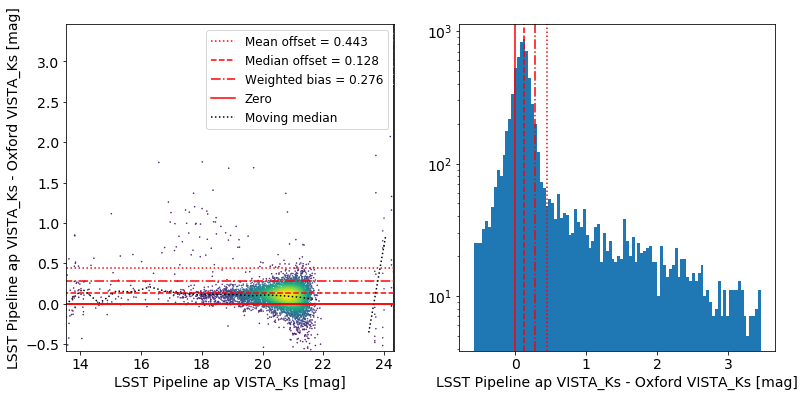

In [69]:

    
def mag_diff(x,xerr,y,yerr, labels,savefig=False,bins = [20,20], sort = True,**kwargs):
    """Plot magnitude offsets for two catalogues"""
    #if 'ap' in labels[0]:
        #print("Comparing {} band AB 2 arc sec aperture magnitudes from {} and {}".format(labels[2],labels[0],labels[1]))
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    #ax3 = plt.subplot(gs2[:, -1], sharey=ax2)
    m = ~np.isnan(x) & ~np.isnan(y)
    x=x[m]
    y=y[m]
    xerr=xerr[m]
    yerr=yerr[m]


    mean_offset = np.nanmean(x - y)
    median_offset = np.nanmedian(x - y)
    print("Mean offset = {}".format(round(mean_offset,4)))
    print("Median offset = {}".format(round(median_offset,4)))
    
    total_var = xerr**2 + yerr**2 #+ 0.03**2 #the extra 0.03 is an estimate of the abs. cal. error for vista
    unsaturated = (x>16) & (x<18) #& m

    weighted_bias = np.nansum(
        (
            x[unsaturated]
            -y[unsaturated]
        )/total_var[unsaturated]
    )/np.nansum(1./total_var[unsaturated])
    print('Weighted bias (16<mag<18) = {}'.format(round(weighted_bias,4)))
    
    
    ax1.plot([0,100],[mean_offset,mean_offset], linestyle='dotted', c='r', alpha=1,
             label = 'Mean offset = {}'.format(round(mean_offset,4)))
    ax1.plot([0,100],[median_offset,median_offset], linestyle='dashed', c='r', alpha=1,
         label = 'Median offset = {}'.format(round(median_offset,4)))
    ax1.plot([0,100],[weighted_bias,weighted_bias], linestyle='dashdot', c='r', alpha=1,
         label = 'Weighted bias = {}'.format(round(weighted_bias,4)))
    ax1.plot([0,100],[0,0], c='r', label='Zero')
    

    n, edges = np.histogram(x, bins=20)
    medians = [np.nanmedian((x-y)[(x>edges[a]) & (x<edges[a+1])]) for a in np.arange(len(n))]
    ax1.plot([np.mean([edges[a], edges[a+1]]) for a in np.arange(len(edges[:-1]))], medians, 
             c='k',linestyle='dotted',label='Moving median')
    
    
    ax1.legend( prop={'size': 12})#, loc='lower left')
    
    x_lims = [np.nanpercentile(x,.1),np.nanpercentile(x,97.5)]
    y_lims= [np.nanpercentile(x-y,2.5),np.nanpercentile(x-y,97.5)]
    in_window = x>x_lims[0] -0.2
    in_window &= x<x_lims[1] +1.
    in_window &= x-y>y_lims[0] 
    in_window &= x-y<y_lims[1]
    x = x[in_window]
    y = y[in_window]
    
    data , x_e, y_e = np.histogram2d( x,  x - y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , 
                data , np.vstack([x, x - y]).T, method = "splinef2d" , bounds_error = False)#, method = "splinef2d"

    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    # Sort the points by density, so that the densest points are plotted last
    if sort :
        idx = z.argsort()
        x, y, z = x[idx], y[idx], z[idx]
        
    ax1.scatter(x,   x - y, c=z,
            alpha=1., s=0.3, rasterized=True)#,cmap='Greys')
    
    
    ax1.set_xlabel('{} [mag]'.format(labels[0]))
    ax1.plot([0,100],[0,0], c='r')
    
    #upper = np.min([25.,np.nanmax(x),np.nanmax(y)+1] )
    ax1.set_xlim(x_lims)
    ax1.set_ylim(y_lims)
    ax1.set_ylabel('{} - {} [mag]'.format(labels[0],labels[1]))
    
    ax2.hist(x - y,range=y_lims, bins=100)
    ax2.set_yscale('log')
    ax2.set_xlabel('{} - {} [mag]'.format(labels[0],labels[1]))
    ax2.axvline(0, c='r', alpha=1)
    ax2.axvline(mean_offset,linestyle='dotted', c='r', alpha=1)
    ax2.axvline(median_offset,linestyle='dashed', c='r', alpha=1)
    ax2.axvline(weighted_bias,linestyle='dashdot', c='r', alpha=1)
    
    
    #plt.rc('font', family='serif', serif='Times')
    plt.rc('text') #, usetex=True)
    plt.rc('xtick', labelsize=14)
    plt.rc('ytick', labelsize=14)
    plt.rc('axes', labelsize=14)
    


    if savefig:
        plt.savefig('./figs/mag_compare_{}_{}.pdf'.format(
            labels[0],labels[1]).replace(' ','_'), bbox_inches='tight')
        plt.savefig('./figs/mag_compare_{}_{}.png'.format(
            labels[0],labels[1]).replace(' ','_'), bbox_inches='tight')
    plt.show()
    
f,ferr= mag_to_flux(
    merge['VISTA_Ks_m_base_CircularApertureFlux_6_0_mag'],
    merge['VISTA_Ks_m_base_CircularApertureFlux_6_0_magErr'])
                    
mask = f/ferr > 4*5
#mask &= merge['HSC_I_m_base_ClassificationExtendedness_value']< 1.

f,ferr= mag_to_flux(
    merge['oxford_ks_m_ap_vista_ks'],
    merge['oxford_ks_merr_ap_vista_ks'])
                    
#mask &= f/ferr > 5
band= 'VISTA_Ks'
print("""Comparing {} band AB 2 arc sec aperture magnitudes from LSST and Oxford. 
LSST circular aperture magnitudes in 2 arcsec radius are not curve of growth corrected.""".format(band))
print('Oxford aperture correction: {}'.format(oxfordApCorr['{}_2as'.format(band)]))
mag_diff(
    merge[mask]['{}_m_base_CircularApertureFlux_6_0_mag'.format(band)],
    merge[mask]['{}_m_base_CircularApertureFlux_6_0_magErr'.format(band)],
    merge[mask]['oxford_ks_m_ap_{}'.format(band.lower().replace('-','_'))] + oxfordApCorr['{}_2as'.format(band)],
    merge[mask]['oxford_ks_merr_ap_{}'.format(band.lower().replace('-','_'))],
    ['LSST Pipeline ap {}'.format(band),'Oxford {}'.format(band), '{}'.format(band)],savefig=True)
    


Comparing VISTA_Ks band AB 2 arc sec aperture magnitudes from LSST and Oxford. 
LSST circular aperture magnitudes in 2 arcsec radius are not curve of growth corrected.
Oxford aperture correction: 0.2288
Mean offset = -0.0881
Median offset = 0.0004
Weighted bias (16<mag<18) = 0.276


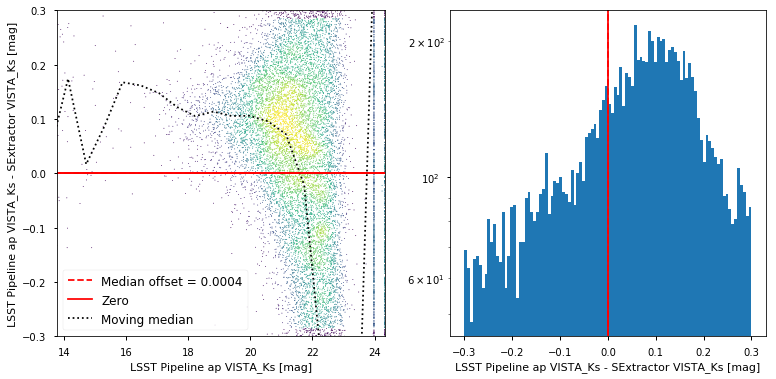

In [111]:

    
def mag_diff2(x,xerr,y,yerr, labels,savefig=False,bins = [20,20], sort = True,**kwargs):
    """Plot magnitude offsets for two catalogues"""
    #if 'ap' in labels[0]:
        #print("Comparing {} band AB 2 arc sec aperture magnitudes from {} and {}".format(labels[2],labels[0],labels[1]))
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    #ax3 = plt.subplot(gs2[:, -1], sharey=ax2)
    m = ~np.isnan(x) & ~np.isnan(y)
    x=x[m]
    y=y[m]
    xerr=xerr[m]
    yerr=yerr[m]


    mean_offset = np.nanmean(x - y)
    median_offset = np.nanmedian(x - y)
    print("Mean offset = {}".format(round(mean_offset,4)))
    print("Median offset = {}".format(round(median_offset,4)))
    
    total_var = xerr**2 + yerr**2 +0.03**2 #the extra 0.03 is an estimate of the abs. cal. error for vista
    unsaturated = (x>16) & (x<18) #& m

    weighted_bias = np.nansum(
        (
            x[unsaturated]
            -y[unsaturated]
        )/total_var[unsaturated]
    )/np.nansum(1./total_var[unsaturated])
    print('Weighted bias (16<mag<18) = {}'.format(round(weighted_bias,4)))
    
    
    #ax1.plot([0,100],[mean_offset,mean_offset], linestyle='dotted', c='r', alpha=1,
    #         label = 'Mean offset = {}'.format(round(mean_offset,4)))
    ax1.plot([0,100],[median_offset,median_offset], linestyle='dashed', c='r', alpha=1,
         label = 'Median offset = {}'.format(round(median_offset,4)))
    #ax1.plot([0,100],[weighted_bias,weighted_bias], linestyle='dashdot', c='r', alpha=1,
    #     label = 'Weighted bias = {}'.format(round(weighted_bias,4)))
    ax1.plot([0,100],[0,0], c='r', label='Zero')
    

    n, edges = np.histogram(x, bins=20)
    medians = [np.nanmedian((x-y)[(x>edges[a]) & (x<edges[a+1])]) for a in np.arange(len(n))]
    ax1.plot([np.mean([edges[a], edges[a+1]]) for a in np.arange(len(edges[:-1]))], medians, 
             c='k',linestyle='dotted',label='Moving median')
    
    
    ax1.legend( prop={'size': 12})#, loc='lower left')
    
    x_lims = [np.nanpercentile(x,.1),np.nanpercentile(x,97.5)]
    y_lims= [np.nanpercentile(x-y,2.5),np.nanpercentile(x-y,97.5)]
    y_lims=[-0.3,0.3]
    in_window = x>x_lims[0] -0.2
    in_window &= x<x_lims[1] +1.
    in_window &= x-y>y_lims[0] 
    in_window &= x-y<y_lims[1]
    x = x[in_window]
    y = y[in_window]
    
    data , x_e, y_e = np.histogram2d( x,  x - y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , 
                data , np.vstack([x, x - y]).T, method = "splinef2d" , bounds_error = False)#, method = "splinef2d"

    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    # Sort the points by density, so that the densest points are plotted last
    if sort :
        idx = z.argsort()
        x, y, z = x[idx], y[idx], z[idx]
        
    ax1.scatter(x,   x - y, c=z,
            alpha=1., s=0.3, rasterized=True)#,cmap='Greys')
    
    
    ax1.set_xlabel('{} [mag]'.format(labels[0]))
    ax1.plot([0,100],[0,0], c='r')
    
    #upper = np.min([25.,np.nanmax(x),np.nanmax(y)+1] )
    ax1.set_xlim(x_lims)
    ax1.set_ylim(y_lims)
    ax1.set_ylabel('{} - {} [mag]'.format(labels[0],labels[1]))
    
    ax2.hist(x - y,range=y_lims, bins=100)
    ax2.set_yscale('log')
    ax2.set_xlabel('{} - {} [mag]'.format(labels[0],labels[1]))
    ax2.axvline(0, c='r', alpha=1)
    #ax2.axvline(mean_offset,linestyle='dotted', c='r', alpha=1)
    ax2.axvline(median_offset,linestyle='dashed', c='r', alpha=1)
    #ax2.axvline(weighted_bias,linestyle='dashdot', c='r', alpha=1)
    
    
    #plt.rc('font', family='serif', serif='Times')
    plt.rc('text') #, usetex=True)
    plt.rc('xtick', labelsize=14)
    plt.rc('ytick', labelsize=14)
    plt.rc('axes', labelsize=14)
    


    if savefig:
        plt.savefig('./figs/mag_compare_{}_{}.pdf'.format(
            labels[0],labels[1]).replace(' ','_'), bbox_inches='tight')
        plt.savefig('./figs/mag_compare_{}_{}.png'.format(
            labels[0],labels[1]).replace(' ','_'), bbox_inches='tight')
    plt.show()
    
f,ferr= mag_to_flux(
    merge['VISTA_Ks_m_base_CircularApertureFlux_6_0_mag'],
    merge['VISTA_Ks_m_base_CircularApertureFlux_6_0_magErr'])
                    
mask = f/ferr > 5
#mask &= merge['HSC-I_m_base_ClassificationExtendedness_value']< 1.

f,ferr= mag_to_flux(
    merge['oxford_ks_m_ap_vista_ks'],
    merge['oxford_ks_merr_ap_vista_ks'])
                    
#mask &= f/ferr > 5
band= 'VISTA_Ks'
print("""Comparing {} band AB 2 arc sec aperture magnitudes from LSST and Oxford. 
LSST circular aperture magnitudes in 2 arcsec radius are not curve of growth corrected.""".format(band))
print('Oxford aperture correction: {}'.format(oxfordApCorr['{}_2as'.format(band)]))
mag_diff2(
    merge[mask]['{}_m_base_CircularApertureFlux_6_0_mag'.format(band)],
    merge[mask]['{}_m_base_CircularApertureFlux_6_0_magErr'.format(band)],
    merge[mask]['oxford_ks_m_ap_{}'.format(band.lower().replace('-','_'))] + oxfordApCorr['{}_2as'.format(band)],
    merge[mask]['oxford_ks_merr_ap_{}'.format(band.lower().replace('-','_'))],
    ['LSST Pipeline ap {}'.format(band),'SExtractor {}'.format(band), '{}'.format(band)],savefig=True)
    


Mean offset = 0.3675
Median offset = 0.1225
Weighted bias (16<mag<18) = 0.2795


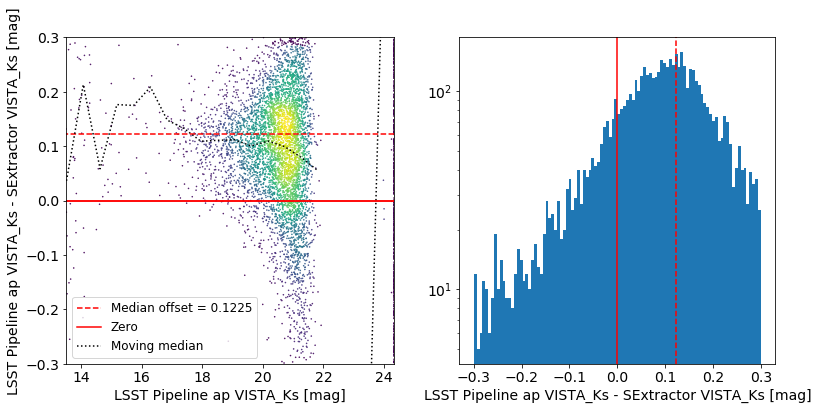

In [72]:
mag_diff2(
    merge[mask]['{}_m_base_CircularApertureFlux_6_0_mag'.format(band)],
    merge[mask]['{}_m_base_CircularApertureFlux_6_0_magErr'.format(band)],
    merge[mask]['help_m_ap_{}'.format(band.lower().replace('-','_'))] ,
    merge[mask]['help_merr_ap_{}'.format(band.lower().replace('-','_'))],
    ['LSST Pipeline ap {}'.format(band),'SExtractor {}'.format(band), '{}'.format(band)],savefig=True)

Mean offset = -0.0264
Median offset = 0.0894
Weighted bias (16<mag<18) = -1.0441


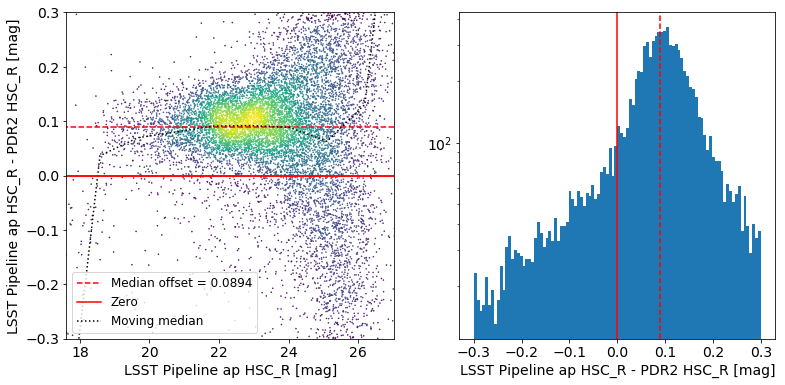

In [73]:
band='HSC_R'
mag_diff2(
    merge[mask]['{}_m_base_CircularApertureFlux_6_0_mag'.format(band)],
    merge[mask]['{}_m_base_CircularApertureFlux_6_0_magErr'.format(band)],
    merge[mask]['hsc_m_ap_{}'.format(band.lower().replace('-','_'))] ,
    merge[mask]['hsc_merr_ap_{}'.format(band.lower().replace('-','_'))],
    ['LSST Pipeline ap {}'.format(band),'PDR2 {}'.format(band), '{}'.format(band)],savefig=True)

Mean offset = -0.3105
Median offset = -0.2992
Weighted bias (16<mag<18) = -0.2111


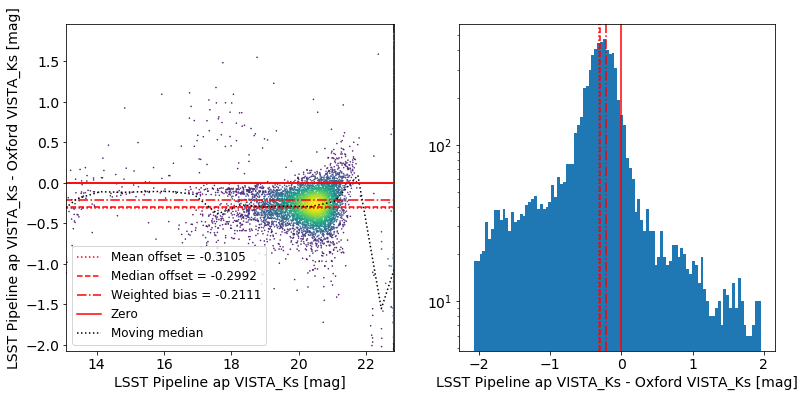

In [74]:
band= 'VISTA_Ks'
mag_diff(
    merge[mask]['{}_m_base_CircularApertureFlux_12_0_mag'.format(band)],
    merge[mask]['{}_m_base_CircularApertureFlux_12_0_magErr'.format(band)],
    merge[mask]['oxford_ks_m_ap_{}'.format(band.lower().replace('-','_'))] + oxfordApCorr['{}_2as'.format(band)],
    merge[mask]['oxford_ks_merr_ap_{}'.format(band.lower().replace('-','_'))],
    ['LSST Pipeline ap {}'.format(band),'Oxford {}'.format(band), '{}'.format(band)],savefig=True)
#plt.savefig('./figs/Ks_mag_diffs_6pix_2as.pdf', bbox_inches='tight')

Mean offset = 0.3675
Median offset = 0.1225
Weighted bias (16<mag<18) = 0.3091


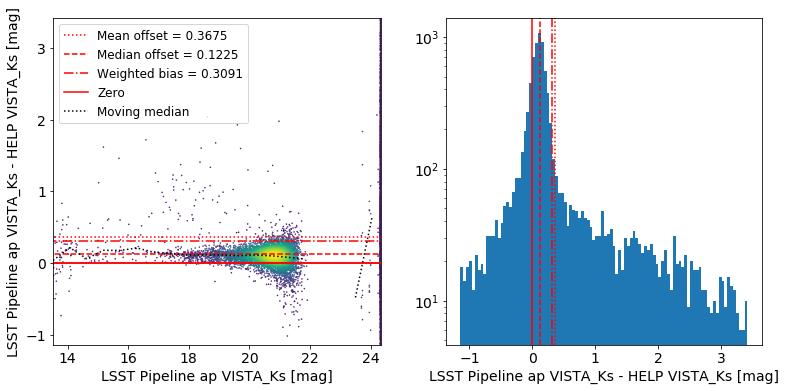

In [75]:
band= 'VISTA_Ks'
mag_diff(
    merge[mask]['{}_m_base_CircularApertureFlux_6_0_mag'.format(band)],
    merge[mask]['{}_m_base_CircularApertureFlux_6_0_magErr'.format(band)],
    merge[mask]['help_m_ap_{}'.format(band.lower().replace('-','_'))] ,
    merge[mask]['help_merr_ap_{}'.format(band.lower().replace('-','_'))],
    ['LSST Pipeline ap {}'.format(band),'HELP {}'.format(band), '{}'.format(band)],savefig=True)

Mean offset = -0.0264
Median offset = 0.0894
Weighted bias (16<mag<18) = -0.1226


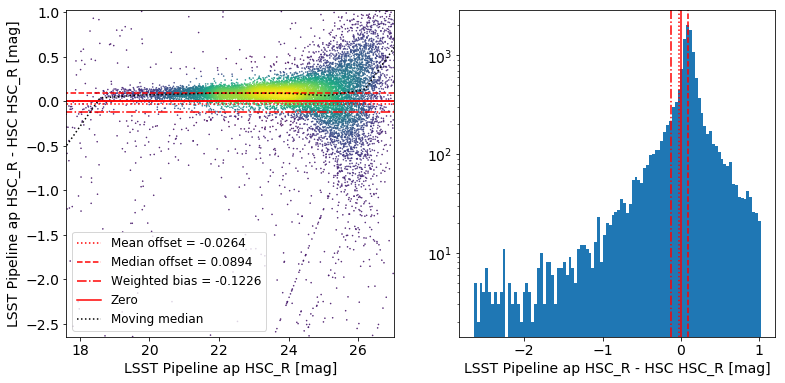

In [76]:
band='HSC_R'
mag_diff(
    merge[mask]['{}_m_base_CircularApertureFlux_6_0_mag'.format(band)],
    merge[mask]['{}_m_base_CircularApertureFlux_6_0_magErr'.format(band)],
    merge[mask]['hsc_m_ap_{}'.format(band.lower().replace('-','_'))] ,
    merge[mask]['hsc_merr_ap_{}'.format(band.lower().replace('-','_'))],
    ['LSST Pipeline ap {}'.format(band),'HSC {}'.format(band), '{}'.format(band)],savefig=True)

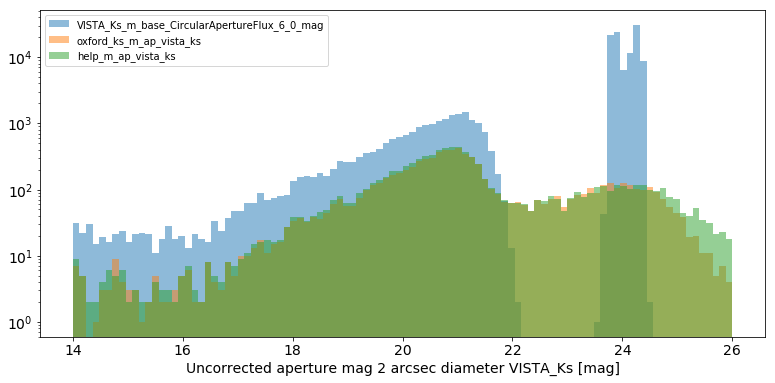

In [77]:
fig, ax = plt.subplots(figsize=(13, 6))
band='VISTA_Ks'
xName1='{}_m_base_CircularApertureFlux_6_0_mag'.format(band)
xName2='oxford_ks_m_ap_{}'.format(band.lower().replace('-','_'))
xName3='help_m_ap_{}'.format(band.lower().replace('-','_'))
ax.hist(merge[mask][xName1], 
        range=[14,26],bins=100,alpha=0.5,label=xName1)
ax.hist((merge[mask][xName2] 
         + oxfordApCorr['{}_2as'.format(band)]
        ), range=[14,26],bins=100,alpha=0.5,label=xName2)
ax.hist((merge[mask][xName3] 
         
        ), range=[14,26],bins=100,alpha=0.5,label=xName3)
ax.set_yscale('log')
ax.set_xlabel('Uncorrected aperture mag 2 arcsec diameter {} [mag]'.format(band))
ax.legend()

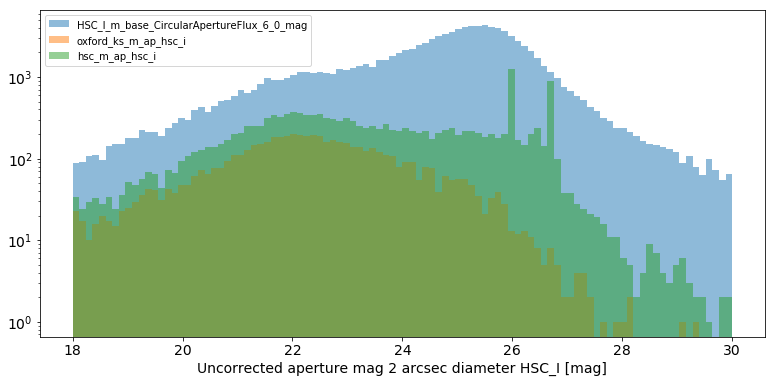

In [78]:
fig, ax = plt.subplots(figsize=(13, 6))
band='HSC_I'
xName1='{}_m_base_CircularApertureFlux_6_0_mag'.format(band)
xName2='oxford_ks_m_ap_{}'.format(band.lower().replace('-','_'))
xName3='hsc_m_ap_{}'.format(band.lower().replace('-','_'))
ax.hist(merge[mask][xName1], 
        range=[18,30],bins=100,alpha=0.5,label=xName1)
ax.hist((merge[mask][xName2] 
         + oxfordApCorr['{}_2as'.format(band)]
        ), range=[18,30],bins=100,alpha=0.5,label=xName2)
ax.hist((merge[mask][xName3] 
         
        ), range=[18,30],bins=100,alpha=0.5,label=xName3)
ax.set_yscale('log')
ax.set_xlabel('Uncorrected aperture mag 2 arcsec diameter {} [mag]'.format(band))
ax.legend()

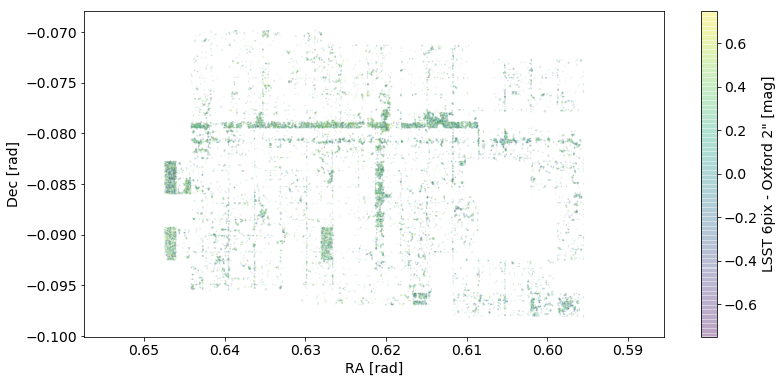

In [80]:
fig, ax = plt.subplots(figsize=(13, 6))
apDiff = merge['VISTA_Ks_m_base_CircularApertureFlux_6_0_mag'] - merge['oxford_ks_m_ap_vista_ks']
m = apDiff > -0.75
m &= apDiff < 0.75
im = ax.scatter(merge[m]['VISTA_Ks_m_coord_ra'],merge[m]['VISTA_Ks_m_coord_dec'],c=apDiff[m],
                s=0.1,alpha=0.2, rasterized=True)
fig.colorbar(im, ax=ax).set_label('LSST 6pix - Oxford 2" [mag]')
ax.set_xlabel('RA [rad]')
ax.set_xlim([np.max(merge[m]['VISTA_Ks_m_coord_ra'])+0.01, np.min(merge[m]['VISTA_Ks_m_coord_ra'])-0.01])
ax.set_ylabel('Dec [rad]')
fig.savefig('./figs/apDiff_6-Oxford_VISTA-Ks.pdf', bbox_inches='tight')
fig.savefig('./figs/apDiff_6-Oxford_VISTA-Ks.png', bbox_inches='tight')

HSC_G_m_base_CircularApertureFlux_6_0_mag
Comparing HSC_G band AB 2 arcsec radius aperture magnitudes from LSST and Oxford
Oxford ap corr: {}
Mean offset = -0.013
Median offset = -0.0295
Weighted bias (16<mag<18) = -1.5959


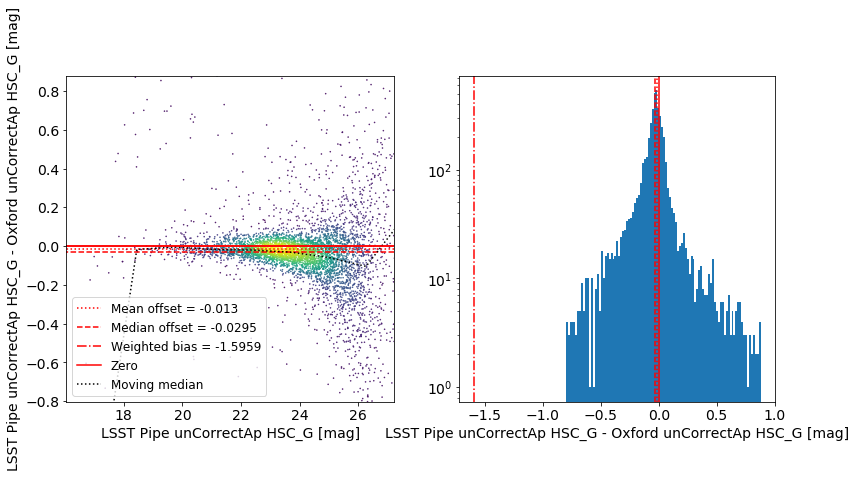

Comparing HSC_G band magnitudes from LSST PSF and Oxford 2 arcsec corrected  
Mean offset = 0.224
Median offset = 0.2103
Weighted bias (16<mag<18) = -1.3538


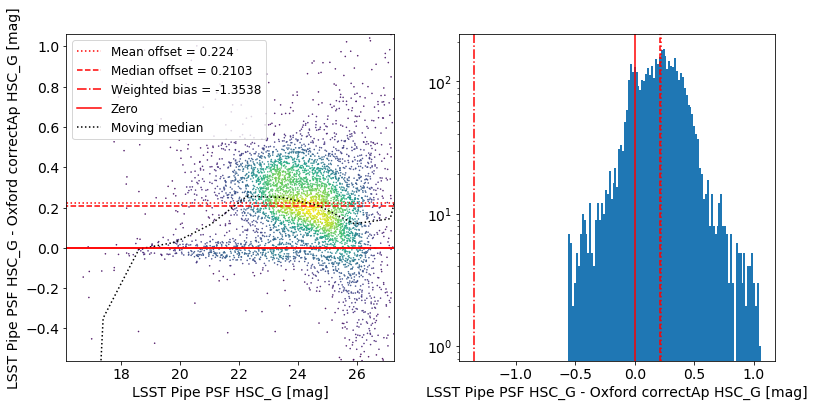

HSC_R_m_base_CircularApertureFlux_6_0_mag
Comparing HSC_R band AB 2 arcsec radius aperture magnitudes from LSST and Oxford
Oxford ap corr: {}
Mean offset = 0.1024
Median offset = 0.0771
Weighted bias (16<mag<18) = -1.0002


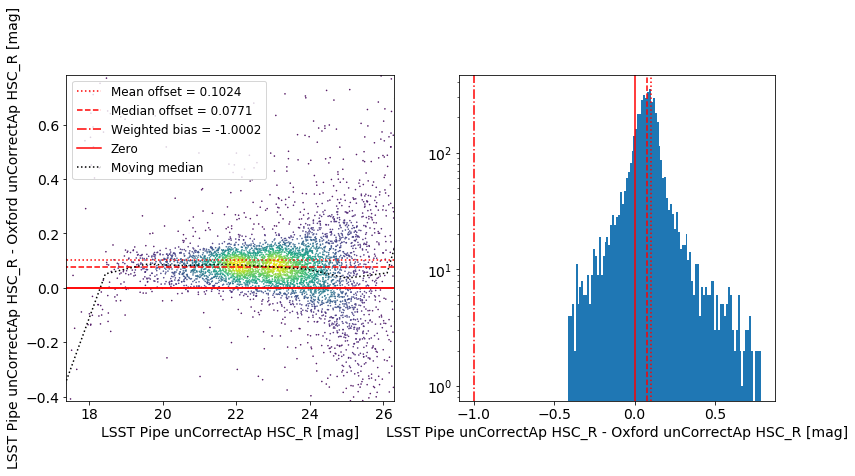

Comparing HSC_R band magnitudes from LSST PSF and Oxford 2 arcsec corrected  
Mean offset = 0.1867
Median offset = 0.173
Weighted bias (16<mag<18) = -0.2791


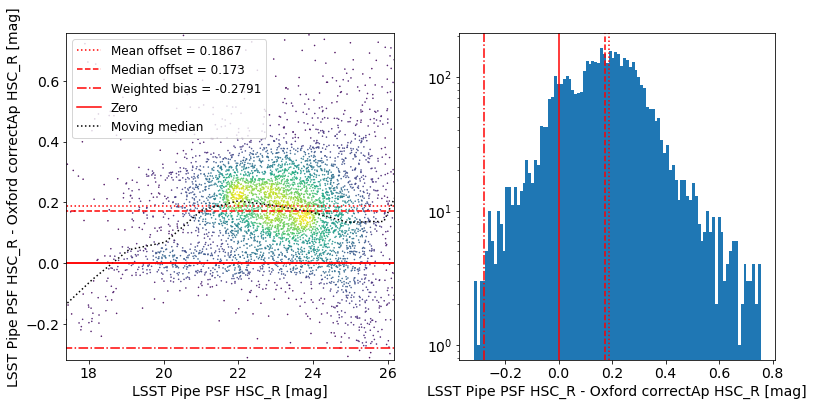

HSC_I_m_base_CircularApertureFlux_6_0_mag
Comparing HSC_I band AB 2 arcsec radius aperture magnitudes from LSST and Oxford
Oxford ap corr: {}
Mean offset = -0.0824
Median offset = -0.0965
Weighted bias (16<mag<18) = -0.0934


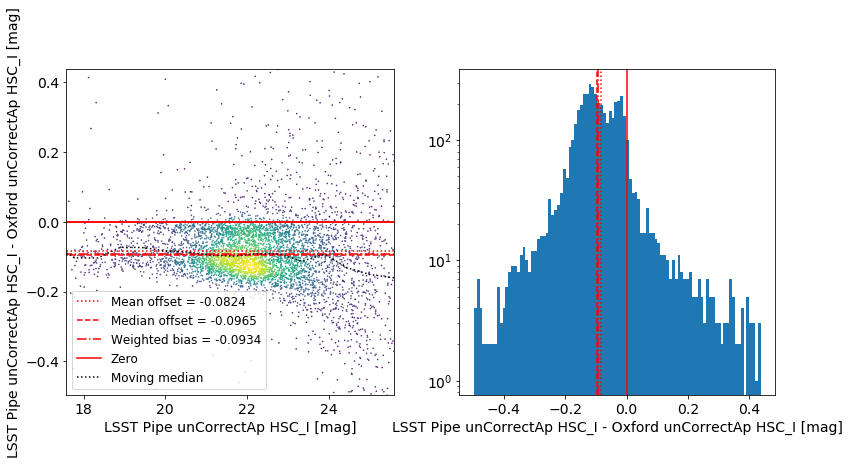

Comparing HSC_I band magnitudes from LSST PSF and Oxford 2 arcsec corrected  
Mean offset = 0.3547
Median offset = 0.3481
Weighted bias (16<mag<18) = 0.0015


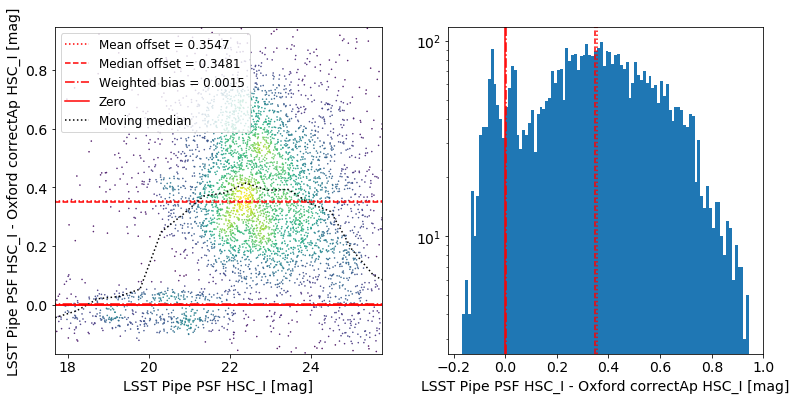

HSC_Z_m_base_CircularApertureFlux_6_0_mag
Comparing HSC_Z band AB 2 arcsec radius aperture magnitudes from LSST and Oxford
Oxford ap corr: {}
Mean offset = -0.048
Median offset = -0.0617
Weighted bias (16<mag<18) = -0.0464


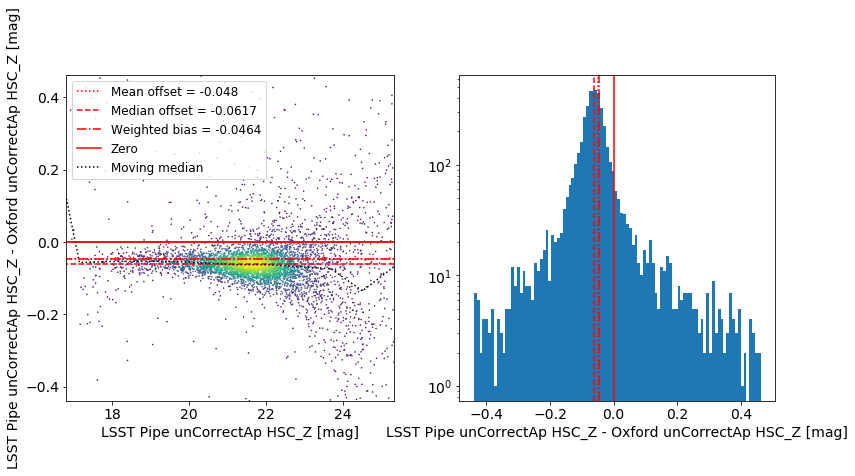

Comparing HSC_Z band magnitudes from LSST PSF and Oxford 2 arcsec corrected  
Mean offset = 0.3172
Median offset = 0.3079
Weighted bias (16<mag<18) = 0.2772


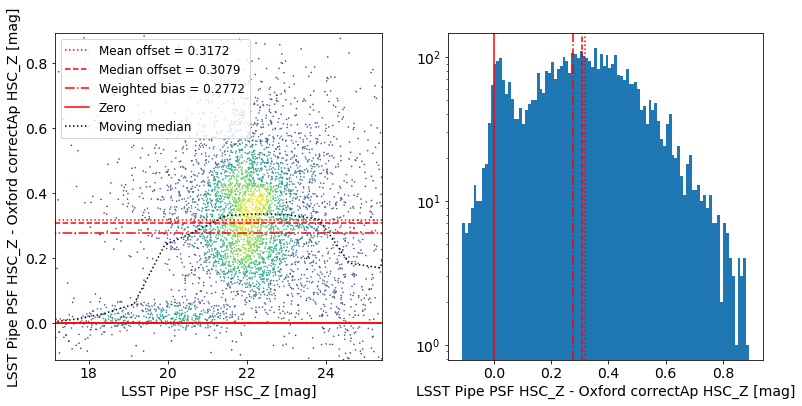

HSC_Y_m_base_CircularApertureFlux_6_0_mag
Comparing HSC_Y band AB 2 arcsec radius aperture magnitudes from LSST and Oxford
Oxford ap corr: {}
Mean offset = -0.0609
Median offset = -0.0825
Weighted bias (16<mag<18) = -0.07


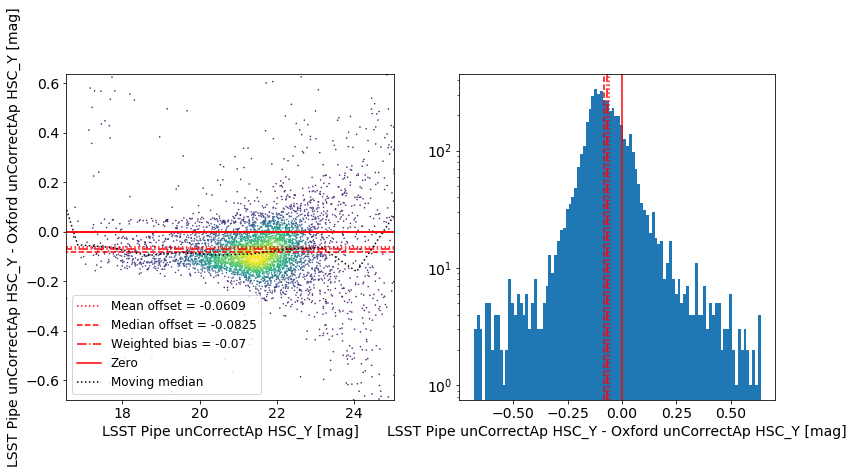

Comparing HSC_Y band magnitudes from LSST PSF and Oxford 2 arcsec corrected  
Mean offset = 0.3495
Median offset = 0.3416
Weighted bias (16<mag<18) = 0.1287


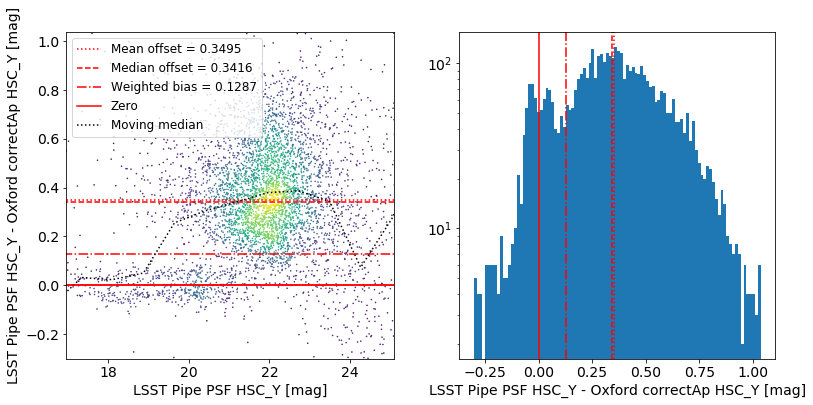

VISTA_Z_m_base_CircularApertureFlux_6_0_mag
Comparing VISTA_Z band AB 2 arcsec radius aperture magnitudes from LSST and Oxford
Oxford ap corr: {}
Mean offset = 0.8594
Median offset = 0.3621
Weighted bias (16<mag<18) = 0.6349


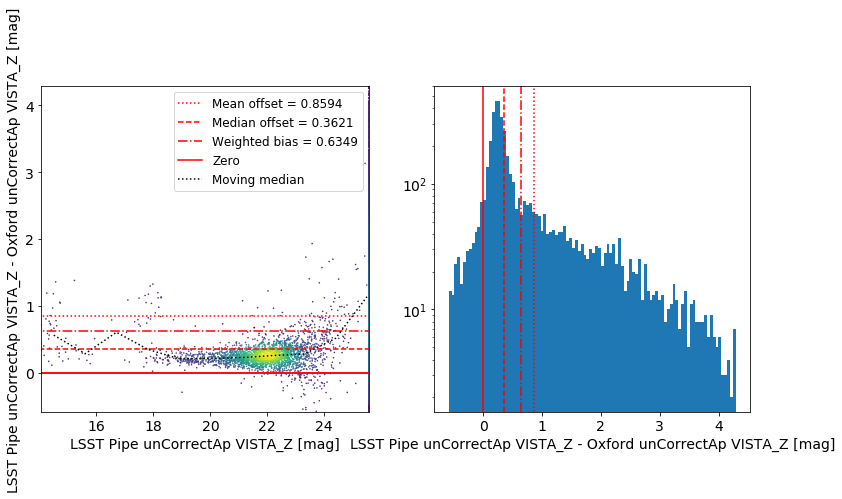

Comparing VISTA_Z band magnitudes from LSST PSF and Oxford 2 arcsec corrected  
Mean offset = 0.1231
Median offset = 0.0851
Weighted bias (16<mag<18) = 0.3356


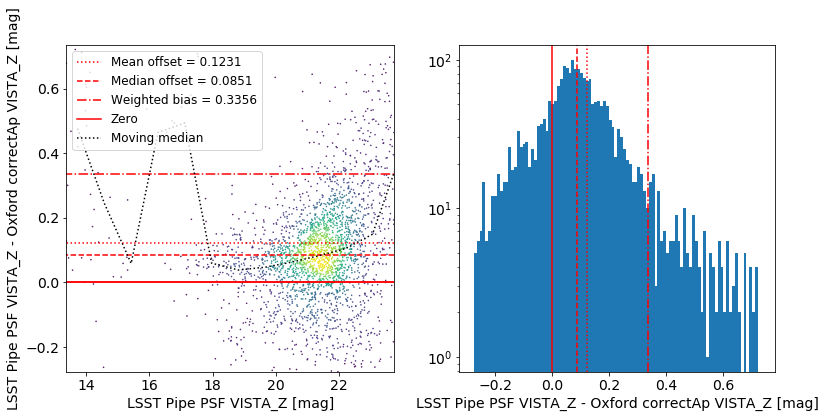

VISTA_Y_m_base_CircularApertureFlux_6_0_mag
Comparing VISTA_Y band AB 2 arcsec radius aperture magnitudes from LSST and Oxford
Oxford ap corr: {}
Mean offset = 0.1624
Median offset = 0.1047
Weighted bias (16<mag<18) = 0.3227


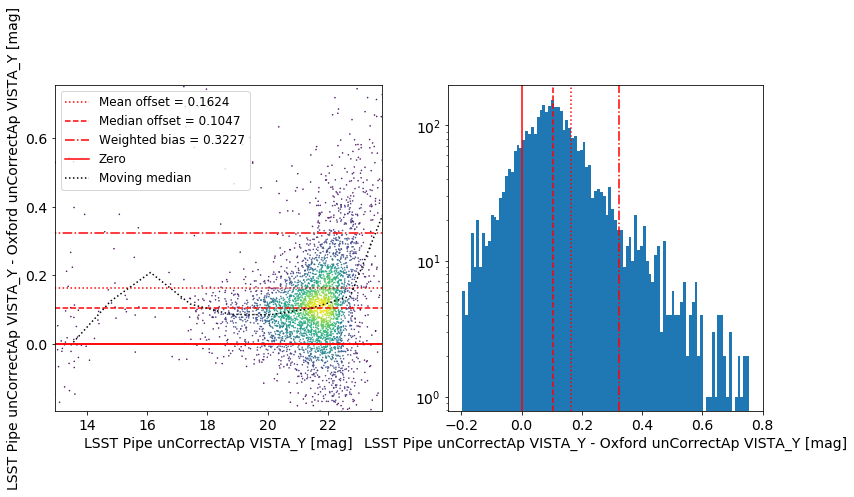

Comparing VISTA_Y band magnitudes from LSST PSF and Oxford 2 arcsec corrected  
Mean offset = 0.1101
Median offset = 0.0705
Weighted bias (16<mag<18) = 0.1741


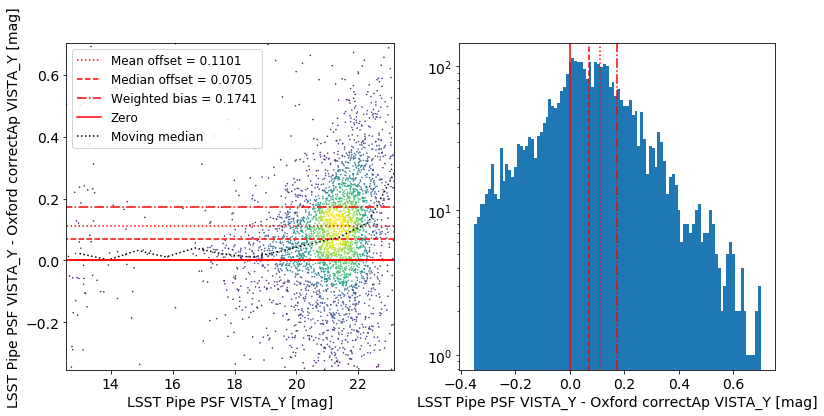

VISTA_J_m_base_CircularApertureFlux_6_0_mag
Comparing VISTA_J band AB 2 arcsec radius aperture magnitudes from LSST and Oxford
Oxford ap corr: {}
Mean offset = 0.5926
Median offset = 0.2292
Weighted bias (16<mag<18) = 0.4248


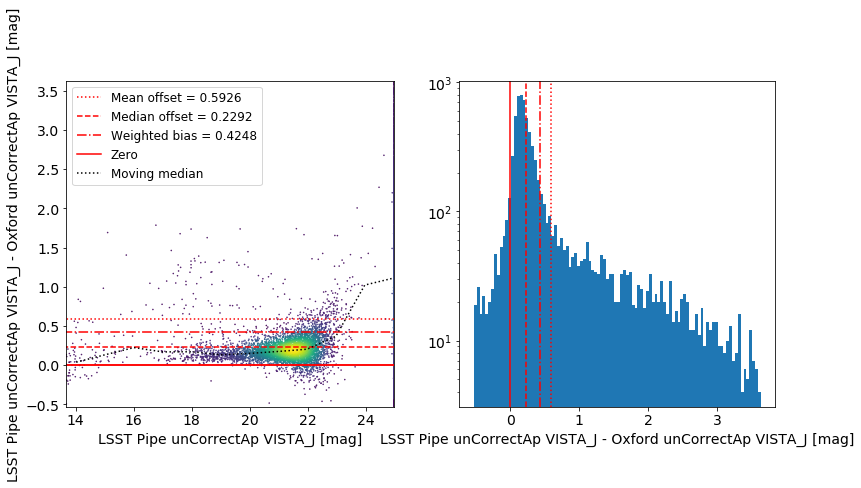

Comparing VISTA_J band magnitudes from LSST PSF and Oxford 2 arcsec corrected  
Mean offset = 0.1292
Median offset = 0.117
Weighted bias (16<mag<18) = 0.1632


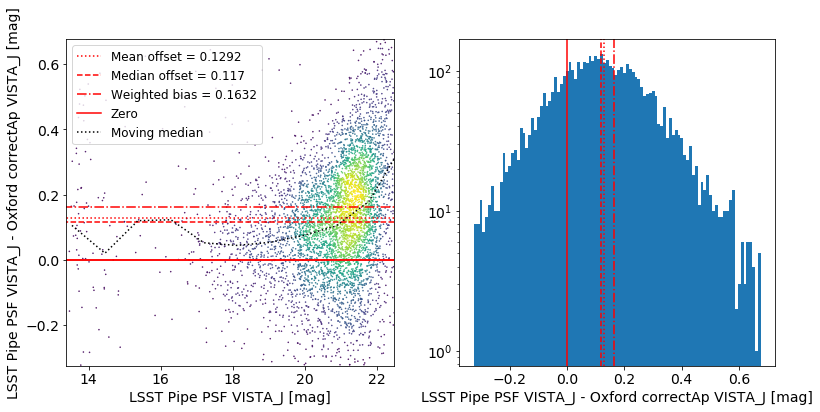

VISTA_H_m_base_CircularApertureFlux_6_0_mag
Comparing VISTA_H band AB 2 arcsec radius aperture magnitudes from LSST and Oxford
Oxford ap corr: {}
Mean offset = 0.4911
Median offset = 0.2128
Weighted bias (16<mag<18) = 0.4152


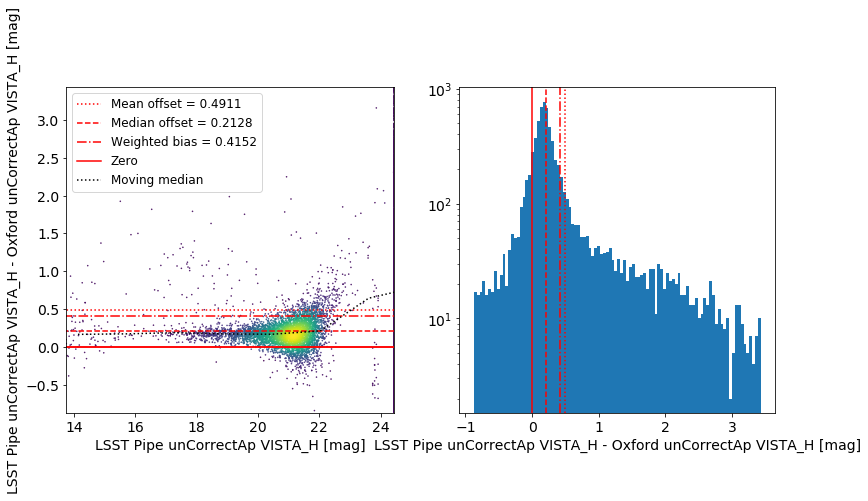

Comparing VISTA_H band magnitudes from LSST PSF and Oxford 2 arcsec corrected  
Mean offset = 0.1402
Median offset = 0.1131
Weighted bias (16<mag<18) = 0.1885


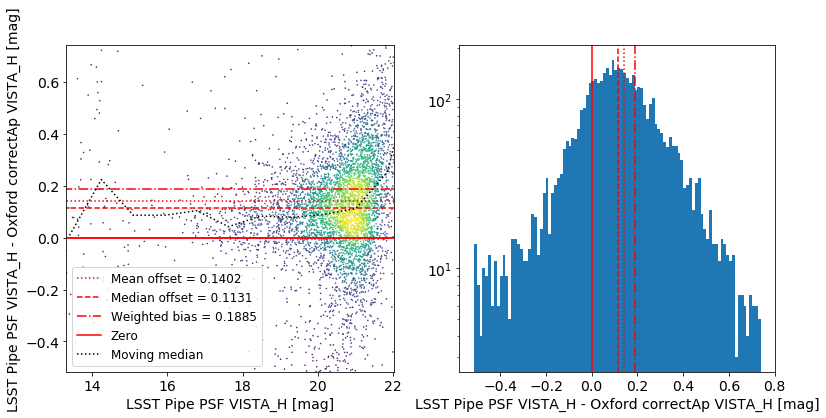

VISTA_Ks_m_base_CircularApertureFlux_6_0_mag
Comparing VISTA_Ks band AB 2 arcsec radius aperture magnitudes from LSST and Oxford
Oxford ap corr: {}
Mean offset = 0.443
Median offset = 0.128
Weighted bias (16<mag<18) = 0.276


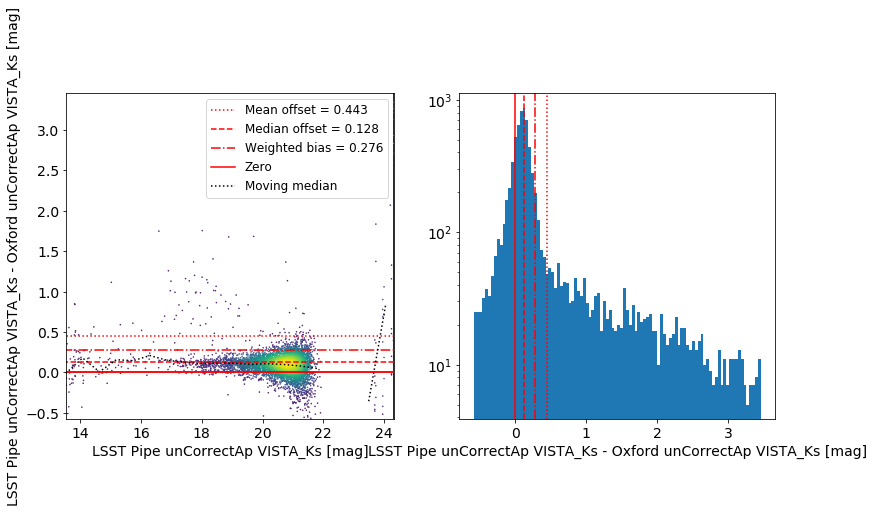

Comparing VISTA_Ks band magnitudes from LSST PSF and Oxford 2 arcsec corrected  
Mean offset = -0.0163
Median offset = -0.0186
Weighted bias (16<mag<18) = 0.0569


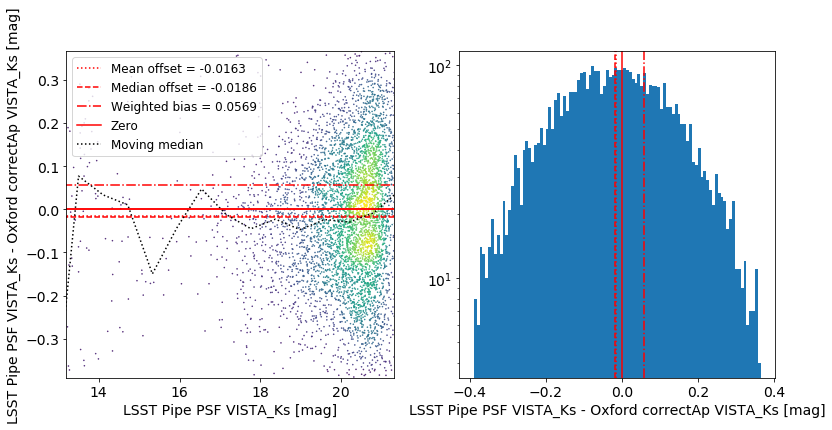

In [81]:
for col in merge.colnames:
    if col.endswith('6_0_mag'):
        print(col)
        band = '{}_{}'.format(col.split('_')[0],col.split('_')[1])
        print("Comparing {} band AB 2 arcsec radius aperture magnitudes from LSST and Oxford".format(band))
        print("Oxford ap corr: {}")
        try:
            mag_diff(
                merge[mask]['{}_m_base_CircularApertureFlux_6_0_mag'.format(band)],
                merge[mask]['{}_m_base_CircularApertureFlux_6_0_magErr'.format(band)],
                (merge[mask]['oxford_ks_m_ap_{}'.format(band.lower().replace('-','_'))] 
                 + oxfordApCorr['{}_2as'.format(band)]),
                merge[mask]['oxford_ks_merr_ap_{}'.format(band.lower().replace('-','_'))],
                ['LSST Pipe unCorrectAp {}'.format(band),'Oxford unCorrectAp {}'.format(band), '{}'.format(band)]
            ,savefig=False)
            print("Comparing {} band magnitudes from LSST PSF and Oxford 2 arcsec corrected  ".format(band))
            mag_diff(
                merge[mask]['{}_m_base_PsfFlux_mag'.format(band)],
                merge[mask]['{}_m_base_PsfFlux_magErr'.format(band)],
                merge[mask]['oxford_ks_m_ap_{}'.format(band.lower().replace('-','_'))],
                merge[mask]['oxford_ks_merr_ap_{}'.format(band.lower().replace('-','_'))],
                ['LSST Pipe PSF {}'.format(band),'Oxford correctAp {}'.format(band), '{}'.format(band)])
        except:
            print('Failed')

hsc_m_ap_hsc_g
Comparing HSC_G band AB 2 arcsec radius aperture magnitudes from LSST and HSC
Mean offset = -0.0586
Median offset = 0.0091
Weighted bias (16<mag<18) = -0.3178


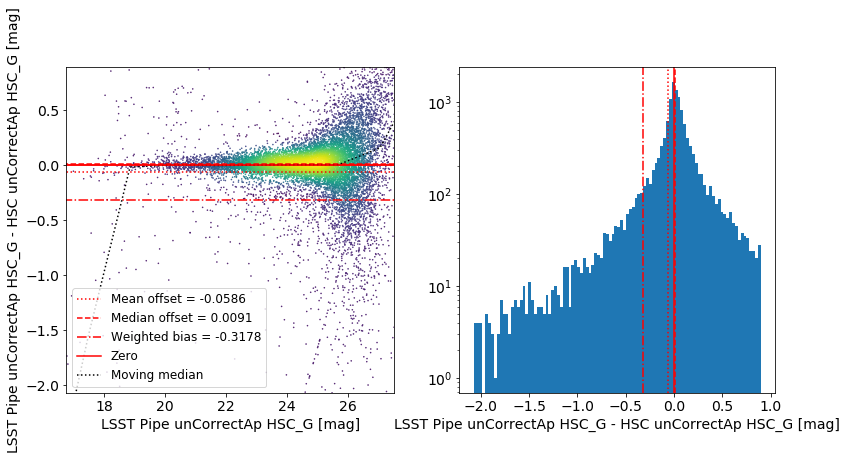

Comparing HSC_G band magnitudes from LSST PSF and Oxford 2 arcsec corrected  
Mean offset = -0.0405
Median offset = 0.0403
Weighted bias (16<mag<18) = -0.3227


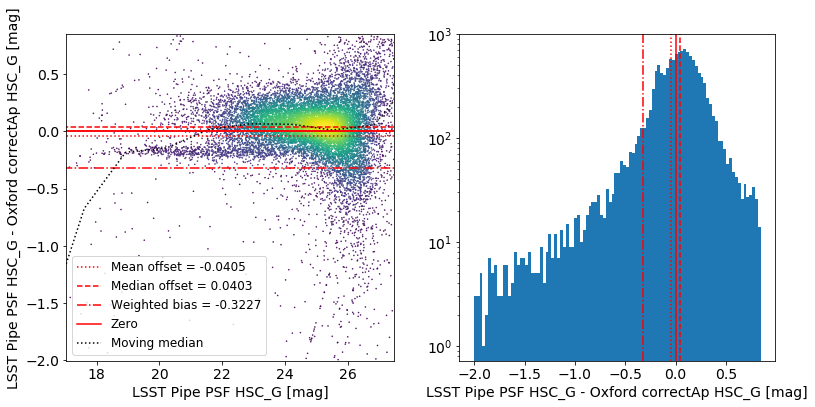

hsc_m_ap_hsc_r
Comparing HSC_R band AB 2 arcsec radius aperture magnitudes from LSST and HSC
Mean offset = -0.0264
Median offset = 0.0894
Weighted bias (16<mag<18) = -0.1226


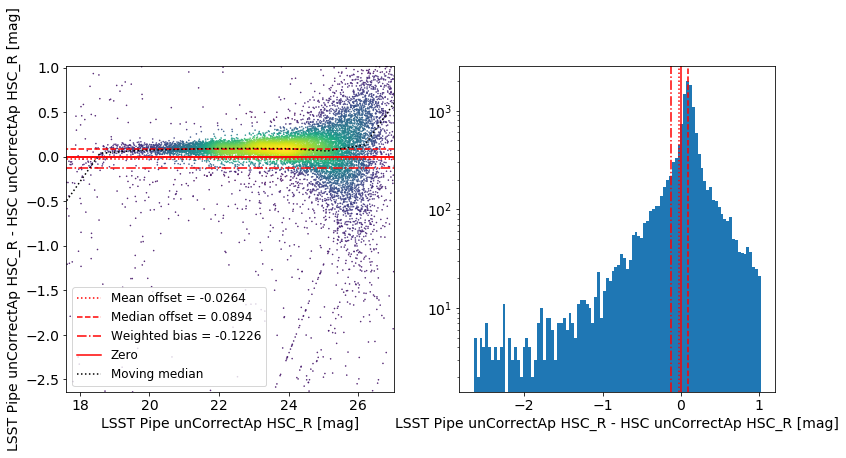

Comparing HSC_R band magnitudes from LSST PSF and Oxford 2 arcsec corrected  
Mean offset = -0.0789
Median offset = 0.0404
Weighted bias (16<mag<18) = -0.1709


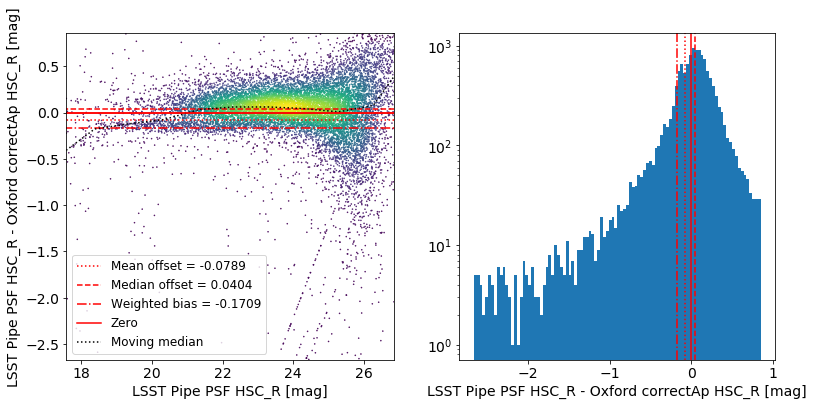

hsc_m_ap_hsc_i
Comparing HSC_I band AB 2 arcsec radius aperture magnitudes from LSST and HSC
Mean offset = -0.4842
Median offset = -0.0998
Weighted bias (16<mag<18) = -0.1012


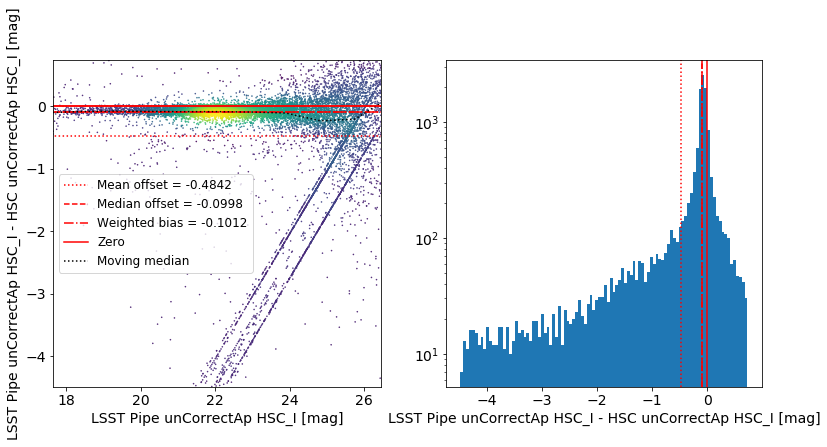

Comparing HSC_I band magnitudes from LSST PSF and Oxford 2 arcsec corrected  
Mean offset = -0.2446
Median offset = 0.1179
Weighted bias (16<mag<18) = -0.0589


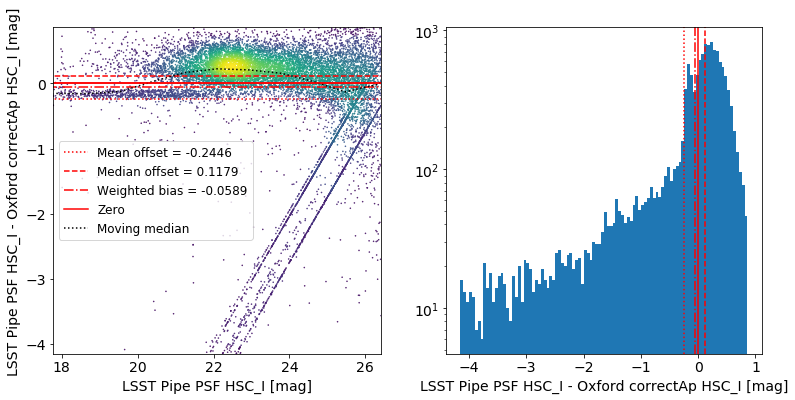

hsc_m_ap_hsc_z
Comparing HSC_Z band AB 2 arcsec radius aperture magnitudes from LSST and HSC
Mean offset = -0.116
Median offset = -0.0496
Weighted bias (16<mag<18) = -0.0492


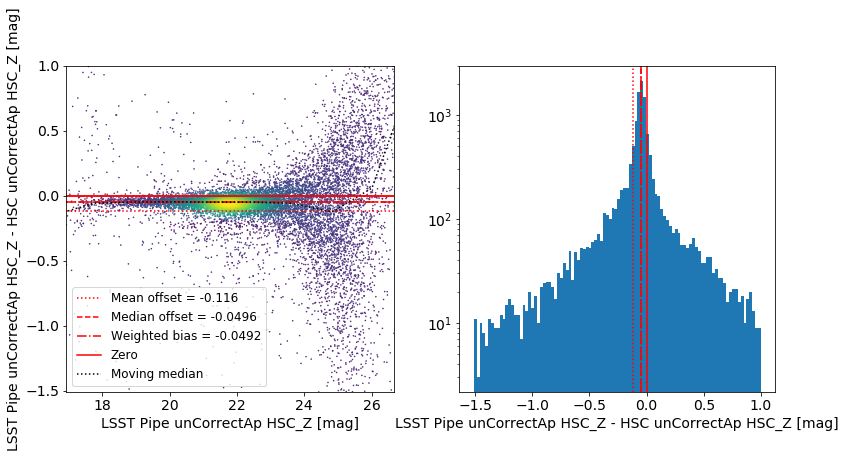

Comparing HSC_Z band magnitudes from LSST PSF and Oxford 2 arcsec corrected  
Mean offset = 0.0011
Median offset = 0.0806
Weighted bias (16<mag<18) = -0.0532


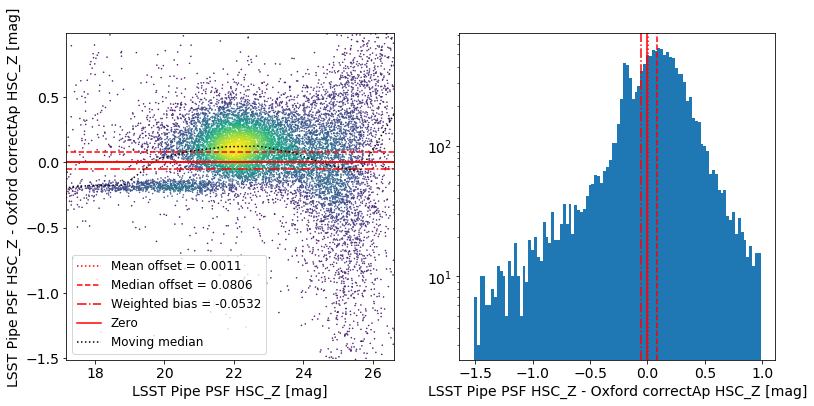

hsc_m_ap_hsc_y
Comparing HSC_Y band AB 2 arcsec radius aperture magnitudes from LSST and HSC
Mean offset = -0.1665
Median offset = -0.0506
Weighted bias (16<mag<18) = -0.0334


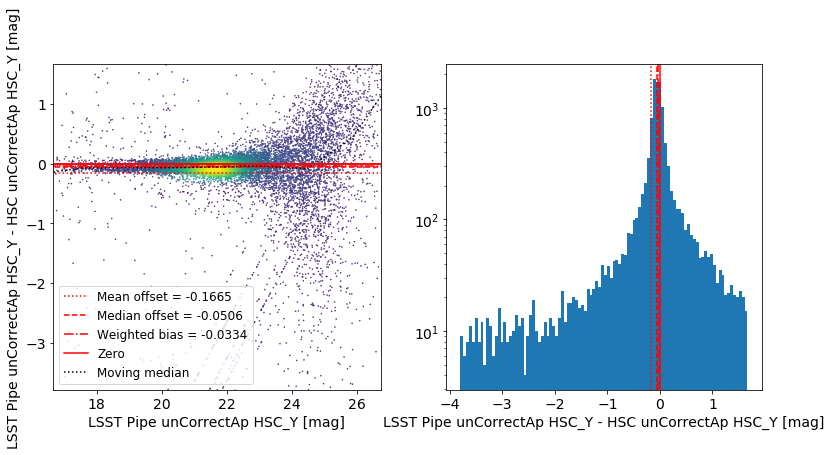

Comparing HSC_Y band magnitudes from LSST PSF and Oxford 2 arcsec corrected  
Mean offset = -0.0421
Median offset = 0.0994
Weighted bias (16<mag<18) = -0.0521


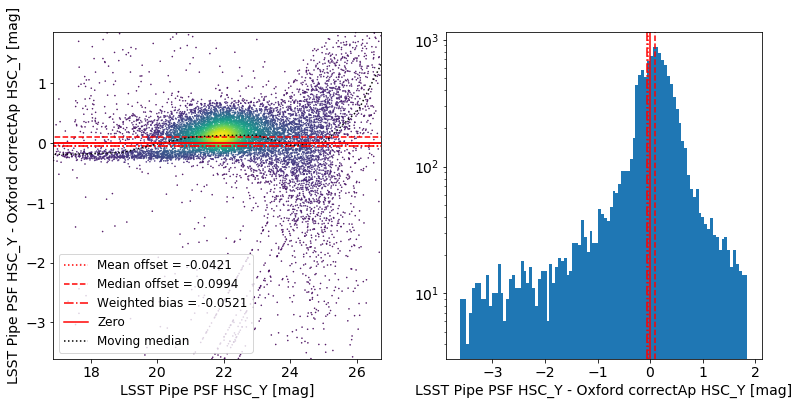

In [82]:
for col in merge.colnames:
    if col.startswith('hsc_m_'):
        print(col)
        band = 'HSC_'+col.split('_')[-1].upper()
        print("Comparing {} band AB 2 arcsec radius aperture magnitudes from LSST and HSC".format(band))
     
        try:
            mag_diff(
                merge[mask]['{}_m_base_CircularApertureFlux_6_0_mag'.format(band)],
                merge[mask]['{}_m_base_CircularApertureFlux_6_0_magErr'.format(band)],
                (merge[mask]['hsc_m_ap_{}'.format(band.lower().replace('-','_'))] 
                 ),
                merge[mask]['hsc_merr_ap_{}'.format(band.lower().replace('-','_'))],
                ['LSST Pipe unCorrectAp {}'.format(band),'HSC unCorrectAp {}'.format(band), '{}'.format(band)]
            ,savefig=False)
            print("Comparing {} band magnitudes from LSST PSF and Oxford 2 arcsec corrected  ".format(band))
            mag_diff(
                merge[mask]['{}_m_base_PsfFlux_mag'.format(band)],
                merge[mask]['{}_m_base_PsfFlux_magErr'.format(band)],
                merge[mask]['hsc_m_ap_{}'.format(band.lower().replace('-','_'))],
                merge[mask]['hsc_merr_ap_{}'.format(band.lower().replace('-','_'))],
                ['LSST Pipe PSF {}'.format(band),'Oxford correctAp {}'.format(band), '{}'.format(band)])
        except:
            print('Failed')

LSST aperture uncorrected


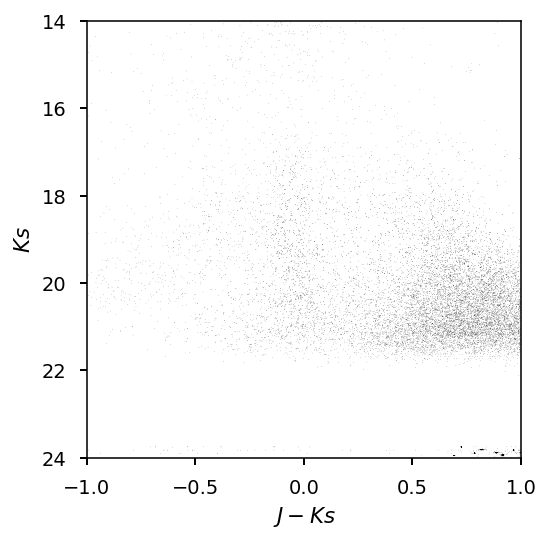

In [84]:
print('LSST aperture uncorrected')
plt.style.use('seaborn-notebook')
plt.figure(1, figsize=(4, 4), dpi=140)
plt.scatter((merge[mask]['VISTA_J_m_base_CircularApertureFlux_6_0_mag'] 
             - merge[mask]['VISTA_Ks_m_base_CircularApertureFlux_6_0_mag']),
            merge[mask]['VISTA_Ks_m_base_CircularApertureFlux_6_0_mag'],
            edgecolors='None', s=0.05,c='k', rasterized=True)
plt.xlim(-1, 1)
plt.ylim(24, 14)
plt.xlabel('$J-Ks$')
plt.ylabel('$Ks$')
plt.subplots_adjust(left=0.125, bottom=0.1)
plt.show()

Oxford aperture corrected


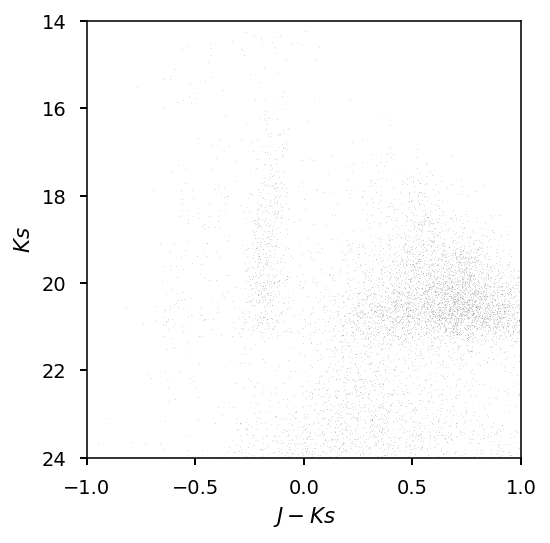

In [85]:
print('Oxford aperture corrected')
plt.style.use('seaborn-notebook')
plt.figure(1, figsize=(4, 4), dpi=140)
plt.scatter((merge[mask]['oxford_ks_m_ap_vista_j'] 
             - merge[mask]['oxford_ks_m_ap_vista_ks']),
            merge[mask]['oxford_ks_m_ap_vista_ks'],
            edgecolors='None', s=0.05,c='k', rasterized=True)
plt.xlim(-1, 1)
plt.ylim(24, 14)
plt.xlabel('$J-Ks$')
plt.ylabel('$Ks$')
plt.subplots_adjust(left=0.125, bottom=0.1)
plt.show()

LSST PSF


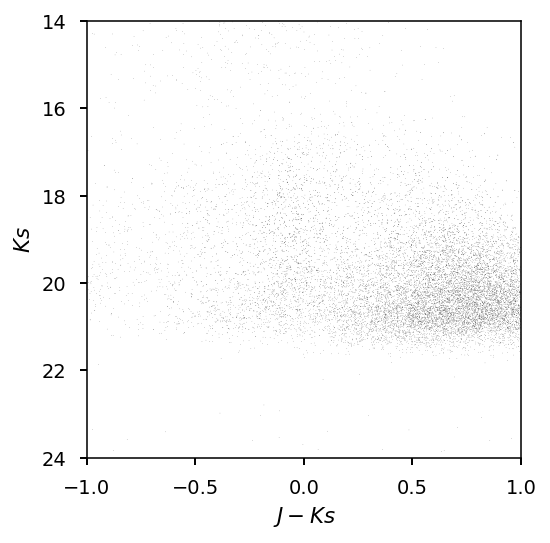

In [87]:
print('LSST PSF')
plt.style.use('seaborn-notebook')
plt.figure(1, figsize=(4, 4), dpi=140)
plt.scatter((merge[mask]['VISTA_J_m_base_PsfFlux_mag'] 
             - merge[mask]['VISTA_Ks_m_base_PsfFlux_mag']),
            merge[mask]['VISTA_Ks_m_base_PsfFlux_mag'],
            edgecolors='None', s=0.05,c='k', rasterized=True)
plt.xlim(-1, 1)
plt.ylim(24, 14)
plt.xlabel('$J-Ks$')
plt.ylabel('$Ks$')
plt.subplots_adjust(left=0.125, bottom=0.1)
plt.show()

## Comparing errors

Now we will plot similar offsets for the measured errors. 

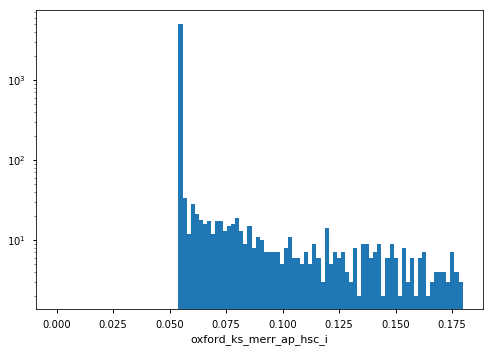

In [88]:
plt.hist(merge[mask]['oxford_ks_merr_ap_hsc_i'],
         range=[0,
                np.nanpercentile(merge[mask]['oxford_ks_merr_ap_hsc_i'],95)], 
         bins=100)
plt.xlabel('oxford_ks_merr_ap_hsc_i')
plt.yscale('log')

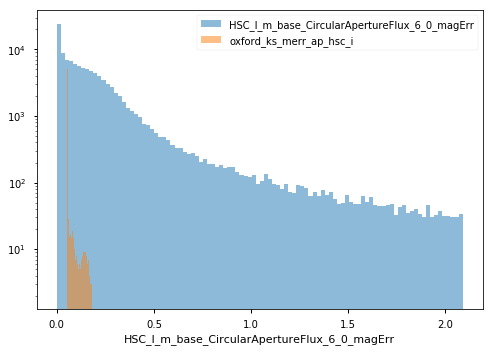

In [91]:
plt.hist(merge[mask]['HSC_I_m_base_CircularApertureFlux_6_0_magErr'],
         range=[0,
                np.nanpercentile(merge[mask]['HSC_I_m_base_CircularApertureFlux_6_0_magErr'],95)], 
         bins=100,alpha=0.5,label='HSC_I_m_base_CircularApertureFlux_6_0_magErr')
plt.hist(merge[mask]['oxford_ks_merr_ap_hsc_i'],
         range=[0,
                np.nanpercentile(merge[mask]['oxford_ks_merr_ap_hsc_i'],95)], 
         bins=100, alpha=0.5,label='oxford_ks_merr_ap_hsc_i')
plt.legend()
plt.xlabel('HSC_I_m_base_CircularApertureFlux_6_0_magErr')
plt.yscale('log')

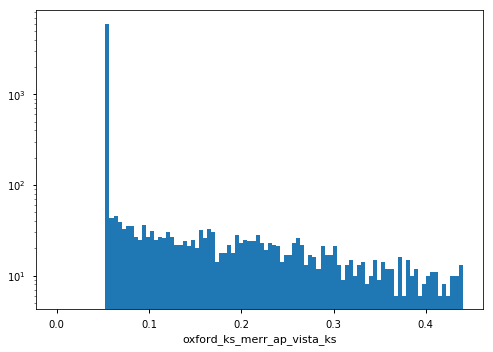

In [92]:
plt.hist(merge[mask]['oxford_ks_merr_ap_vista_ks'],
         range=[0,
                np.nanpercentile(merge[mask]['oxford_ks_merr_ap_vista_ks'],95)], 
         bins=100)
plt.xlabel('oxford_ks_merr_ap_vista_ks')
plt.yscale('log')

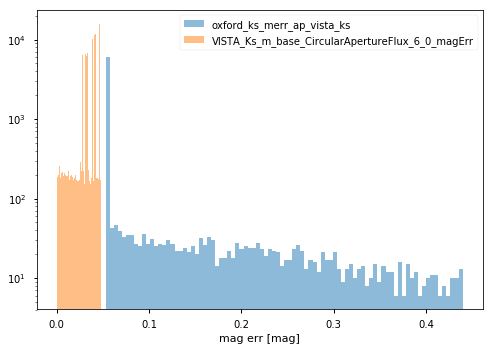

In [103]:
plt.hist(merge[mask]['oxford_ks_merr_ap_vista_ks'],
         range=[0,
                np.nanpercentile(merge[mask]['oxford_ks_merr_ap_vista_ks'],95)], 
         bins=100,alpha=0.5,label='oxford_ks_merr_ap_vista_ks')
plt.hist(merge[mask]['VISTA_Ks_m_base_CircularApertureFlux_6_0_magErr'],
         range=[0,
                np.nanpercentile(merge[mask]['VISTA_Ks_m_base_CircularApertureFlux_6_0_magErr'],95)], 
         bins=100,alpha=0.5,label='VISTA_Ks_m_base_CircularApertureFlux_6_0_magErr')
plt.legend()
plt.xlabel('mag err [mag]')
plt.yscale('log')

In [94]:
0.339/0.168

2.017857142857143

Text(0, 0.5, 'oxford_ks_merr_ap_vista_z')

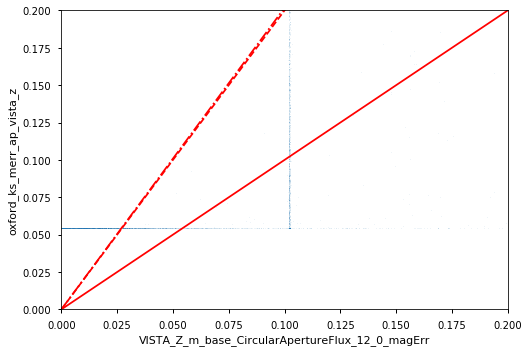

In [97]:
xName = 'VISTA_Z_m_base_CircularApertureFlux_12_0_magErr'
yName = 'oxford_ks_merr_ap_vista_z'
plt.scatter(
    merge[mask][xName],
    merge[mask][yName],
    s=0.1,
    alpha=0.2,rasterized=True)
plt.plot([0,1],[0,1], c='r')
plt.plot([0,1],[0,2], c='r', linestyle='--')
plt.plot([0,1],[0,0.339/0.168], c='r', linestyle='-.')
plt.xlim([0,0.2])
plt.ylim([0,0.2])
plt.xlabel(xName)
plt.ylabel(yName)

Text(0, 0.5, 'oxford_ks_merr_ap_vista_y')

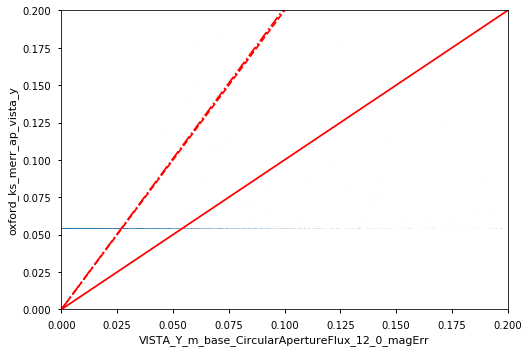

In [99]:
xName = 'VISTA_Y_m_base_CircularApertureFlux_12_0_magErr'
yName = 'oxford_ks_merr_ap_vista_y'
plt.scatter(
    merge[mask][xName],
    merge[mask][yName],
    s=0.1,
    alpha=0.2,rasterized=True)
plt.plot([0,1],[0,1], c='r')
plt.plot([0,1],[0,2], c='r', linestyle='--')
plt.plot([0,1],[0,0.339/0.168], c='r', linestyle='-.')
plt.xlim([0,0.2])
plt.ylim([0,0.2])
plt.xlabel(xName)
plt.ylabel(yName)

Text(0, 0.5, 'oxford_ks_merr_ap_vista_j')

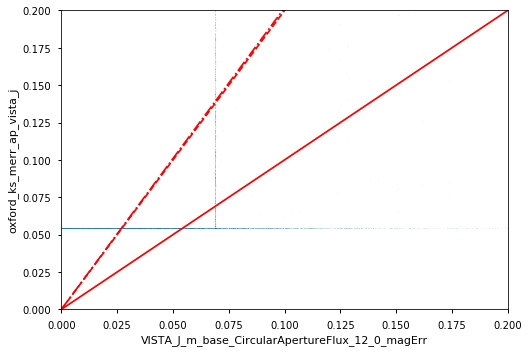

In [102]:
xName = 'VISTA_J_m_base_CircularApertureFlux_12_0_magErr'
yName = 'oxford_ks_merr_ap_vista_j'
plt.scatter(
    merge[mask][xName],
    merge[mask][yName],
    s=0.1,
    alpha=0.2,rasterized=True)
plt.plot([0,1],[0,1], c='r')
plt.plot([0,1],[0,2], c='r', linestyle='--')
plt.plot([0,1],[0,0.339/0.168], c='r', linestyle='-.')
plt.xlim([0,0.2])
plt.ylim([0,0.2])
plt.xlabel(xName)
plt.ylabel(yName)

Text(0, 0.5, 'oxford_ks_merr_ap_vista_h')

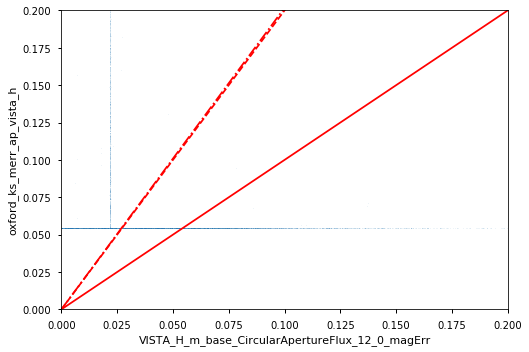

In [104]:
xName = 'VISTA_H_m_base_CircularApertureFlux_12_0_magErr'
yName = 'oxford_ks_merr_ap_vista_h'
plt.scatter(
    merge[mask][xName],
    merge[mask][yName],
    s=0.1,
    alpha=0.2,rasterized=True)
plt.plot([0,1],[0,1], c='r')
plt.plot([0,1],[0,2], c='r', linestyle='--')
plt.plot([0,1],[0,0.339/0.168], c='r', linestyle='-.')
plt.xlim([0,0.2])
plt.ylim([0,0.2])
plt.xlabel(xName)
plt.ylabel(yName)

Text(0, 0.5, 'oxford_ks_merr_ap_vista_ks')

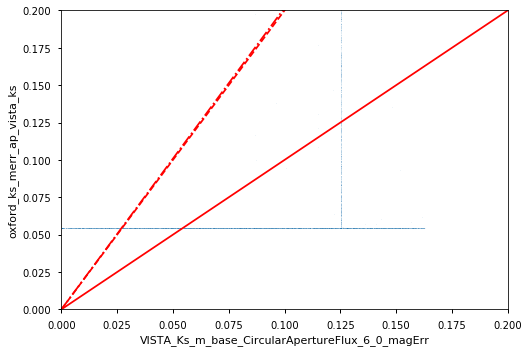

In [105]:
xName = 'VISTA_Ks_m_base_CircularApertureFlux_6_0_magErr'
yName = 'oxford_ks_merr_ap_vista_ks'
plt.scatter(
    3*merge[mask][xName],
    merge[mask][yName],
    s=0.1,
    alpha=0.2,rasterized=True)
plt.plot([0,1],[0,1], c='r')
plt.plot([0,1],[0,2], c='r', linestyle='--')
plt.plot([0,1],[0,0.339/0.168], c='r', linestyle='-.')
plt.xlim([0,0.2])
plt.ylim([0,0.2])
plt.xlabel(xName)
plt.ylabel(yName)

Text(0, 0.5, 'oxford_ks_merr_ap_hsc_i')

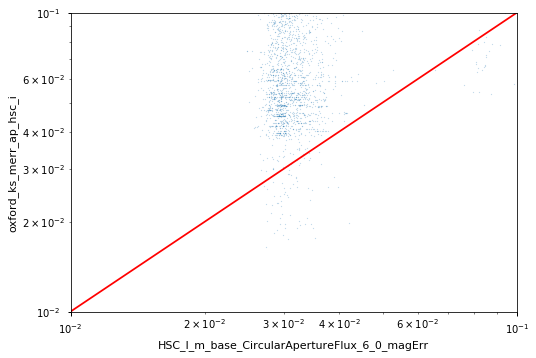

In [107]:
band='HSC_I'
xName = '{}_m_base_CircularApertureFlux_6_0_mag'.format(band)
yName = 'oxford_ks_m_ap_{}'.format(band.lower().replace('-','_'))
f, ferr = mag_to_flux(merge[mask][xName],merge[mask][xName.replace('mag','magErr')])
f_o, ferr_o = mag_to_flux((merge[mask][yName]
                           + oxfordApCorr['{}_2as'.format(band)]
                          ), # + oxfordApCorr['{}_2as'.format(band)],
                          merge[mask][yName.replace('_m_','_merr_')])
plt.scatter(
    ferr*1e6,
    ferr_o*1e6,
    s=1.,
    alpha=0.2,rasterized=True)
lims=[1.e-2,1.e-1]
plt.plot(lims,lims, c='r')
#plt.plot([0,1],[0,2], c='r', linestyle='--')
#plt.plot([0,1],[0,0.339/0.168], c='r', linestyle='-.')
plt.xlim(lims)
plt.ylim(lims)
plt.xscale('log')
plt.yscale('log')
plt.xlabel(xName.replace('mag','magErr'))
plt.ylabel(yName.replace('_m_','_merr_'))

Text(0, 0.5, 'oxford_ks_merr_ap_vista_ks')

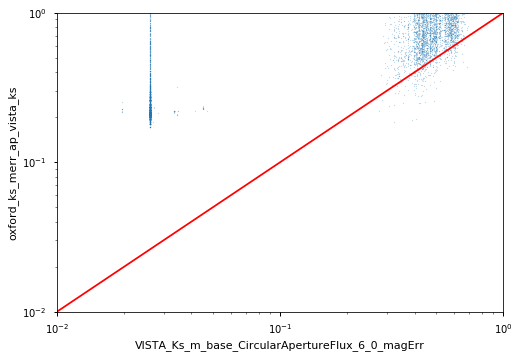

In [108]:
band='VISTA_Ks'
xName = '{}_m_base_CircularApertureFlux_6_0_mag'.format(band)
yName = 'oxford_ks_m_ap_{}'.format(band.lower().replace('-','_'))
f, ferr = mag_to_flux(merge[mask][xName],merge[mask][xName.replace('mag','magErr')])
f_o, ferr_o = mag_to_flux((merge[mask][yName]
                           + oxfordApCorr['{}_2as'.format(band)]
                          ), # + oxfordApCorr['{}_2as'.format(band)],
                          merge[mask][yName.replace('_m_','_merr_')])
plt.scatter(
    ferr*1e6,
    ferr_o*1e6,
    s=1.,
    alpha=0.2,rasterized=True)
lims=[1.e-2,1.e0]
plt.plot(lims,lims, c='r')
#plt.plot([0,1],[0,2], c='r', linestyle='--')
#plt.plot([0,1],[0,0.339/0.168], c='r', linestyle='-.')
plt.xlim(lims)
plt.ylim(lims)
plt.xscale('log')
plt.yscale('log')
plt.xlabel(xName.replace('mag','magErr'))
plt.ylabel(yName.replace('_m_','_merr_'))

Text(0, 0.5, 'oxford_ks_merr_ap_vista_ks')

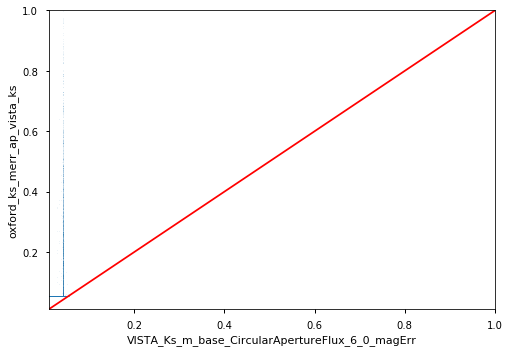

In [109]:
band='VISTA_Ks'
xName = '{}_m_base_CircularApertureFlux_6_0_mag'.format(band)
yName = 'oxford_ks_m_ap_{}'.format(band.lower().replace('-','_'))
f, ferr = mag_to_flux(merge[mask][xName],merge[mask][xName.replace('mag','magErr')])
f_o, ferr_o = mag_to_flux((merge[mask][yName]
                           + oxfordApCorr['{}_2as'.format(band)]
                          ), # + oxfordApCorr['{}_2as'.format(band)],
                          merge[mask][yName.replace('_m_','_merr_')])
plt.scatter(
    flux_to_mag(f*1e6,ferr*1e6)[1],
    flux_to_mag(f_o*1e6,ferr_o*1e6)[1],
    s=0.1,
    alpha=0.2,rasterized=True)
lims=[1.e-2,1.e0]
plt.plot(lims,lims, c='r')
#plt.plot([0,1],[0,2], c='r', linestyle='--')
#plt.plot([0,1],[0,0.339/0.168], c='r', linestyle='-.')
plt.xlim(lims)
plt.ylim(lims)
#plt.xscale('log')
#plt.yscale('log')
plt.xlabel(xName.replace('mag','magErr'))
plt.ylabel(yName.replace('_m_','_merr_'))

In [62]:
np.sum(~np.isnan(ferr) & ~np.isnan(ferr_o))

127496

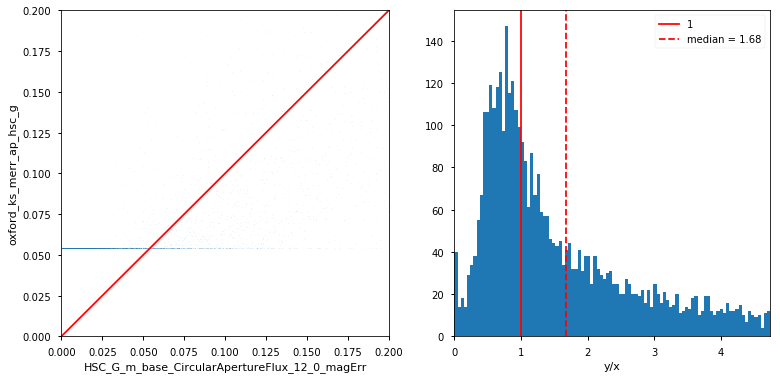

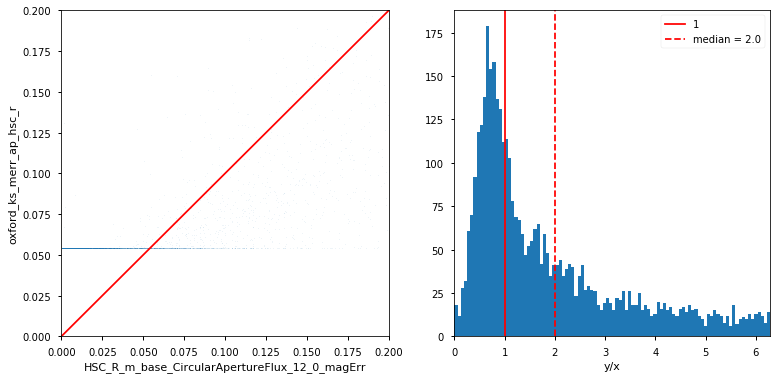

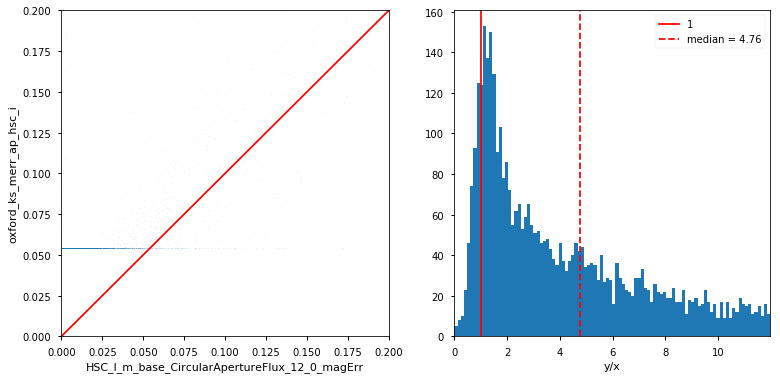

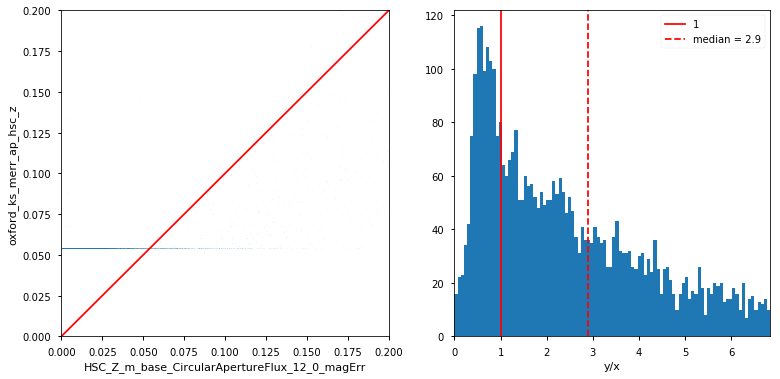

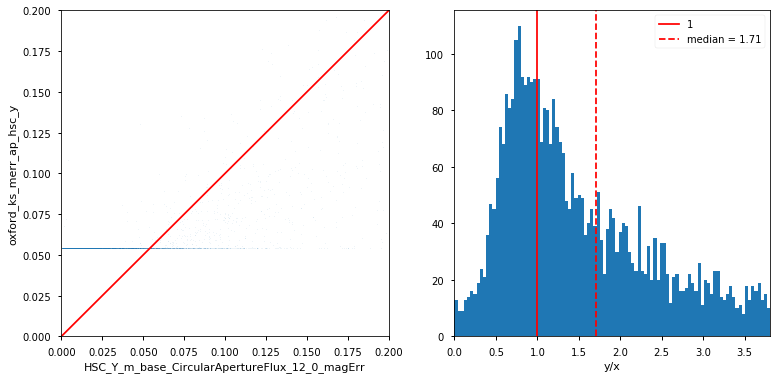

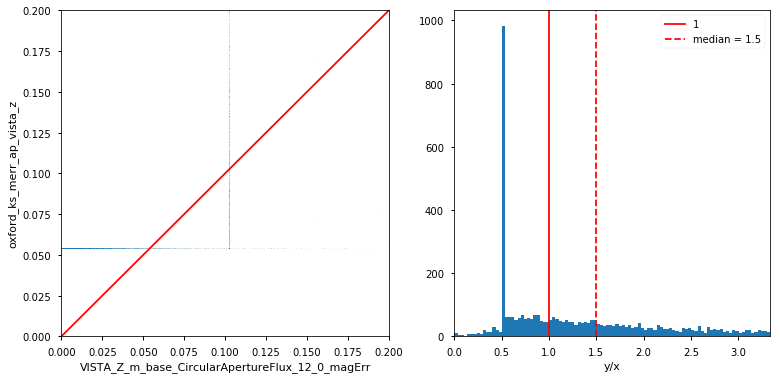

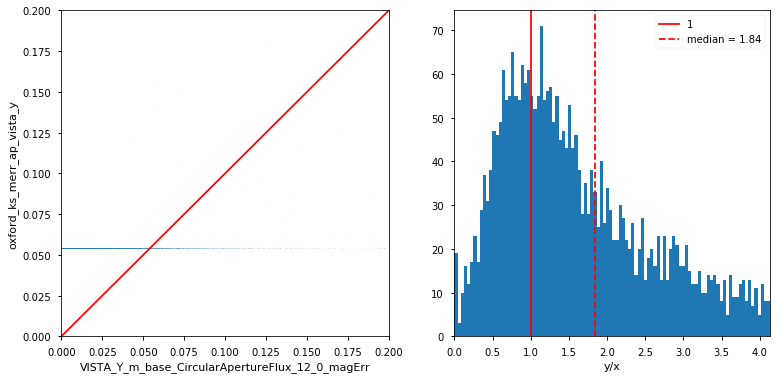

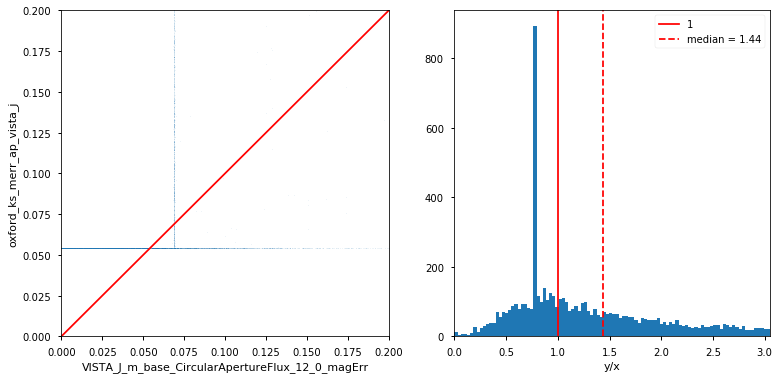

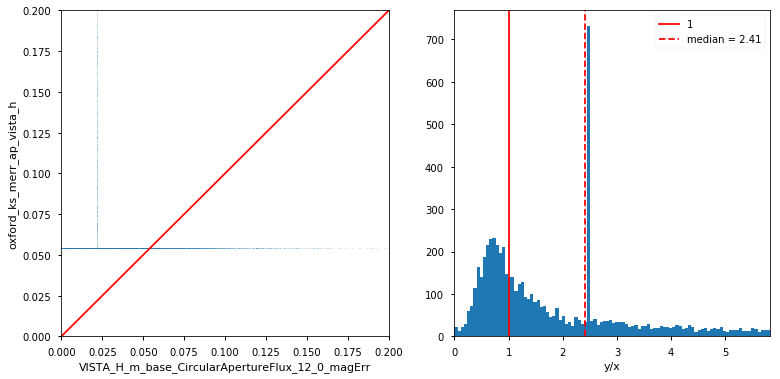

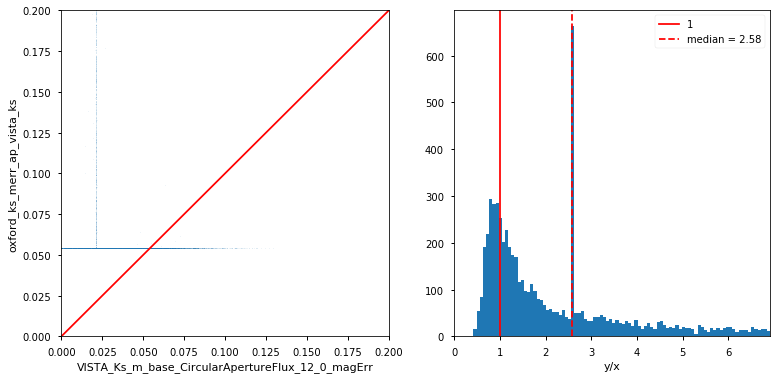

In [110]:
for b in allBands:
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    
    xName = '{}_m_base_CircularApertureFlux_12_0_magErr'.format(b)
    yName = 'oxford_ks_merr_ap_{}'.format(b.lower().replace('-','_'))
    ax1.scatter(
        merge[mask][xName],
        merge[mask][yName],
        s=0.1,
        alpha=0.2,rasterized=True)
    ax1.plot([0,1],[0,1], c='r')
    #ax1.plot([0,1],[0,2], c='r', linestyle='--')
    #ax1.plot([0,1],[0,0.339/0.168], c='r', linestyle='-.')
    ax1.set_xlim([0,0.2])
    ax1.set_ylim([0,0.2])
    ax1.set_xlabel(xName)
    ax1.set_ylabel(yName)
    m = mask & (merge[yName]>0.05)
    med = np.nanmedian(merge[m][yName]/merge[m][xName])
    #mode=stats.mode(merge[mask][yName]/merge[mask][xName],nan_policy='omit',axis=None).mode[0]
    ax2.axvline(1,c='r', label='1')
    ax2.axvline(med,c='r', linestyle='--', label='median = {}'.format(round(med,2)))
    #ax2.axvline(med,c='r',linestyle='--', label='mode = {}'.format(round(mode,2)))
    ax2.legend()
    lims=[0,np.nanpercentile(merge[mask][yName]/merge[mask][xName],75.)]
    ax2.hist(
    merge[m][yName]/merge[m][xName],
    bins=100, range=lims)
    ax2.set_xlabel("y/x")
    ax2.set_xlim(lims)

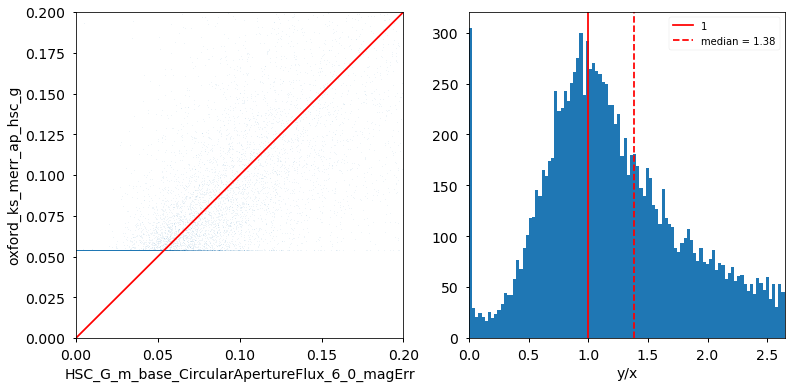

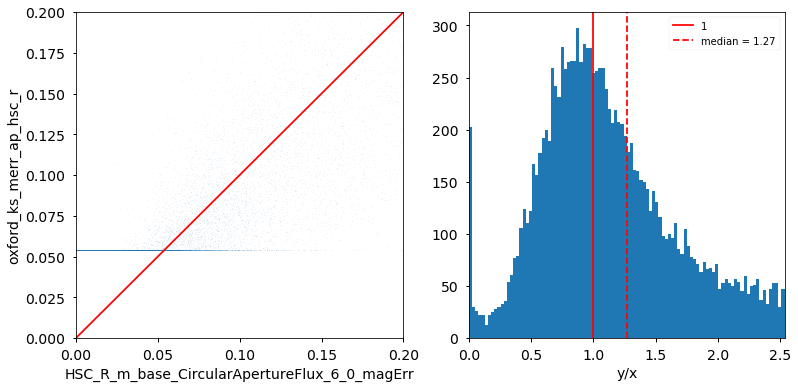

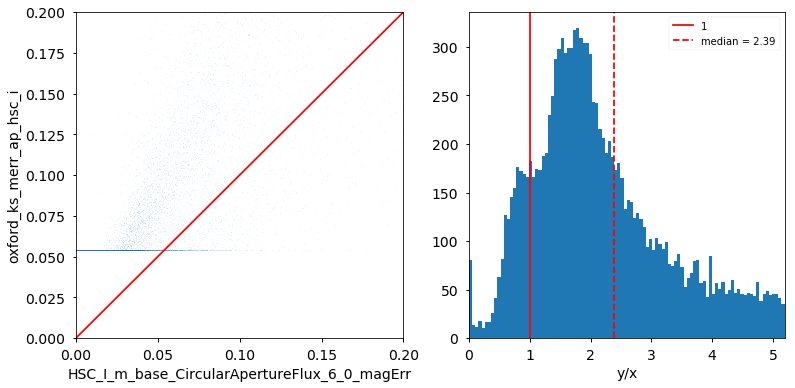

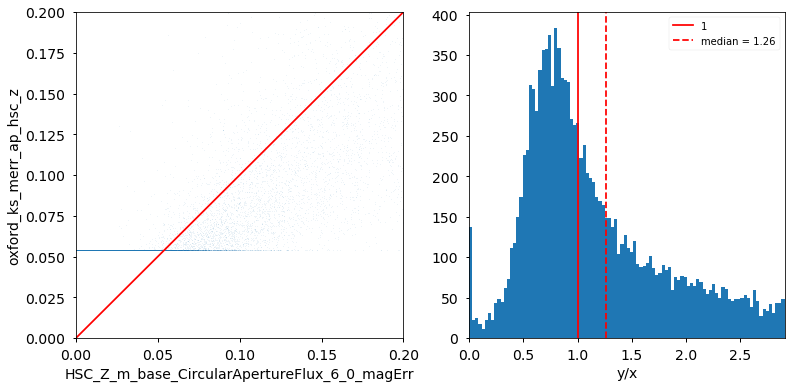

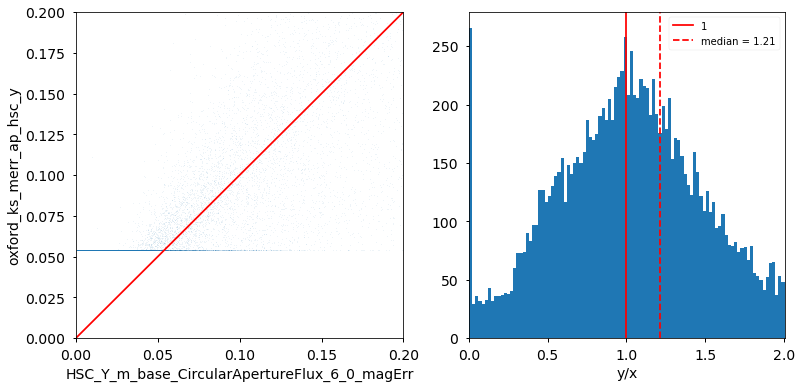

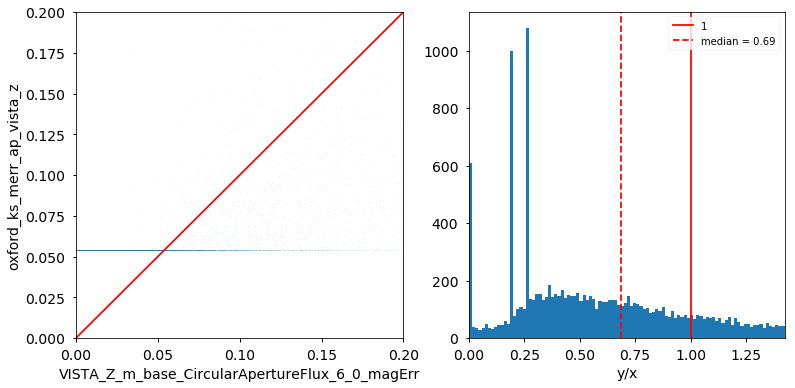

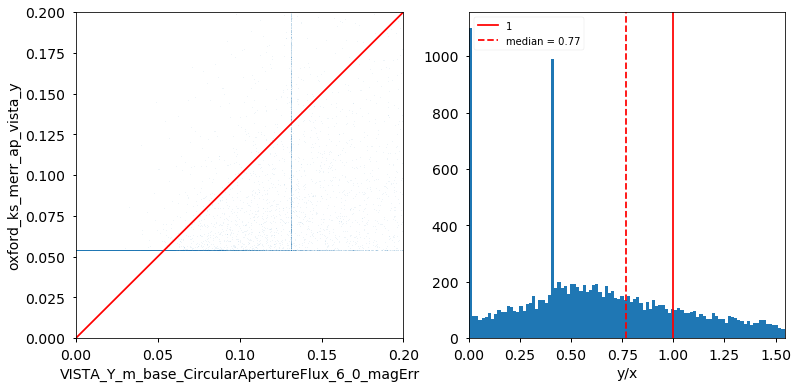

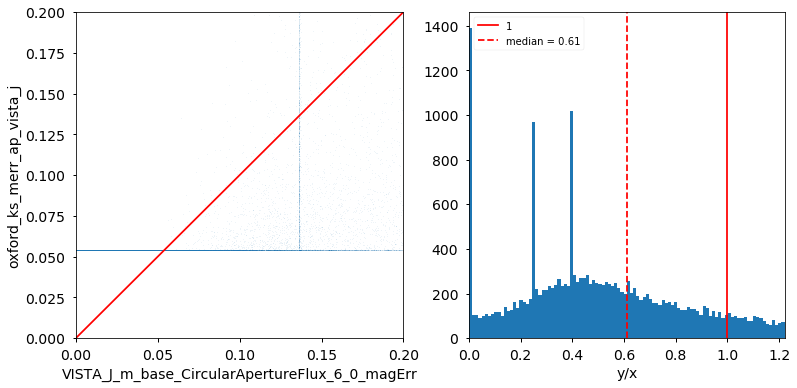

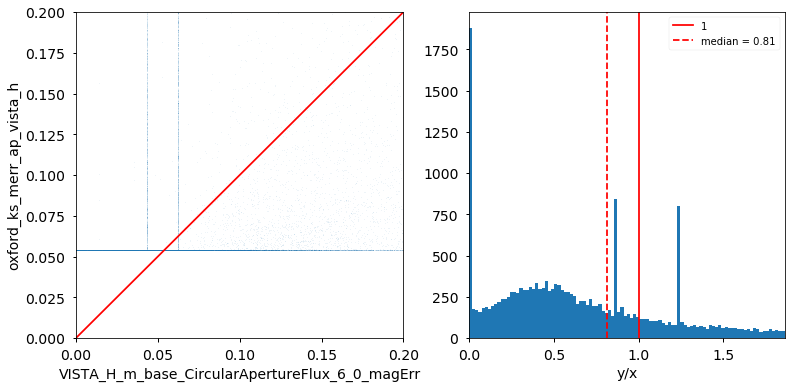

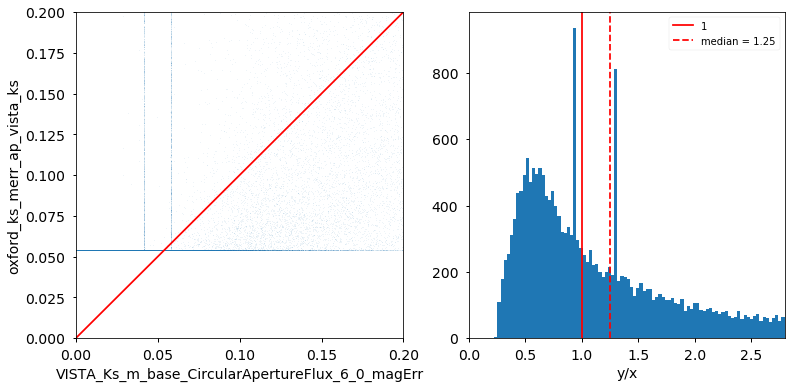

In [112]:
for b in allBands:
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    
    xName = '{}_m_base_CircularApertureFlux_6_0_magErr'.format(b)
    yName = 'oxford_ks_merr_ap_{}'.format(b.lower().replace('-','_'))
    ax1.scatter(
        merge[mask][xName],
        merge[mask][yName],
        s=0.1,
        alpha=0.2,rasterized=True)
    ax1.plot([0,1],[0,1], c='r')
    #ax1.plot([0,1],[0,2], c='r', linestyle='--')
    #ax1.plot([0,1],[0,0.339/0.168], c='r', linestyle='-.')
    ax1.set_xlim([0,0.2])
    ax1.set_ylim([0,0.2])
    ax1.set_xlabel(xName)
    ax1.set_ylabel(yName)
    m = mask & (merge[yName]>0.05)
    med = np.nanmedian(merge[m][yName]/merge[m][xName])
    #mode=stats.mode(merge[mask][yName]/merge[mask][xName],nan_policy='omit',axis=None).mode[0]
    ax2.axvline(1,c='r', label='1')
    ax2.axvline(med,c='r',linestyle='--', label='median = {}'.format(round(med,2)))
    #ax2.axvline(med,c='r',linestyle='--', label='mode = {}'.format(round(mode,2)))
    ax2.legend()
    lims=[0,np.nanpercentile(merge[m][yName]/merge[m][xName],75.)]
    ax2.hist(
    merge[m][yName]/merge[m][xName],
    bins=100, range=lims)
    ax2.set_xlabel("y/x")
    ax2.set_xlim(lims)

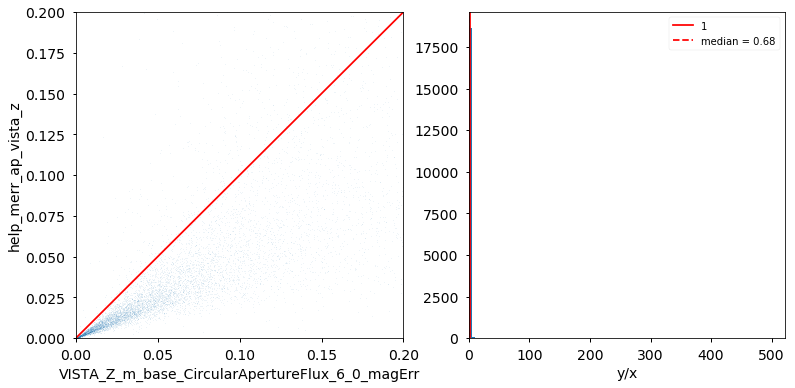

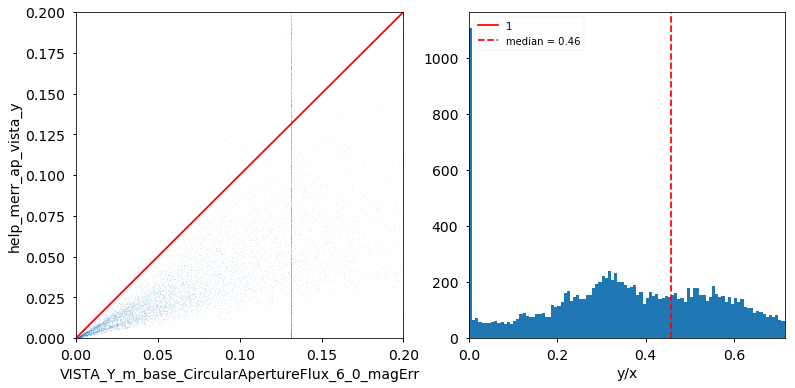

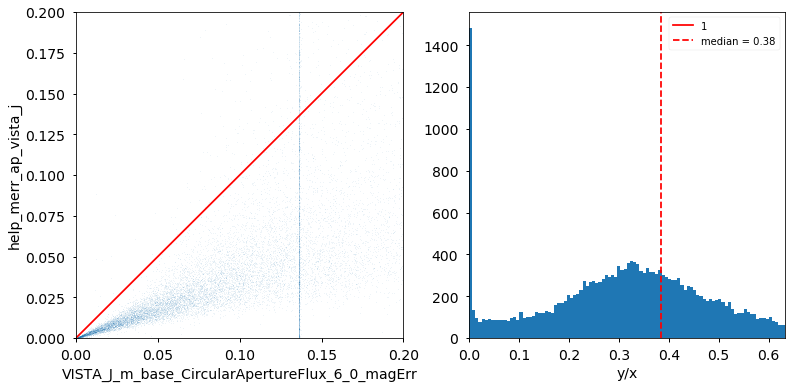

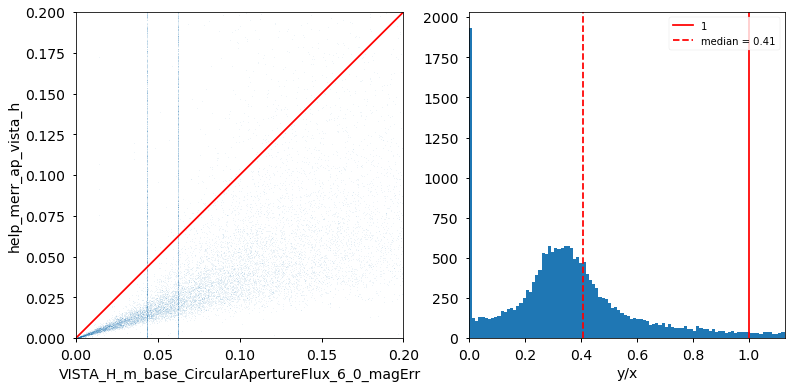

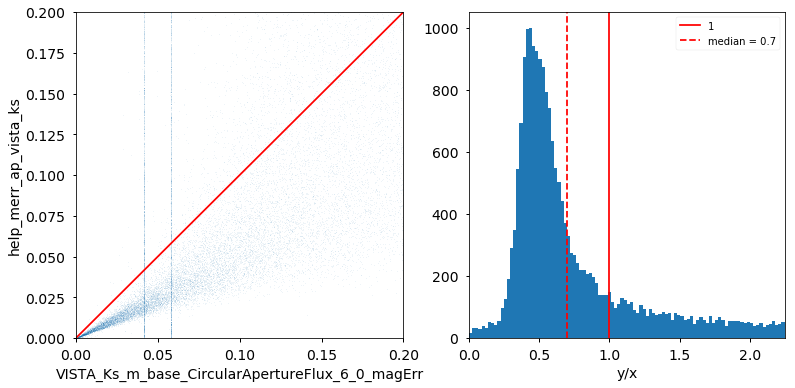

In [113]:
for b in allBands:
    if b.startswith('HSC'):
        continue
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    
    xName = '{}_m_base_CircularApertureFlux_6_0_magErr'.format(b)
    yName = 'help_merr_ap_{}'.format(b.lower().replace('-','_'))
    ax1.scatter(
        merge[mask][xName],
        merge[mask][yName],
        s=0.1,
        alpha=0.2,rasterized=True)
    ax1.plot([0,1],[0,1], c='r')
    #ax1.plot([0,1],[0,2], c='r', linestyle='--')
    #ax1.plot([0,1],[0,0.339/0.168], c='r', linestyle='-.')
    ax1.set_xlim([0,0.2])
    ax1.set_ylim([0,0.2])
    ax1.set_xlabel(xName)
    ax1.set_ylabel(yName)
    m = mask #& (merge[yName]>0.05)
    med = np.nanmedian(merge[m][yName]/merge[m][xName])
    #mode=stats.mode(merge[mask][yName]/merge[mask][xName],nan_policy='omit',axis=None).mode[0]
    ax2.axvline(1,c='r', label='1')
    ax2.axvline(med,c='r',linestyle='--', label='median = {}'.format(round(med,2)))
    #ax2.axvline(med,c='r',linestyle='--', label='mode = {}'.format(round(mode,2)))
    ax2.legend()
    lims=[0,np.nanpercentile(merge[m][yName]/merge[m][xName],75.)]
    ax2.hist(
    merge[m][yName]/merge[m][xName],
    bins=100, range=lims)
    ax2.set_xlabel("y/x")
    ax2.set_xlim(lims)

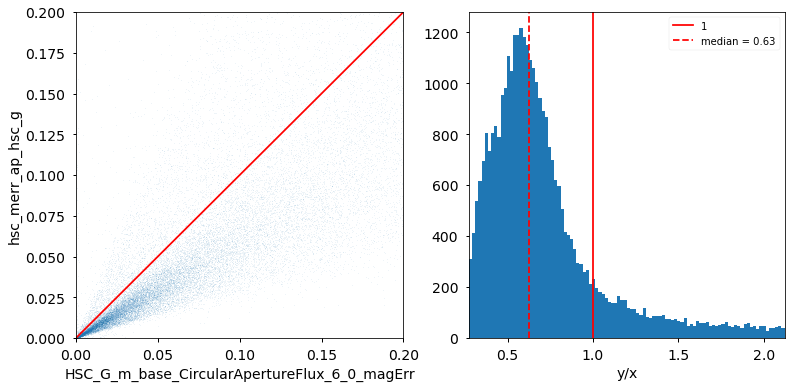

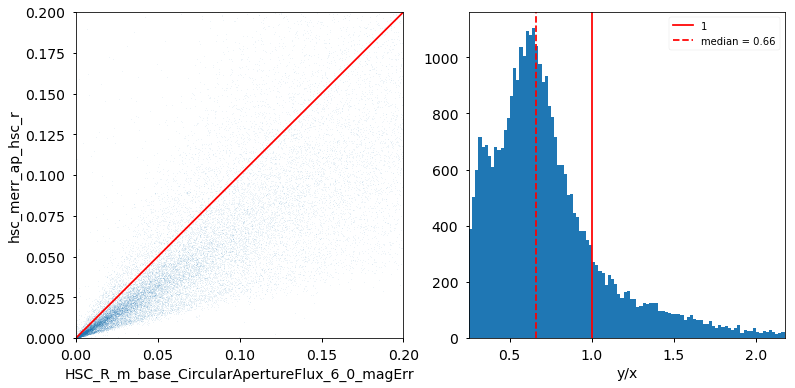

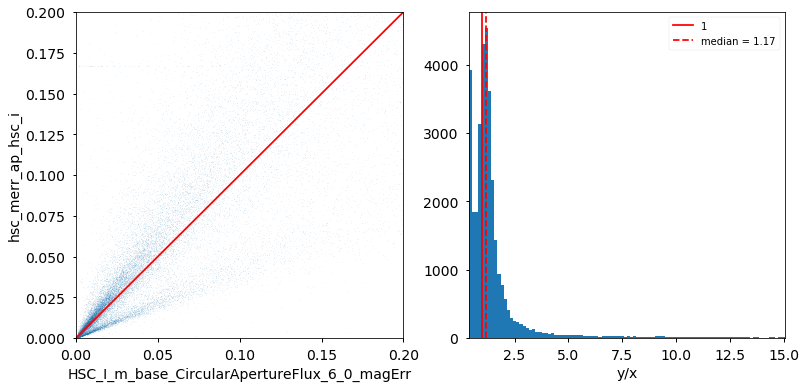

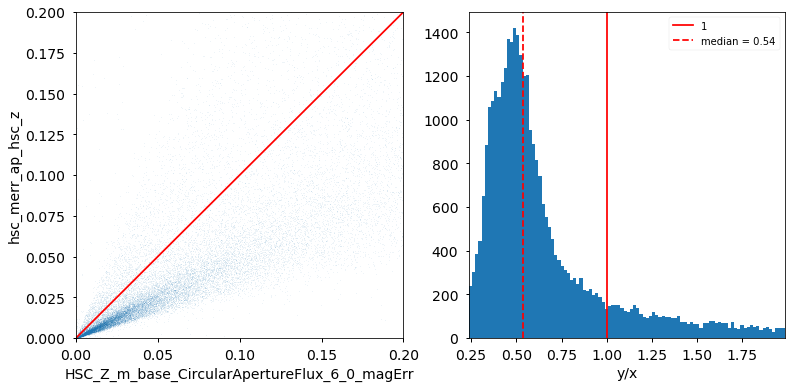

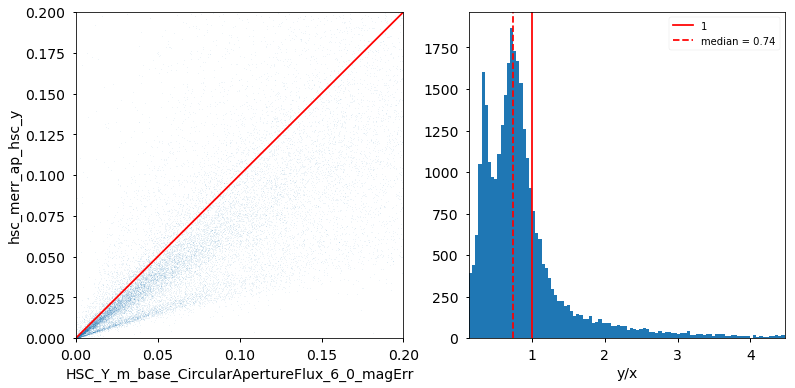

In [114]:
for b in allBands:
    if not b.startswith('HSC'):
        continue
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    
    xName = '{}_m_base_CircularApertureFlux_6_0_magErr'.format(b)
    yName = 'hsc_merr_ap_{}'.format(b.lower().replace('-','_'))
    ax1.scatter(
        merge[mask][xName],
        merge[mask][yName],
        s=0.1,
        alpha=0.2,rasterized=True)
    ax1.plot([0,1],[0,1], c='r')
    #ax1.plot([0,1],[0,2], c='r', linestyle='--')
    #ax1.plot([0,1],[0,0.339/0.168], c='r', linestyle='-.')
    ax1.set_xlim([0,0.2])
    ax1.set_ylim([0,0.2])
    ax1.set_xlabel(xName)
    ax1.set_ylabel(yName)
    m = mask #& (merge[yName]>0.05)
    med = np.nanmedian(merge[m][yName]/merge[m][xName])
    #mode=stats.mode(merge[mask][yName]/merge[mask][xName],nan_policy='omit',axis=None).mode[0]
    ax2.axvline(1,c='r', label='1')
    ax2.axvline(med,c='r',linestyle='--', label='median = {}'.format(round(med,2)))
    #ax2.axvline(med,c='r',linestyle='--', label='mode = {}'.format(round(mode,2)))
    ax2.legend()
    lims=[np.nanpercentile(merge[m][yName]/merge[m][xName],5.),np.nanpercentile(merge[m][yName]/merge[m][xName],95.)]
    ax2.hist(
    merge[m][yName]/merge[m][xName],
    bins=100, range=lims)
    ax2.set_xlabel("y/x")
    ax2.set_xlim(lims)

Text(0, 0.5, 'LSST - Oxford [mag]')

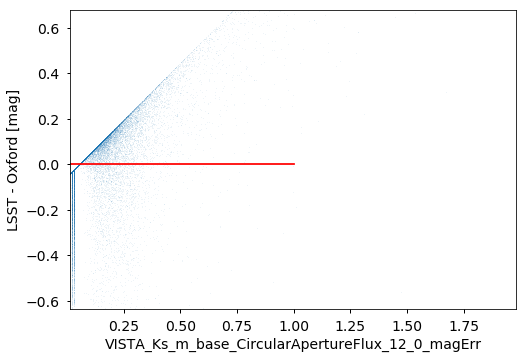

In [115]:
xName = 'VISTA_Ks_m_base_CircularApertureFlux_12_0_magErr'
yName = 'oxford_ks_merr_ap_vista_ks'
plt.scatter(
    merge[mask][xName],
    merge[mask][xName]-merge[mask][yName],
    s=0.1,
    alpha=0.2)
plt.plot([0,1],[0,0], c='r')
plt.xlim([
    np.nanpercentile(merge[mask][xName],2.5),
    np.nanpercentile(merge[mask][xName],97.5)])
plt.ylim([
    np.nanpercentile(merge[mask][xName]-merge[mask][yName],2.5),
    np.nanpercentile(merge[mask][xName]-merge[mask][yName],97.5)])
plt.xlabel(xName)
plt.ylabel("{} - {} [mag]".format('LSST', 'Oxford'))

Text(0, 0.5, 'LSST Err - Oxford Err [mag]')

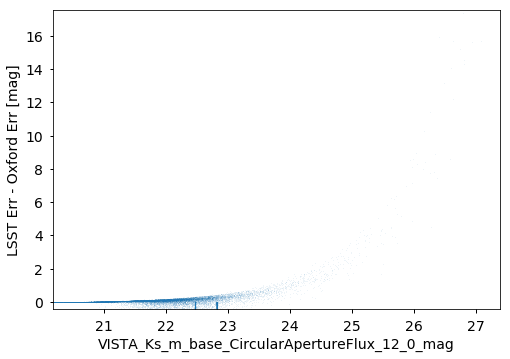

In [116]:

xName = 'VISTA_Ks_m_base_CircularApertureFlux_12_0_mag'
yName = 'oxford_ks_merr_ap_vista_ks'
yName2 = 'VISTA_Ks_m_base_CircularApertureFlux_12_0_magErr'
plt.scatter(
    merge[mask][xName],
    merge[mask][yName2]-merge[mask][yName],
    s=0.1,
    alpha=0.2)
plt.plot([0,1],[0,0], c='r')
plt.xlim([
    np.nanpercentile(merge[mask][xName],2.5),
    np.nanpercentile(merge[mask][xName],99.9)])
plt.ylim([
    np.nanpercentile(merge[mask][yName2]-merge[mask][yName],5.),
    np.nanpercentile(merge[mask][yName2]-merge[mask][yName],99.9)])
plt.xlabel(xName)
plt.ylabel("{} Err - {} Err [mag]".format('LSST', 'Oxford'))

Comparing VISTA-Ks band AB 2 arc sec aperture magnitude errors from LSST and Oxford
Mean offset = -0.037
Median offset = 0.009


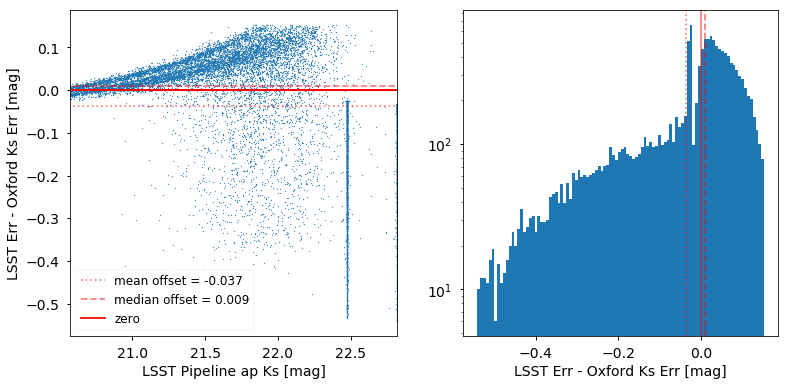

In [124]:

    
def mag_err_diff(x,xerr,y,yerr, labels,savefig=False):
    """Plot error offsets against magnitude for two sets of mags and errors"""
    #if 'ap' in labels[0]:
        #print("Comparing {} band AB 2 arc sec aperture magnitudes from {} and {}".format(labels[2],labels[0],labels[1]))
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    #ax3 = plt.subplot(gs2[:, -1], sharey=ax2)
    
    plot_bounds=[5,95]
    m = xerr > np.nanpercentile(xerr,plot_bounds[0]) #cut errors to make plot ranges sensible 
    m &= xerr < np.nanpercentile(xerr,plot_bounds[1])
    m &= yerr > np.nanpercentile(yerr,plot_bounds[0])
    m &= yerr < np.nanpercentile(yerr,plot_bounds[1])
    m &= x > np.nanpercentile(x,plot_bounds[0]) #cut LSST mags
    m &= x < np.nanpercentile(x,plot_bounds[1])
    xerr = xerr[m]
    yerr = yerr[m]
    x = x[m]
    y = y[m]

    mean_offset = np.nanmean(xerr - yerr)
    median_offset = np.nanmedian(xerr - yerr)
    print("Mean offset = {}".format(round(mean_offset,4)))
    print("Median offset = {}".format(round(median_offset,4)))
    
    total_var = xerr**2 + yerr**2 +0.03**2 #the extra 0.03 is an estimate of the abs. cal. error for vista
    unsaturated = (x>14.5) & (x<15.5)

    #less relevant for errors
    weighted_bias = np.nansum(
        (
            xerr[unsaturated]
            -yerr[unsaturated]
        )/total_var[unsaturated]
    )/np.nansum(1./total_var[unsaturated])
    #print('Weighted bias (14.5<mag<15.5) = {}'.format(round(weighted_bias,4)))
    
    
    ax1.plot([0,100],[mean_offset,mean_offset], linestyle='dotted', c='r', alpha=0.5,
             label = 'mean offset = {}'.format(round(mean_offset,4)))
    ax1.plot([0,100],[median_offset,median_offset], linestyle='dashed', c='r', alpha=0.5,
         label = 'median offset = {}'.format(round(median_offset,4)))
    #ax1.plot([0,100],[weighted_bias,weighted_bias], linestyle='dashdot', c='r', alpha=0.5,
    #     label = 'Weighted bias = {}'.format(round(weighted_bias,4)))
    ax1.plot([0,100],[0,0], c='r', label='zero')
    ax1.legend( prop={'size': 12})#, loc='lower left')
    ax1.scatter(x,   xerr - yerr, 
            alpha=0.8, s=1, rasterized=True)
    
    
    ax1.set_xlabel('{} [mag]'.format(labels[0]))
    ax1.plot([0,100],[0,0], c='r')
    
    #upper = np.min([25.,np.nanmax(x),np.nanmax(y)+1] )
    ax1.set_xlim([np.nanmin(x),np.nanmax(x)])
    #ax1.set_ylim([np.nanpercentile(xerr-yerr,2.5),np.nanpercentile(xerr-yerr,97.5)])
    ax1.set_ylabel('{} Err - {} Err [mag]'.format("LSST",labels[1]))
    
    ax2.hist(xerr - yerr, bins=100)
    #ax2.set_xlim([np.nanpercentile(xerr-yerr,2.5),np.nanpercentile(xerr-yerr,97.5)])
    ax2.set_yscale('log')
    ax2.set_xlabel('{} Err - {} Err [mag]'.format("LSST",labels[1]))
    ax2.axvline(0, c='r', alpha=0.5)
    ax2.axvline(mean_offset,linestyle='dotted', c='r', alpha=0.5)
    ax2.axvline(median_offset,linestyle='dashed', c='r', alpha=0.5)
    #ax2.axvline(weighted_bias,linestyle='dashdot', c='r', alpha=0.5)
    
    
    #plt.rc('font', family='serif', serif='Times')
    plt.rc('text') #, usetex=True)
    plt.rc('xtick', labelsize=14)
    plt.rc('ytick', labelsize=14)
    plt.rc('axes', labelsize=14)
    plt.show()


    if savefig:
        plt.savefig('./figs/mag_err_compare_{}_{}.pdf'.format(labels[0],labels[1]), bbox_inches='tight')
        plt.savefig('./figs/mag_err_compare_{}_{}.png'.format(labels[0],labels[1]), bbox_inches='tight')
    
    
f,ferr= mag_to_flux(
    merge['VISTA_Ks_m_base_CircularApertureFlux_12_0_mag'],
    merge['VISTA_Ks_m_base_CircularApertureFlux_12_0_magErr'])
                    
mask = f/ferr > 5

f,ferr= mag_to_flux(
    merge['oxford_ks_m_ap_vista_ks'],
    merge['oxford_ks_merr_ap_vista_ks'])
                    
#mask &= f/ferr > 5
print("Comparing VISTA-Ks band AB 2 arc sec aperture magnitude errors from LSST and Oxford")
mag_err_diff(
    merge[mask]['VISTA_Ks_m_base_CircularApertureFlux_12_0_mag'],
    merge[mask]['VISTA_Ks_m_base_CircularApertureFlux_12_0_magErr'],
    merge[mask]['oxford_ks_m_ap_vista_ks'],
    merge[mask]['oxford_ks_merr_ap_vista_ks'],
    ['LSST Pipeline ap Ks','Oxford Ks', 'Ks'])
    


HSC_G_m_base_CircularApertureFlux_6_0_mag
Comparing HSC_G band AB 2 arcsec radius aperture magnitude errors from LSST and Oxford
Mean offset = 0.0299
Median offset = -0.015


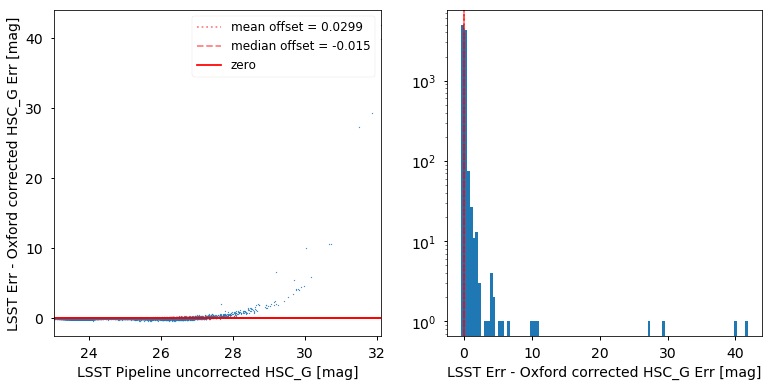

Comparing HSC_G band magnitude errors from LSST PSF and Oxford 2 arcsec corrected  
Mean offset = 0.0094
Median offset = -0.0215


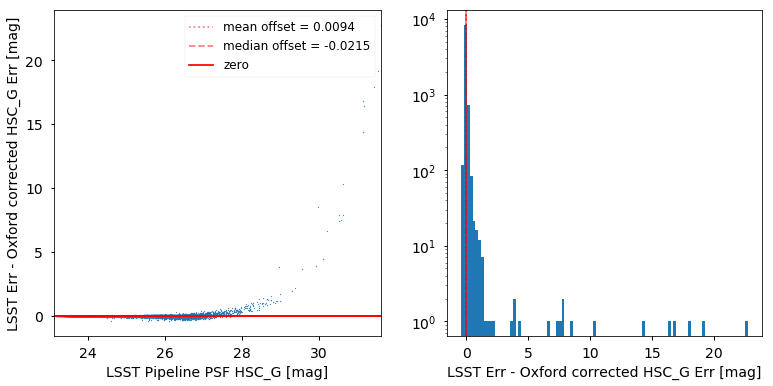

HSC_R_m_base_CircularApertureFlux_6_0_mag
Comparing HSC_R band AB 2 arcsec radius aperture magnitude errors from LSST and Oxford
Mean offset = 0.0298
Median offset = -0.0122


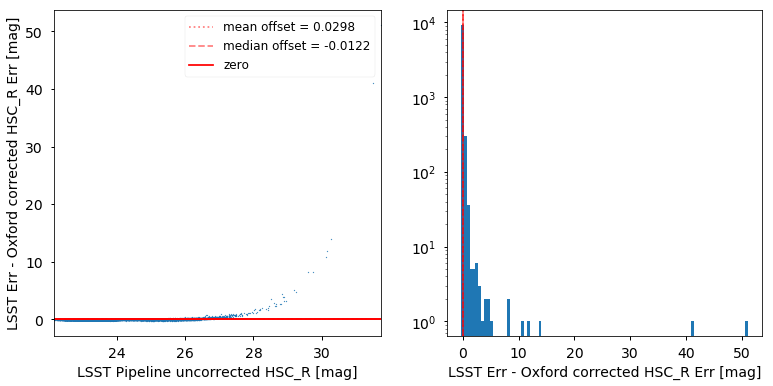

Comparing HSC_R band magnitude errors from LSST PSF and Oxford 2 arcsec corrected  
Mean offset = 0.0308
Median offset = -0.019


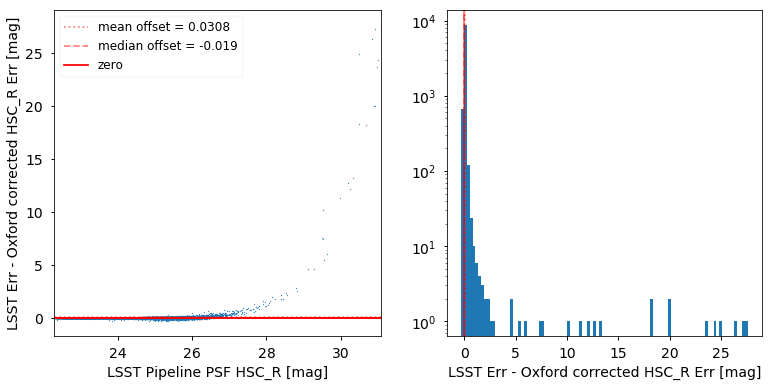

HSC_I_m_base_CircularApertureFlux_6_0_mag
Comparing HSC_I band AB 2 arcsec radius aperture magnitude errors from LSST and Oxford
Mean offset = -0.028
Median offset = -0.0389


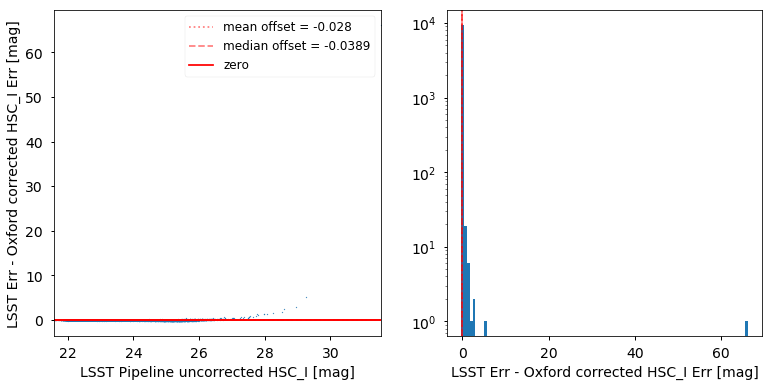

Comparing HSC_I band magnitude errors from LSST PSF and Oxford 2 arcsec corrected  
Mean offset = -0.0469
Median offset = -0.0424


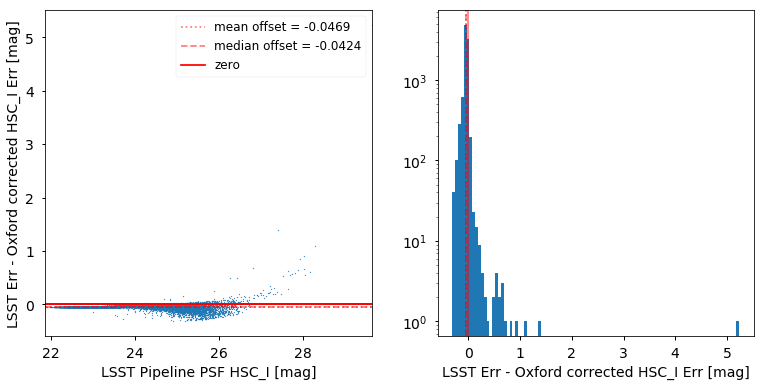

HSC_Z_m_base_CircularApertureFlux_6_0_mag
Comparing HSC_Z band AB 2 arcsec radius aperture magnitude errors from LSST and Oxford
Mean offset = 0.0214
Median offset = -0.0126


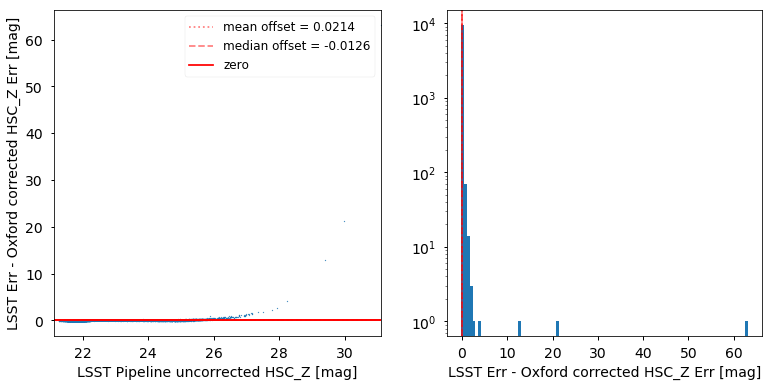

Comparing HSC_Z band magnitude errors from LSST PSF and Oxford 2 arcsec corrected  
Mean offset = 0.0073
Median offset = -0.0218


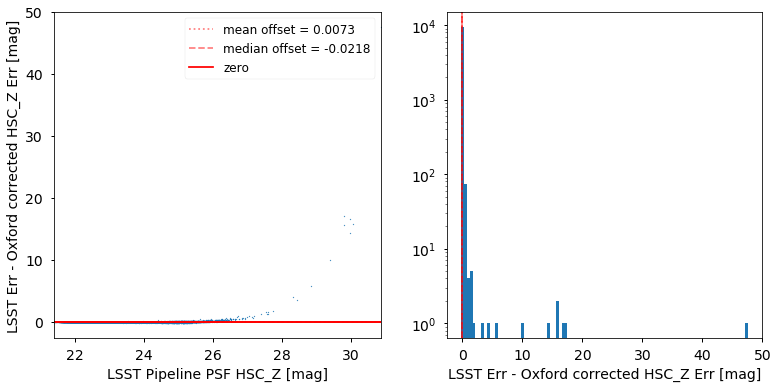

HSC_Y_m_base_CircularApertureFlux_6_0_mag
Comparing HSC_Y band AB 2 arcsec radius aperture magnitude errors from LSST and Oxford
Mean offset = 0.1478
Median offset = -0.0121


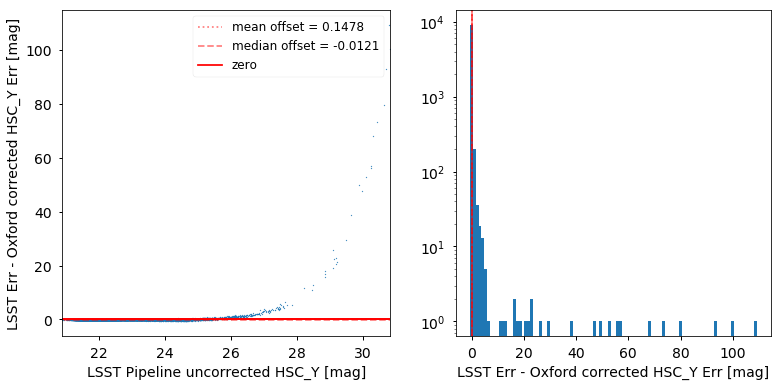

Comparing HSC_Y band magnitude errors from LSST PSF and Oxford 2 arcsec corrected  
Mean offset = 0.0226
Median offset = -0.0232


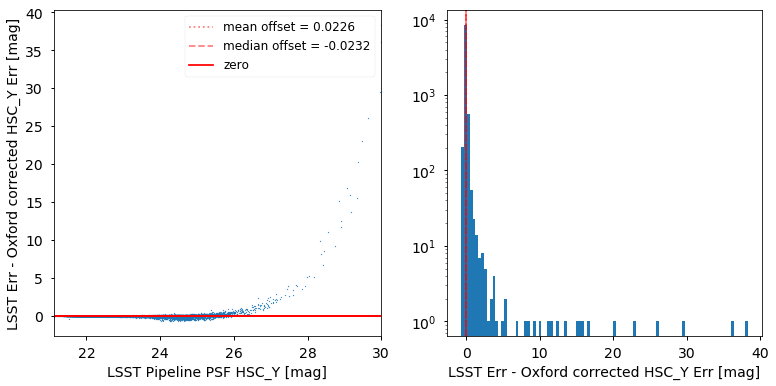

VISTA_Z_m_base_CircularApertureFlux_6_0_mag
Comparing VISTA_Z band AB 2 arcsec radius aperture magnitude errors from LSST and Oxford
Mean offset = 0.1335
Median offset = 0.0742


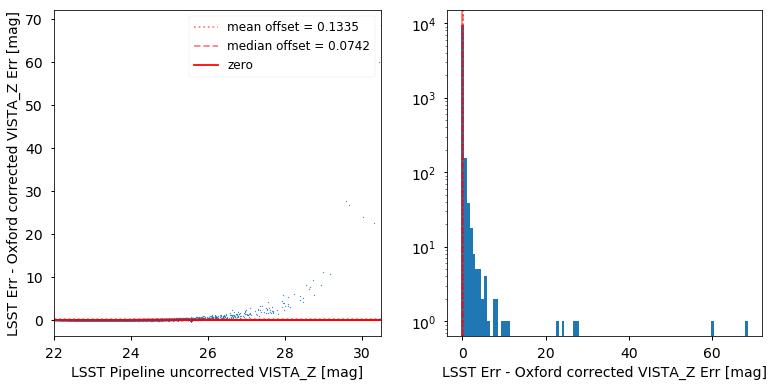

Comparing VISTA_Z band magnitude errors from LSST PSF and Oxford 2 arcsec corrected  
Mean offset = 0.1191
Median offset = -0.0097


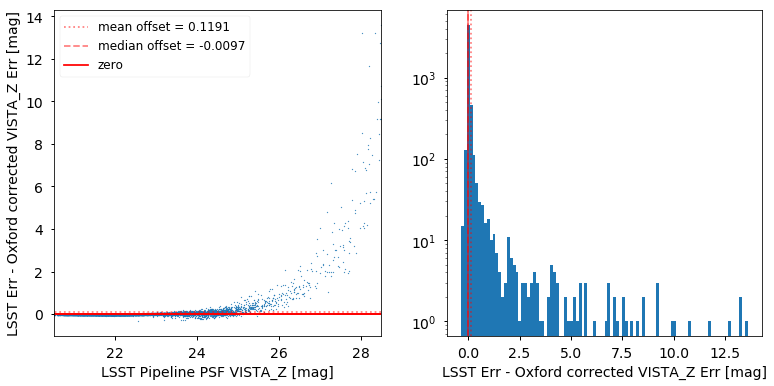

VISTA_Y_m_base_CircularApertureFlux_6_0_mag
Comparing VISTA_Y band AB 2 arcsec radius aperture magnitude errors from LSST and Oxford
Mean offset = 0.0989
Median offset = 0.0257


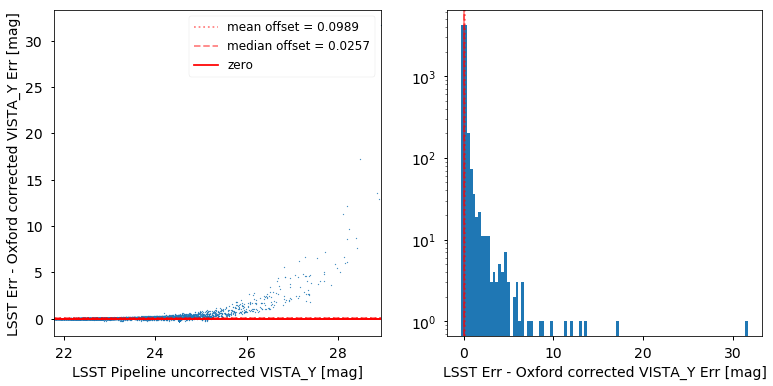

Comparing VISTA_Y band magnitude errors from LSST PSF and Oxford 2 arcsec corrected  
Mean offset = 0.1757
Median offset = 0.0028


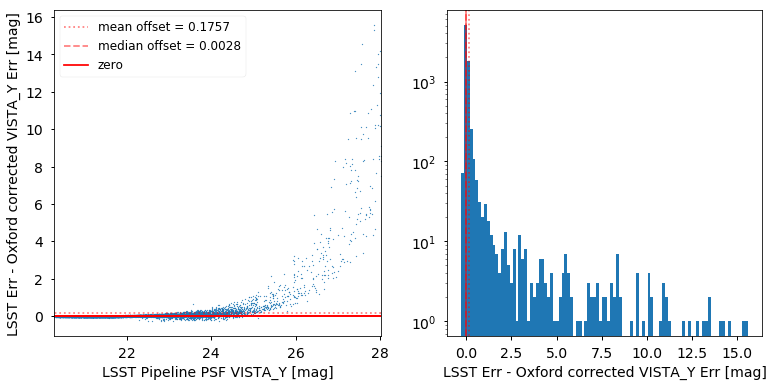

VISTA_J_m_base_CircularApertureFlux_6_0_mag
Comparing VISTA_J band AB 2 arcsec radius aperture magnitude errors from LSST and Oxford
Mean offset = 0.1452
Median offset = 0.0486


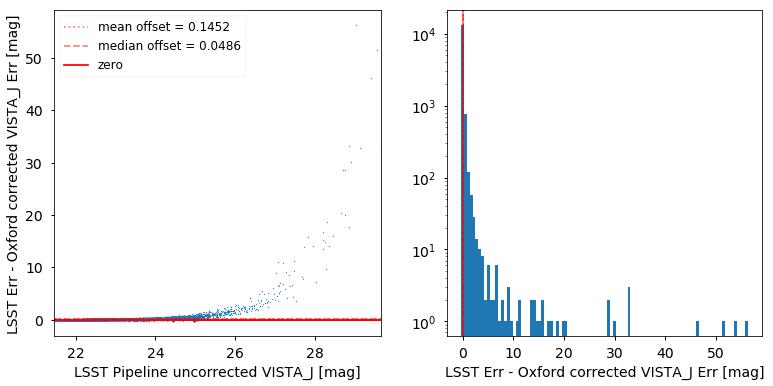

Comparing VISTA_J band magnitude errors from LSST PSF and Oxford 2 arcsec corrected  
Mean offset = 0.2104
Median offset = 0.0193


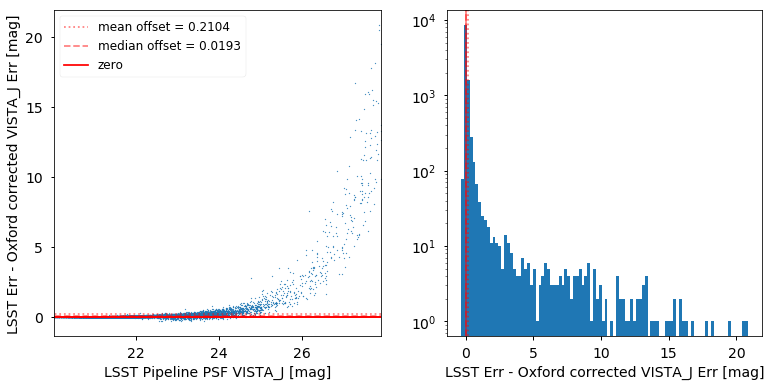

VISTA_H_m_base_CircularApertureFlux_6_0_mag
Comparing VISTA_H band AB 2 arcsec radius aperture magnitude errors from LSST and Oxford
Mean offset = 0.1045
Median offset = 0.0082


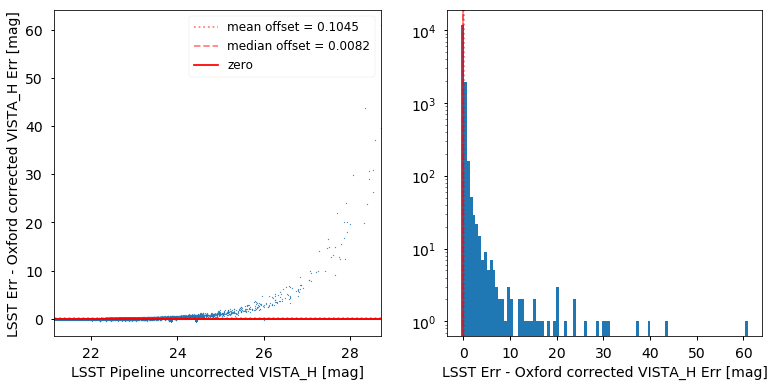

Comparing VISTA_H band magnitude errors from LSST PSF and Oxford 2 arcsec corrected  
Mean offset = 0.3097
Median offset = 0.0254


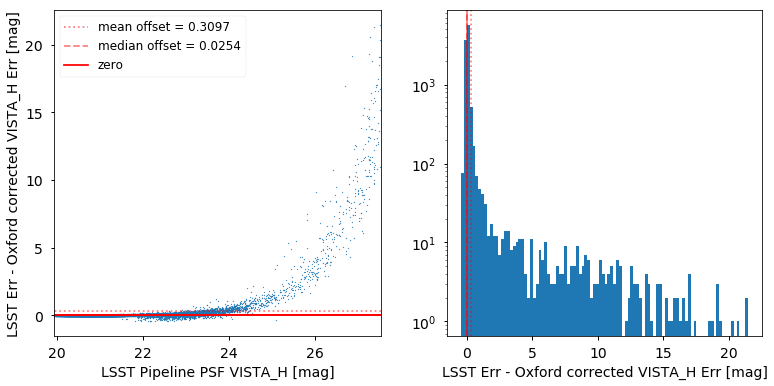

VISTA_Ks_m_base_CircularApertureFlux_6_0_mag
Comparing VISTA_Ks band AB 2 arcsec radius aperture magnitude errors from LSST and Oxford
Mean offset = -0.0465
Median offset = -0.0041


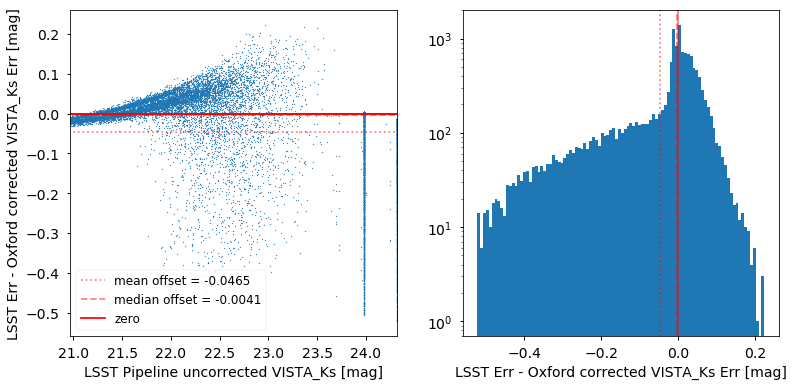

Comparing VISTA_Ks band magnitude errors from LSST PSF and Oxford 2 arcsec corrected  
Mean offset = -0.01
Median offset = -0.0018


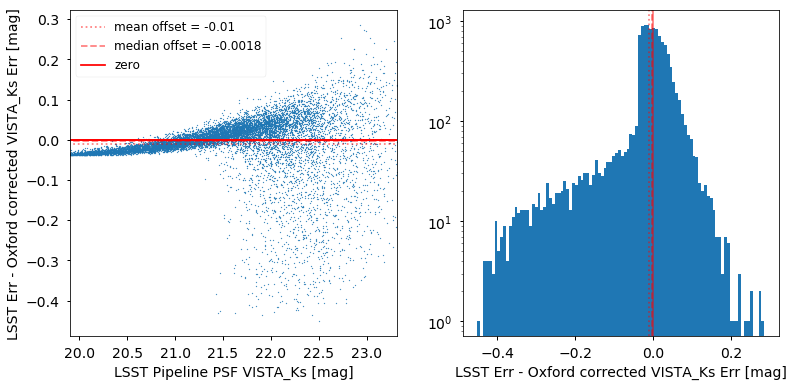

In [135]:
for col in merge.colnames:
    if col.endswith('6_0_mag'):
        print(col)
        band = '{}_{}'.format(col.split('_')[0],col.split('_')[1])
        print("Comparing {} band AB 2 arcsec radius aperture magnitude errors from LSST and Oxford".format(band))
        try:
            mag_err_diff(
                merge[mask]['{}_m_base_CircularApertureFlux_6_0_mag'.format(band)],
                merge[mask]['{}_m_base_CircularApertureFlux_6_0_magErr'.format(band)],
                merge[mask]['oxford_ks_m_ap_{}'.format(band.lower().replace('-','_'))],
                merge[mask]['oxford_ks_merr_ap_{}'.format(band.lower().replace('-','_'))],
                ['LSST Pipeline uncorrected {}'.format(band),'Oxford corrected {}'.format(band), '{}'.format(band)])
            print("Comparing {} band magnitude errors from LSST PSF and Oxford 2 arcsec corrected  ".format(band))
            mag_err_diff(
                merge[mask]['{}_m_base_PsfFlux_mag'.format(band)],
                merge[mask]['{}_m_base_PsfFlux_magErr'.format(band)],
                merge[mask]['oxford_ks_m_ap_{}'.format(band.lower().replace('-','_'))],
                merge[mask]['oxford_ks_merr_ap_{}'.format(band.lower().replace('-','_'))],
                ['LSST Pipeline PSF {}'.format(band),'Oxford corrected {}'.format(band), '{}'.format(band)])
        except:
            print('Failed')

## Astrometry

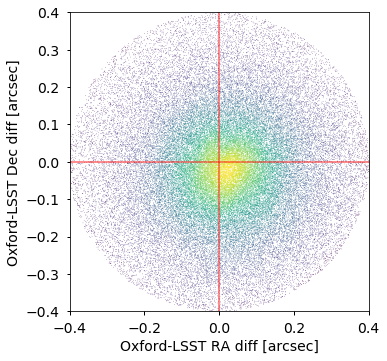

In [125]:
m = ~np.isnan(merge['oxford_ks_ra'])
m &= ~np.isnan(merge['VISTA_Ks_m_coord_ra'])
fig, ax = plt.subplots()
x=(merge[m]['oxford_ks_ra'].to(u.arcsec)-merge[m]['VISTA_Ks_m_coord_ra'].to(u.arcsec)).value
y=(merge[m]['oxford_ks_dec'].to(u.arcsec) - merge[m]['VISTA_Ks_m_coord_dec'].to(u.arcsec)).value
data , x_e, y_e = np.histogram2d( x,  x - y, bins = 20, density = True )
z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , 
                data , np.vstack([x, x - y]).T, method = "splinef2d" , bounds_error = False)#, method = "splinef2d"

    #To be sure to plot all data
z[np.where(np.isnan(z))] = 0.0

    # Sort the points by density, so that the densest points are plotted last
if True :
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]
ax.scatter(
    x, 
    y,
    c=z,
    s=0.05,alpha=1.,
    rasterized=True
)

#fig.colorbar(im, ax=ax, label="Number",fraction=0.046, pad=0.04)
ax.plot([-1,1],[0,0], c='r', alpha=0.5)
ax.plot([0,0],[-1,1], c='r', alpha=0.5)
ax.set_xlabel('Oxford-LSST RA diff [arcsec]')
ax.set_ylabel('Oxford-LSST Dec diff [arcsec]')
ax.set_aspect('equal')
ax.set_xlim([-0.4,0.4])
ax.set_ylim([-0.4,0.4])

plt.savefig('./figs/astrometry_LSST_Oxford.pdf', bbox_inches='tight')
plt.savefig('./figs/astrometry_LSST_Oxford.png', bbox_inches='tight')

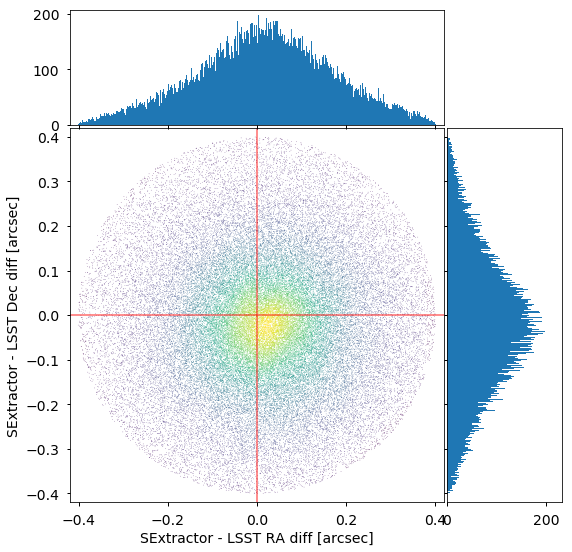

In [126]:
def scatter_hist(x, y, ax, ax_histx, ax_histy):
    # no labels
    ax_histx.tick_params(axis="x", labelbottom=False)
    ax_histy.tick_params(axis="y", labelleft=False)

    # the scatter plot:
    data , x_e, y_e = np.histogram2d( x,  x - y, bins = 20, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , 
                data , np.vstack([x, x - y]).T, method = "splinef2d" , bounds_error = False)#, method = "splinef2d"

    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    # Sort the points by density, so that the densest points are plotted last
    if True :
        idx = z.argsort()
        x, y, z = x[idx], y[idx], z[idx]
    ax.scatter(
        x, 
        y,
        c=z,
        s=0.05,alpha=1.,
        rasterized=True
    )
    ax.plot([-1,1],[0,0], c='r', alpha=0.5)
    ax.plot([0,0],[-1,1], c='r', alpha=0.5)
    ax.set_xlabel('SExtractor - LSST RA diff [arcsec]')
    ax.set_ylabel('SExtractor - LSST Dec diff [arcsec]')
    ax.set_aspect('equal')
    ax.set_xlim([-0.42,0.42])
    ax.set_ylim([-0.42,0.42])
    # now determine nice limits by hand:
    binwidth = 0.001
    xymax = max(np.max(np.abs(x)), np.max(np.abs(y)))
    lim = (int(xymax/binwidth) + 1) * binwidth

    bins = np.arange(-lim, lim + binwidth, binwidth)
    ax_histx.hist(x, bins=bins)
    ax_histy.hist(y, bins=bins, orientation='horizontal')
    
    
m = ~np.isnan(merge['oxford_ks_ra'])
m &= ~np.isnan(merge['VISTA_Ks_m_coord_ra'])

x=(merge[m]['oxford_ks_ra'].to(u.arcsec)-merge[m]['VISTA_Ks_m_coord_ra'].to(u.arcsec)).value
y=(merge[m]['oxford_ks_dec'].to(u.arcsec) - merge[m]['VISTA_Ks_m_coord_dec'].to(u.arcsec)).value    

# definitions for the axes
left, width = 0.1, 0.65
bottom, height = 0.1, 0.65
spacing = 0.005


rect_scatter = [left, bottom, width, height]
rect_histx = [left, bottom + height + spacing, width, 0.2]
rect_histy = [left + width + spacing, bottom, 0.2, height]

# start with a square Figure
fig = plt.figure(figsize=(8, 8))

ax = fig.add_axes(rect_scatter)
ax_histx = fig.add_axes(rect_histx, sharex=ax)
ax_histy = fig.add_axes(rect_histy, sharey=ax)

# use the previously defined function
scatter_hist(x, y, ax, ax_histx, ax_histy)

plt.savefig('./figs/astrometry_LSST_Oxford_marginal.pdf', bbox_inches='tight')
plt.savefig('./figs/astrometry_LSST_Oxford_matginal.png', bbox_inches='tight')

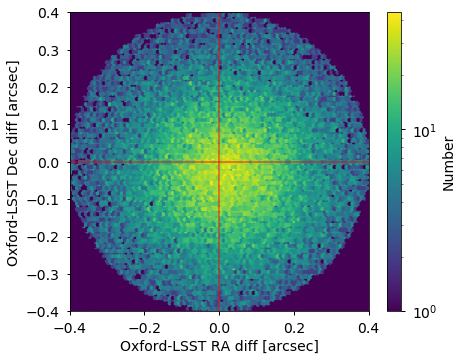

In [127]:
fig, ax = plt.subplots()


m = ~np.isnan(merge['oxford_ks_ra'])
m &= ~np.isnan(merge['VISTA_Ks_m_coord_ra'])



im = ax.hexbin(
    merge[m]['oxford_ks_ra'].to(u.arcsec)-merge[m]['VISTA_Ks_m_coord_ra'].to(u.arcsec), 
    merge[m]['oxford_ks_dec'].to(u.arcsec) - merge[m]['VISTA_Ks_m_coord_dec'].to(u.arcsec),  
    bins="log")#cmap='Oranges',, cmap='Greys'

fig.colorbar(im, ax=ax, label="Number",fraction=0.046, pad=0.04)

ax.plot([-1,1],[0,0], c='r', alpha=0.5)
ax.plot([0,0],[-1,1], c='r', alpha=0.5)
ax.set_xlabel('Oxford-LSST RA diff [arcsec]')
ax.set_ylabel('Oxford-LSST Dec diff [arcsec]')
ax.set_aspect('equal')
ax.set_xlim([-0.4,0.4])
ax.set_ylim([-0.4,0.4])

plt.savefig('./figs/astrometry_LSST_Oxford_hexbin.pdf', bbox_inches='tight')
plt.savefig('./figs/astrometry_LSST_Oxford_hexbin.png', bbox_inches='tight')


In [136]:
np.nanmedian(merge[m]['oxford_ks_ra'].to(u.arcsec)-merge[m]['VISTA_Ks_m_coord_ra'].to(u.arcsec))

<Quantity 0.01822436 arcsec>

In [137]:
np.nanstd(merge[m]['oxford_ks_ra'].to(u.arcsec)-merge[m]['VISTA_Ks_m_coord_ra'].to(u.arcsec))

<Quantity 0.15465027 arcsec>

In [138]:
np.nanmedian(merge[m]['oxford_ks_dec'].to(u.arcsec)-merge[m]['VISTA_Ks_m_coord_dec'].to(u.arcsec))

<Quantity -0.02304687 arcsec>

In [139]:
np.nanstd(merge[m]['oxford_ks_dec'].to(u.arcsec)-merge[m]['VISTA_Ks_m_coord_dec'].to(u.arcsec))

<Quantity 0.15315509 arcsec>

##  Matches
Lets plot the density of objects in one, the other, or both catalogues to see differences in coverage

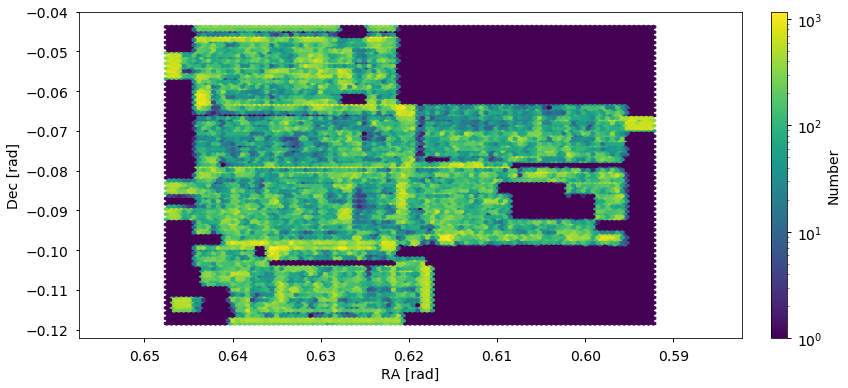

In [132]:
fig, ax = plt.subplots(figsize=(13, 6))

m = merge['oxford_ks_id']==999999




im = ax.hexbin(
    merge[m]['VISTA_Ks_m_coord_ra'], 
    merge[m]['VISTA_Ks_m_coord_dec'],  
    bins="log")#cmap='Oranges',, cmap='Greys'

fig.colorbar(im, ax=ax, label="Number",fraction=0.046, pad=0.04)
ax.set_xlabel('RA [rad]')
ax.set_xlim([np.nanmax(merge[m]['VISTA_Ks_m_coord_ra'])+0.01, np.nanmin(merge[m]['VISTA_Ks_m_coord_ra'])-0.01])
ax.set_ylabel('Dec [rad]')
fig.savefig('./figs/not_in_ox_density.pdf', bbox_inches='tight')
fig.savefig('./figs/not_in_ox_density.png', bbox_inches='tight')

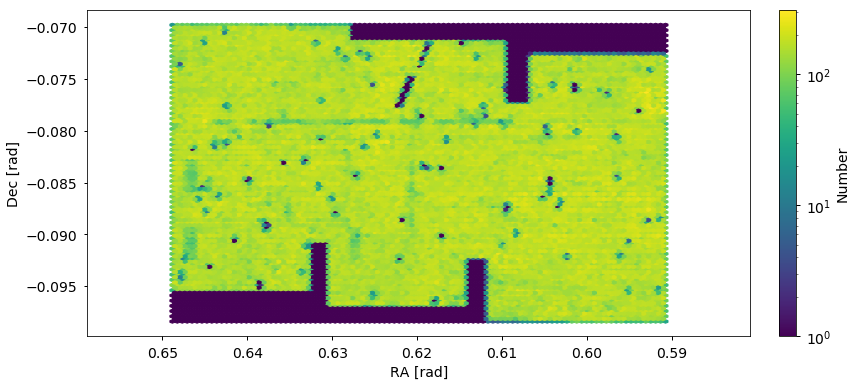

In [133]:
fig, ax = plt.subplots(figsize=(13, 6))

m = merge['id']==999999
m&=merge['oxford_ks_ra']>0



im = ax.hexbin(
    merge[m]['ra'], 
    merge[m]['dec'],  
    bins="log")#cmap='Oranges',, cmap='Greys'

fig.colorbar(im, ax=ax, label="Number",fraction=0.046, pad=0.04)
ax.set_xlabel('RA [rad]')
ax.set_xlim([np.nanmax(merge[m]['ra'])+0.01, np.nanmin(merge[m]['ra'])-0.01])
ax.set_ylabel('Dec [rad]')
fig.savefig('./figs/not_in_lsst_density.pdf', bbox_inches='tight')
fig.savefig('./figs/not_in_lsst_density.png', bbox_inches='tight')

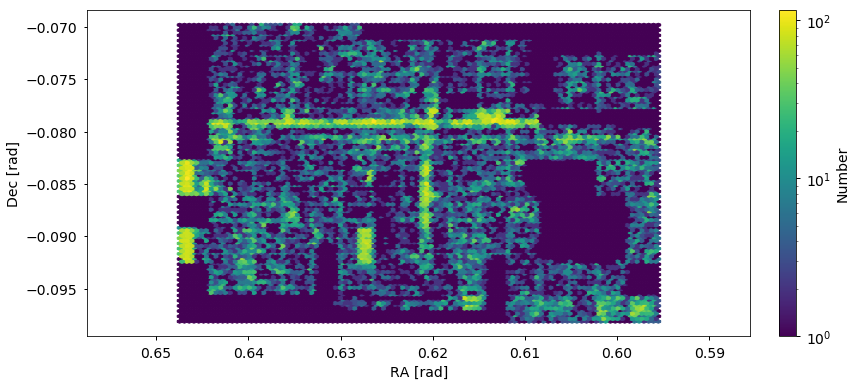

In [134]:
fig, ax = plt.subplots(figsize=(13, 6))

m = merge['id']!=999999
m&=merge['oxford_ks_ra']>0




im = ax.hexbin(
    merge[m]['ra'], 
    merge[m]['dec'],  
    bins="log")#cmap='Oranges',, cmap='Greys'

fig.colorbar(im, ax=ax, label="Number",fraction=0.046, pad=0.04)
ax.set_xlabel('RA [rad]')
ax.set_xlim([np.nanmax(merge[m]['ra'])+0.01, np.nanmin(merge[m]['ra'])-0.01])
ax.set_ylabel('Dec [rad]')
fig.savefig('./figs/in_both_density.pdf', bbox_inches='tight')
fig.savefig('./figs/in_both_density.png', bbox_inches='tight')